# Case Study for Advanced Omics Course at Wageningen University
## Replications Study for:  
## "Multi-omics analysis of fecal samples in colorectal cancer Egyptians patients: a pilot study"

_Tasos Aridas_ $^1$, _Elias Mert Mayadag_ $^2$ and _Angeliki Vosdogali_ $^1$

**Supervised by:**
Dr. Cristina Furlan $^3$

$^1$ Student of Bioinformatics MSc., Wageningen University and Research  
$^2$ Student of Biotechnology MSc., Wageningen University and Research  
$^3$ Systems and Synthetic Biology, Wageningen University and Research  


## Introduction
###### by _Elias Mert Mayadag_  
<br>

Colorectal cancer (CRC) is the second deadliest cancer type worlwide (1) and consists of colon and rectal cancers. Both these parts of the body are known to be inhabited by a large number of bacteria, archaea, viruses, protozoans, and fungi, which renders this consortium referred as human microbiome a direct factor of impact to human health (2). Previously, dysbiosis of this microbiome was associated with CRC and increasing body of research indicates that the correlation observed in the changes of gut microbiome with CRC may even have causal relationship (3,4). 

In 2023, Khattab _et al._ published in BMC Microbiology journal an article named "Multi-omics analysis of fecal samples in colorectal cancer Egyptians patients: a pilot study" (5). In our present research, we perform a replication study within 3 weeks, using publicly available meta-omics data from Khattab *et al.* to confim their findings, assess their committment to FAIR (Findable, Accessable, Interoperable, Reusable) data principles, detect possible shortcomings and possibly offer suggestions. <br>
<br>
The research of Khattab et al. compares fecal samples from four female post-menopause CRC patients with different medical trajectories to a healthy female individual of similar characteristics, in terms of metagenomics, metaproteomics and metametabolomics. They perform both the next-generation sequencing for genomics and the LC-MS/MS analyses for proteomics and metabolomics at BGI, China in Hong Kong. After analyzing the raw data from LC-MS/MS using Compound Discoverer 3.1 of Thermo Fisher Scientific, they annotate the data  by employing publicly available omics analysis tools for genomic and protein analysis, such as GraPhlAn, HUMAnN2, UniProtKB, KEGG database, and rely on the combined use of BGI Library, mzCloud and ChemSpider databases for metabolite annotation.<br>

These four colorectal cancer groups were defined as follows;
- Colectomy (partial removal of colon), followed by Folfiri treatment<br>
- Colectomy (partial removal of colon), followed by Folfox treatment, patient currently stable<br>
- Liver metastatic colorectal cancer, treated with Folfiri, Folfox, combined Xelox and Gemcitabine<br>
- Colectomy (partial removal of colon), treated with Folfox, Folfiri, Mitomycin C, combined Xelox, Gemcitabine and Avastin<br>
  but the patient developped recurrence<br>


Their findings state differential microbial presence in different CRC patients compared to the healthy individual, with 158 differentially expressed proteins and 158 differential metabolites in feces, defined as 1.2 or higher fold change after log2 transformation. Further, using enrichment and functional analyses, they say to have identified differentially active pathways in the gut microbiome consortium.<br>

By analyzing their publicly available data, in this research, we explore in three different sections to each of these meta-omics approaches and confirm the concordance of main findings with the literature, yet observe main limitations regarding FAIR data use guidelines and the consensus between the claimed findings and available data.


1) Menon G, Cagir B. Colon Cancer. [Updated 2025 Feb 27]. In: StatPearls [Internet]. Treasure Island (FL): <br>
   StatPearls Publishing; 2025 Jan-. Available from: https://www.ncbi.nlm.nih.gov/books/NBK470380/
2) Belizário and Napolitana (2015), Human microbiomes and their roles in dysbiosis, common diseases, and novel therapeutic approaches
3) Belizário et al (2018), Gut Microbiome Dysbiosis and Immunometabolism:New Frontiers for Treatment of Metabolic Diseases
4) Wong et al. (2023), Gut microbiota in colorectal cancer development and therapy
5) Khattab et al. (2023) Multi-omics analysis of fecal samples in colorectal cancer Egyptians patients: a pilot study

## Data Availability
###### by _Elias Mert Mayadag_  
<br>
All the raw data used in this Jupyter Notebook are stored in the folder named "data",<br>
All the files that are created during the analysis, as well as the images obtained from web-sources such as literature or web-based tools, including Reactome, MetaboAnalyst etc., are stored in the "results" file.<br><br>
Both files are publicly available in the OneDrive folder with the following link: <br>

https://1drv.ms/f/c/6e85cd1c5d60d57a/Eocs-iQrm8NLh8t4XoTAbaIBhmVz5YjPh15h1Vq4D3Ac3g?e=S2wR9H
<br><br>
Additionally, this Jupyter Notebook sheet is made available with NBviewer.com for better readability under the following link:<br>
https://nbviewer.org/github/EliasWUR/SSB57306-Metaomics-Case-Study/blob/e8b35d3b0b78ca8f8d0ca794639943c3a93d5c23/Elias%20Mayadag%20-%20SSB57306%20Case%20Study.ipynb


# 1) Metagenomics

###### Analyzed by _Tasos Aridas_
###### Edited by _Elias Mert Mayadag_

### Overview of Metagenomics Section

Available raw next-generation sequencing data from the article included forward and reverse reads. First, these sequence were quality checked with FastQC and MultiQC to ensure the reads were already trimmed and quality filtering was applied.

Ideally, taxonomic and functional profiling of the microbial consortium was to be performed per sample. For the taxonomic profiling, we wanted to apply two approaches. 

**Im the first approach**, the pair-end reads would be mapped to MetaPhlan database for taxonomic annotation, which would also identify relative abundances. Further, these sequencing reads would be mapped to HUMAnN platform, to identify the functional potential of the microbiome community, by identifying present gene families. 

**Using a second approiach**, we wanted to assemble the reads by MEGAHIT and bin the resulting metagenome-assembled genomes (MAGs) using METABAT. Consequently, the bins would be analyzed with tools like Prodigal and eggNOG-mapper for functional profiling.

**By comparing two approaches**, functional potential of the microboime community from the first approach could be combined with the higher-resolution, more accurate strain-level MAGs, which could even give insights into rare metabolic pathways or species not covered by the first approach.

In the following, we demonstrate the taxonomic profiling and relative abundance analysis from the first approach as well as the assembly and binning steps from the second approach. Due to time limitation, the functional profiling could not be performed with any of the approaches.

In [1]:
import gzip
import os
from pathlib import Path
import subprocess
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

## 1.1.) First Approach

### 1.1.1) Data Preparation

The SRR accession number from Khattab _et al.(2023)_ was used to download the raw sequences in compressed FASTQ format using the "Faster Download and Extract Reads in FASTQ
format from NCBI SRA" (Galaxy Version 3.1.1+galaxy1) with default parameters.

Four output files are created, specifically 
- the log,
- Other data
- single-end data and
- paired-end data.

However, the data was faulty and contained the paired-end reads inside the "single-end" file, whereas the "paired-end" file was empty.

The forward and reverse reads were not structured in an interleaved manner but all forwards reads were listed first, followed by the list of reverse reads. Using the following code, we identified the line where the list of reverse reads begin and thus, divided the part of reads belonging to reverse reads.

Note that for sample SRR21948630 the reverse reads preceded the forward reads.

In [4]:
input_dir = Path("../../space_mounts/omics_data/Metaomics_case")
output_dir = Path("Metagenomics/qc_output")
data_storage_dir = Path("../../space_mounts/omics_data/Metaomics_case/metagenomics_data")
split_dir = data_storage_dir / "split_reads"
fastqc_before_dir = output_dir / "fastqc_raw"  
multiqc_dir = output_dir / "multiqc"

In [61]:
fastq_files = sorted(input_dir.glob("*.f*q*gz"))
split_line_per_sample = {}

for file in fastq_files:
    file_name = str(file).split('/')[-1].split('.')[0]
    if file_name.endswith('30'):
        line_cmd = f"zcat {file} | awk 'NR % 4 == 1 && /\\/1/ {{ print NR; exit }}'"
    else:
        line_cmd = f"zcat {file} | awk 'NR % 4 == 1 && /\\/2/ {{ print NR; exit }}'"
    result = subprocess.run(line_cmd, shell=True, capture_output=True, text=True)
    split_line = result.stdout.strip()
    split_line_per_sample[file_name] = int(split_line)
    # print(f'The split line for {file_name} is {split_line}')
    second_cmd =  f"zcat {file} | awk -v x={split_line} 'x-10 <= NR && NR <= x+10 \
                                        {{ if (NR == x) print \">> \" $0; else print $0 }}'"

    result = subprocess.run(second_cmd, shell=True, capture_output=True, text=True)
    # print(result.stdout)


NameError: name 'input_dir' is not defined

In [48]:
filez = '../../space_mounts/omics_data/Metaomics_case/SRR21948627.fastq.gz' # Sample SRR21948626 was split by replacing the file path

# Construct the shell command
cmd = f"zcat {filez} | awk 'NR % 4 == 1 && /\\/2/ {{ print NR; exit }}'"
# Run the command and capture the output
result = subprocess.run(cmd, shell=True, capture_output=True, text=True)

split_line = result.stdout.strip()

In [53]:
basename = filez.split('/')[-1].split('.')[0]
# === FILE PATHS ===
r1_path = os.path.join(split_dir, f"{basename}_R1.fastq.gz")
r2_path = os.path.join(split_dir, f"{basename}_R2.fastq.gz")

# === COMMANDS ===
# Forward reads (head)
head_cmd = f"zcat {filez} | head -n {int(split_line) - 1} | gzip > {r1_path}"
# Reverse reads (tail)
tail_cmd = f"zcat {filez} | tail -n +{int(split_line)} | gzip > {r2_path}"

# === RUN ===
subprocess.run(head_cmd, shell=True, check=True)
subprocess.run(tail_cmd, shell=True, check=True)


CompletedProcess(args='zcat ../../space_mounts/omics_data/Metaomics_case/SRR21948626.fastq.gz | tail -n +211136505 | gzip > ../../space_mounts/omics_data/Metaomics_case/metagenomics_data/split_reads/SRR21948626_R2.fastq.gz', returncode=0)

In [5]:
for basename in ['SRR21948628', 'SRR21948629']:

    file_path = f'../../space_mounts/omics_data/Metaomics_case/{basename}.fastq.gz'
    
    r1_path = os.path.join(split_dir, f"{basename}_R1.fastq.gz")
    r2_path = os.path.join(split_dir, f"{basename}_R2.fastq.gz")

    line_cmd = f"zcat {file_path} | awk 'NR % 4 == 1 && /\\/2/ {{ print NR; exit }}'"
    result = subprocess.run(line_cmd, shell=True, capture_output=True, text=True)
    split_line = result.stdout.strip()
    print(f'split line is {split_line}')
    

# === COMMANDS ===
# Forward reads (head)
    head_cmd = f"zcat {file_path} | head -n {int(split_line) - 1} | gzip > {r1_path}"
# Reverse reads (tail)
    tail_cmd = f"zcat {file_path} | tail -n +{int(split_line)} | gzip > {r2_path}"

# === RUN ===
    subprocess.run(head_cmd, shell=True, check=True)
    print(f'forward read file for {basename} is complete') 
    subprocess.run(tail_cmd, shell=True, check=True)
    print(f'reverse read file for {basename} is complete') 

split line is 216144921
forward read file for SRR21948628 is complete
reverse read file for SRR21948628 is complete
split line is 211064121
forward read file for SRR21948629 is complete
reverse read file for SRR21948629 is complete


In [6]:
last_file = '../../space_mounts/omics_data/Metaomics_case/SRR21948630.fastq.gz'

# Construct the shell command
last_cmd = f"zcat {last_file} | awk 'NR % 4 == 1 && /\\/1/ {{ print NR; exit }}'"
# Run the command and capture the output
result = subprocess.run(last_cmd, shell=True, capture_output=True, text=True)

split_line = result.stdout.strip()
print(split_line)

209895049


In [7]:
basename = last_file.split('/')[-1].split('.')[0]

r1_path = os.path.join(split_dir, f"{basename}_R1.fastq.gz")
r2_path = os.path.join(split_dir, f"{basename}_R2.fastq.gz")

# === COMMANDS ===
# Forward reads (head)
head_cmd = f"zcat {last_file} | head -n {int(split_line) - 1} | gzip > {r1_path}"
# Reverse reads (tail)
tail_cmd = f"zcat {last_file} | tail -n +{int(split_line)} | gzip > {r2_path}"

# === RUN ===
subprocess.run(head_cmd, shell=True, check=True)
subprocess.run(tail_cmd, shell=True, check=True)

CompletedProcess(args='zcat ../../space_mounts/omics_data/Metaomics_case/SRR21948630.fastq.gz | tail -n +209895049 | gzip > ../../space_mounts/omics_data/Metaomics_case/metagenomics_data/split_reads/SRR21948630_R2.fastq.gz', returncode=0)

#### 1.1.2) Quality Control of the reads
After the separation of forward and reverse reads into two separate groups, raw reads were quality-checked by FastQC, followed by quality check of each file by MultiQC (Ewels et al, 2010). This step confirmed that reads were trimmed and low-quality reads were removed.

#### 1.1.3) Contamination Control of the reads

To confirm the sequences were not of human origin and did not contain PhiX sequences (viral DNA sequences introduced during sequencing for quality control), BBduk platform was used with the paired end reads. To this end, the PhiX genome sequence was obtained manually from the following website and inputted along with the paired-end reads into bbduk:

https://www.ncbi.nlm.nih.gov/nuccore/NC_001422.1?report=fasta 

No PhiX sequences were identifyied, indicateing the previous preprocessing by the authors.

In [62]:
split_fastq_files = sorted(split_dir.glob("*.f*q*gz"))
for file in split_fastq_files:
    !fastqc -o {fastqc_before_dir} {file} -qq


NameError: name 'split_dir' is not defined

In [13]:
!multiqc Metagenomics/qc_output/fastqc_raw -o Metagenomics/qc_output/multiqc


/// ]8;id=365831;https://multiqc.info\MultiQC]8;;\ 🔍 v1.29

       file_search | Search path: /files/Metagenomics/qc_output/fastqc_raw
         searching | ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 20/20  lm  
            fastqc | Found 10 reports
     write_results | Data        : Metagenomics/qc_output/multiqc/multiqc_data
     write_results | Report      : Metagenomics/qc_output/multiqc/multiqc_report.html
           multiqc | MultiQC complete


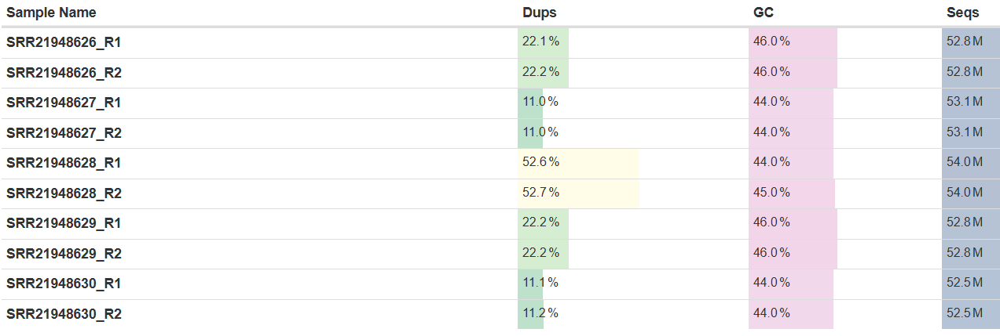

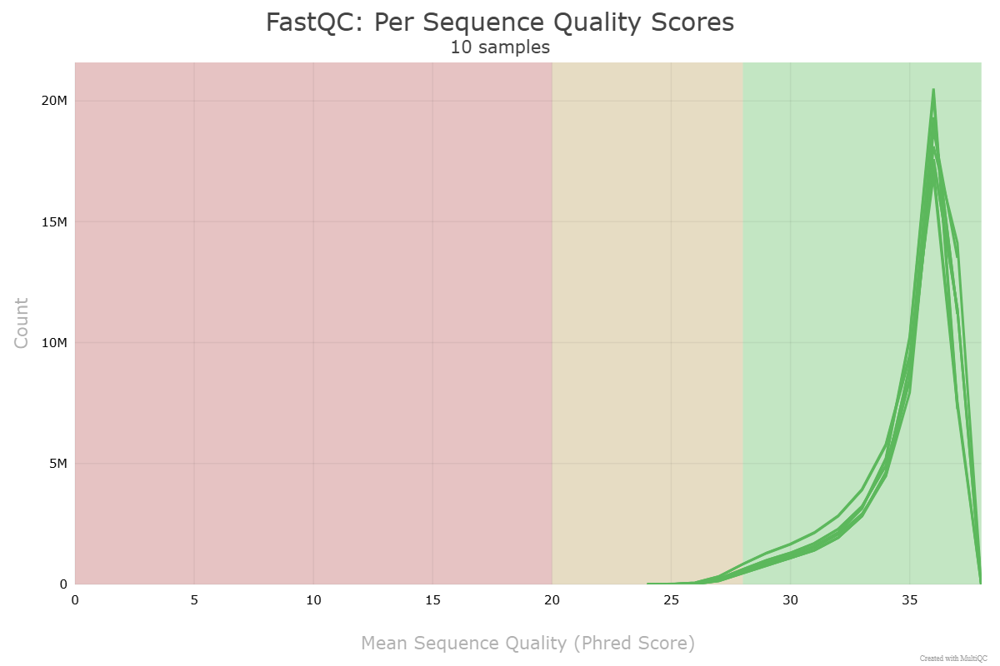

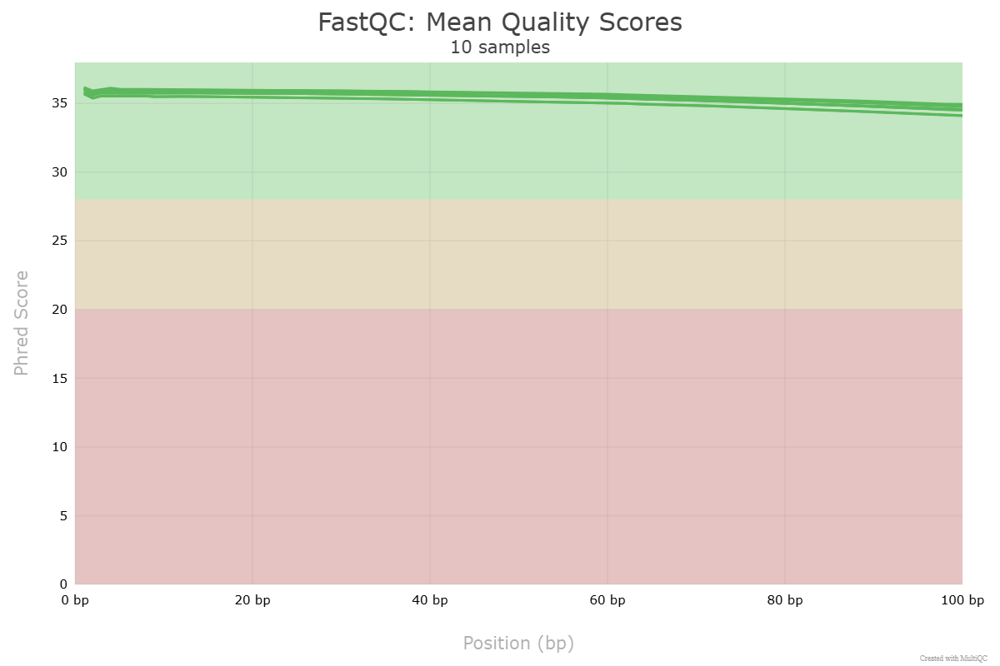

In [ ]:
phix_ref = "/space_mounts/omics_data/Metaomics_case/genomes/phix_db/phix.fa"

for sample_name in ['SRR21948627', 'SRR21948628', 'SRR21948629', 'SRR21948630']:
    r1 = f"{sample_name}_R1.fastq.gz"
    r2 = f"{sample_name}_R2.fastq.gz"
    work_dir = "../space_mounts/omics_data/Metaomics_case/metagenomics_data/bbmap_output"
    os.makedirs(work_dir, exist_ok=True)

    r1_nophi = os.path.join(work_dir, f"{sample_name}_nophi_R1.fastq")
    r2_nophi = os.path.join(work_dir, f"{sample_name}_nophi_R2.fastq")
    bbduk_stats = os.path.join(work_dir, f"{sample_name}_bbduk_stats.txt")

    bbduk_cmd = [
        "bbduk.sh",
        f"in1={split_dir/r1}",
        f"in2={split_dir/r2}",
        f"out1={r1_nophi}",
        f"out2={r2_nophi}",
        f"ref={phix_ref}",
        "k=31",             # k-mer size
        "hdist=1",          # allow 1 mismatch
        f"stats={bbduk_stats}",
        "overwrite=true"
]
    print("Running BBDuk to remove PhiX...")
    subprocess.run(bbduk_cmd, check=True)
    print("PhiX removal complete.")

## 1.2) Second Approach

### 1.2.1) Taxonomy Identification and Relative Abundances 

Each pair of forward and reverse fastq files were introduced to MetaPhlAn (Galaxy Version 4.1.1+galaxy4) with the following parameters:
- Minimum length of the reads to be considered when parsing the input file: 70
- Presets options for BowTie2: Very sensitive
- Minimum mapping quality value (MAPQ): 5
- Database with clade-specific marker genes: mpa_vOct22_CHOCOPhlAnSGB_202212-03042023
- Type of analysis to perform: Profiling a microbiota in terms of of relative abundances with output for all taxonomic levels
- The rest: default except
- Organisms to profile => Profile viral organisms: None

In [11]:
taxon_tables = sorted(Path('/files/Metagenomics/taxon_tables').glob("*.tabular"))

In [42]:
samples_dataframes = {}
for i, table in enumerate(taxon_tables):
    df = pd.read_table(table, sep='\t', comment='#', header=None, names=['clade_name','NCBI_tax_id',
                                                'relative_abundance','additional_species'])

    df = df[df['clade_name'].str.contains('s__')]

    df['species'] = df['clade_name'].apply(
        lambda x: next((part.replace('s__', '') for part in reversed(x.split('|')) if part.startswith('s__')), None))

    samples_dataframes[f'Sample_{26 + i}'] = df[['species','relative_abundance']]
    top20 = df.sort_values(by="relative_abundance", ascending=False).head(20)

plt.figure(figsize=(6, 3))    sns.barplot(x="relative_abundance", y="species", data=top20)
    plt.xlabel("Relative Abundance")
    plt.ylabel("Species")
    plt.title(f"Sample {26 + i}")
    plt.tight_layout()
    plt.show()

SyntaxError: invalid syntax (2298068684.py, line 14)

The microbial composition and the relative abundances of the ten most abundant species found in the samples leads to the grouping of sample 26 with sample 29 and sample 27 with sample 30, while sample 28 stands out on its own. For the first pair, Phocaeicola vulgatus is the most abundant species, a species commonly found in the human gut (Da Silva et al, 2024), while two Bacteroides species are also present, again a commonly found species (Zafar, Saier, 2021). These three species are also present in the other samples as well but in smaller abundances. Interestingly, three species of Alistipes also appear in samples 26 and 29, which are not found in the other samples. Although Alistipes is present in the gut microbiome, it is found in lower abundances compared to other common species in healthy adults, but in these samples it seems to be overrepresented. Alistipes is associated with pathogeny in colorectal cancer, which could explain the elevated abundance levels (Parker et al, 2020). 
On samples 27 and 30, Prevotella copri is the most abundant species, followed by three unknown. Same as in the case of Alistipes, Prevotella is found at lower abundances in the healthy gut but increased presence has been found in patients suffering from colon cancer (He et al, 2021). Why Alistipes is overrepresented in one group and Prevotella in the other group, however, cannot be deduced. Finally, sample 28 seems to have a relative abundance of more than 60 for Prevotella with very small abundances for the other microbes. This is the sample with more than 50% duplicate reads, therefore these results are not trustworthy and the abundance of Prevotella is most likely exaggerated by the duplication. Nonetheless, the underrepresentation of the rest of the species is peculiar. 

To gain more insight as to whether this grouping of samples is indeed real, PCA was conducted on the relative abundances of species identified across the five samples.

In [36]:
samples_dataframes['Sample_29'].head()

,species,relative_abundance
323,Phocaeicola_vulgatus,12.33087
324,Alistipes_putredinis,11.18622
325,Bacteroides_stercoris,10.52113
326,GGB1573_SGB2160,9.43404
327,Alistipes_onderdonkii,3.95653


In [39]:
long_format = []

for sample_name, df in samples_dataframes.items():
    df = df.copy()
    df.columns = ['Species', 'Abundance']  # Ensure consistent column names
    df['Sample'] = sample_name
    long_format.append(df)

combined_df = pd.concat(long_format, ignore_index=True)
wide_df = combined_df.pivot_table(index='Sample', columns='Species', values='Abundance', fill_value=0)

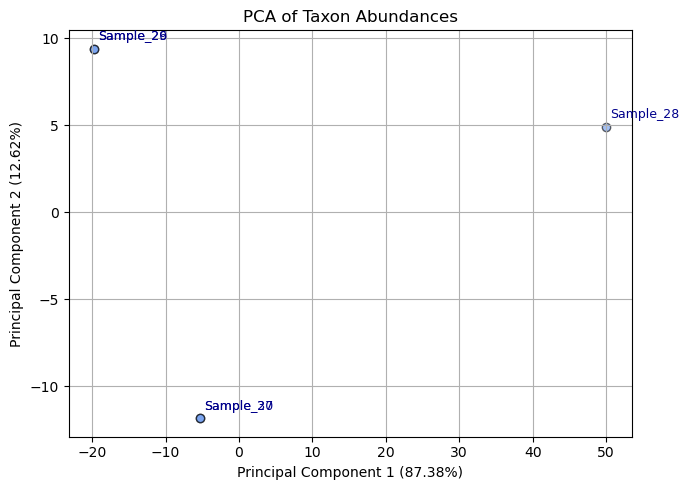

In [26]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(wide_df)

explained_var = pca.explained_variance_ratio_
pc1_var = explained_var[0] * 100
pc2_var = explained_var[1] * 100

pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'], index=wide_df.index)

plt.figure(figsize=(7, 5))
plt.scatter(pca_df['PC1'], pca_df['PC2'], color='cornflowerblue', edgecolor='black', alpha=0.6)

# Annotate each point with its index
for idx in pca_df.index:
    plt.text(pca_df.loc[idx, 'PC1'] + 0.5, pca_df.loc[idx, 'PC2'] + 0.5, idx,
             fontsize=9, color='darkblue')

plt.title('PCA of Taxon Abundances')
plt.xlabel(f'Principal Component 1 ({pc1_var:.2f}%)')
plt.ylabel(f'Principal Component 2 ({pc2_var:.2f}%)')
plt.grid(True)
plt.tight_layout()
plt.show()


As can be seen in the PCA plot above, the first PC explains a staggering and not realistic 87,38% of the total variance, while PC2 explains 12,62%. Although the groupings of the samples are visible here, as shown previously from the MetaPhlAn results, all samples except sample 28 are quite similar to each other. Sample 28 is the most distinct one, but again this could due to the duplications of the reads.

### 1.2.2) Metagenomic Assembly 

Using this approach, we aimed to build metagenome-assembled genomes (MAGs) that can be further used for functional analysis.

#### 1.2.2.1) Contig Preparation

Per sample, i.e. patient, raw fastq files were were assembled to contigs using MEGAHIT (Galaxy Version 1.2.9+galaxy2) tool designed for metagenomic assembly with default parameters:
- Minimum multiplicity for filtering (k_min+1)-mers: 2
- Comma-separated list of kmer size = 21,29,39,59,79,99,119,141
- Minimum length of contigs to output = 200

Nevertheless, the small lenth of some generated contigs made many of them unsitable for further use during binning, and we would suggest selecting a minimum lentgh 1500 or higher.

#### 1.2.2.2) Quality Assessment of Assemblies with QUAST
(Galaxy Version 5.3.0+galaxy0)....

#### 1.2.2.3) Binning of Contigs to MAGs

The creation of MAGs requires depth values for each contig. To provide these as a table, we used Bowite2 (Galaxy Version 2.5.3+galaxy1) to align the paired-end reads to the newly-formed contigs from the previous step. Forward and reverse files were inputted as a paired library with the default "paired-end" options to build the index. 

The resulting BAM files was sorted with samtools (Galaxy Version 2.0.6) and the contig depth table was created with the tool Calculate contig depthsfor MetaBAT2 (Galaxy Version 2.17+galaxy0). To this end, The BAM file was entered in the "process BAM file" using one-by-one mode without a selected reference genome and default sttings.

Then, MetaBAT2 metagenome binning (Galaxy Version 2.17+galaxy0) was used for binning.

The assembly fasta file was submitted with the Advanced Options:
- Input type of the contig depth table: Tabular depth matrix file (mean and variance of base coverage depth.)
- The rest: default
- Minimum size of a contig for binning: 1500.

Since functional annotation of the reads was not possible with HUMaNn, the second apporach of the pipeline now follows, with the first step being the assembly of the reads per sample. MEGAHIT was used for metagenomics assembly (Galaxy Version 1.2.9+galaxy2) (Dinghua et al, 2015) of the raw fastq files originating from each sample, that is one assembly per sample. The forward and reverse fastq files were inputted into the tool using default parameters (minimum multiplicity for filtering (k_min+1)-mers = 2, Comma-separated list of kmer size = 21,29,39,59,79,99,119,141 and Minimum length of contigs to output = 200). In hindsight, the minimum length of the contigs could have been set to 1500 or a higher value, as the small length of some generated contigs restricts them from being used later on for binning.

The quality of the assemblies was assessed with metaQUAST (Galaxy Version 5.3.0+galaxy0) (Mikheenko et al, 2016), where the tool can be found as QUAST in Galaxy. Each assembly fasta file was inputted to the tool with assembly mode chosen as Individual, no customized names were used for the input file, the reads option was set to Disabled, Type of assembly was chosen as metagenome, so that metaQUAST is deployed instead of regular QUAST, SILVA was chosen as the reference database but crucially the Maximum number of reference genomes (per each assembly) to download after searching in the SILVA database was set to 0 to disable the option and all other parameters were left to default. No in-built tool was used for gene prediction.
Below is the cumulative contig length plot for the assembly from the reads of sample SRR21948626, which is representative for the other assemblies as well. The other plots are omitted to keep the notebook concise but they can be found in the html reports.

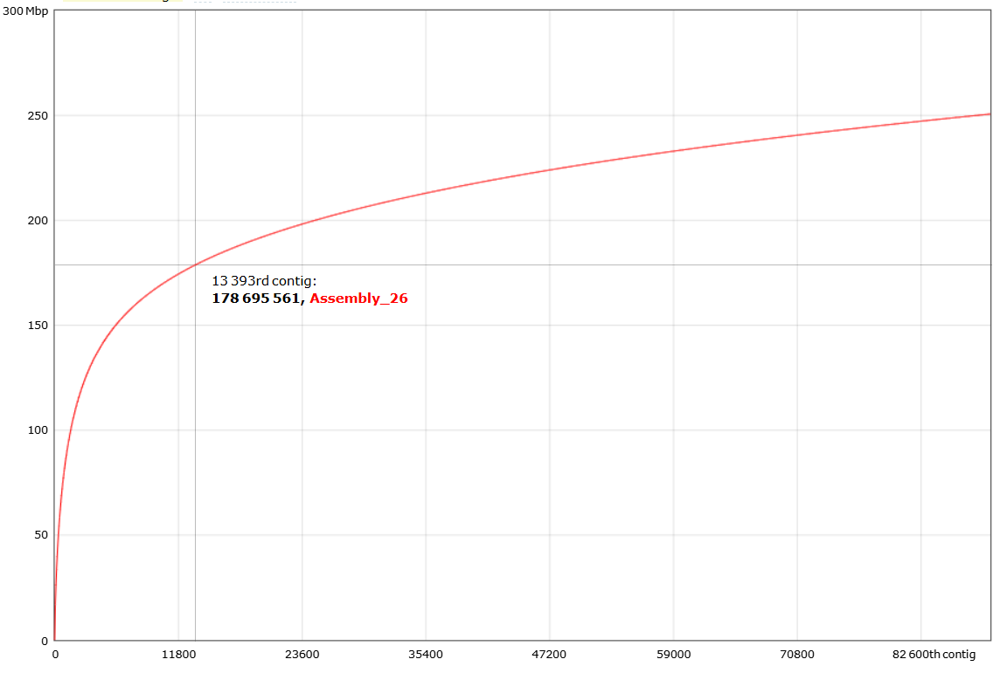

In [61]:
quast_tables = sorted(Path('/files/Metagenomics/quast_reports').glob("*.tabular"))
long_format = []

for table in quast_tables:
    sample_number = table.stem[-2:]
    df = pd.read_table(table)
    df.columns = ['Assembly_stats', f'Sample_{sample_number}']
    long_format.append(df)

combined_df = long_format[0]
for df in long_format[1:]:
    combined_df = pd.merge(combined_df, df, how =  'inner', on = 'Assembly_stats')

pd.options.display.float_format = '{:.0f}'.format
combined_df

,Assembly_stats,Sample_26,Sample_27,Sample_28,Sample_29,Sample_30
0,# contigs (>= 0 bp),159394,244920,109238,159362,244400
1,# contigs (>= 1000 bp),37821,65247,24218,37817,65204
2,Total length (>= 0 bp),277226079,415470712,159625125,277196219,415155130
3,Total length (>= 1000 bp),215440597,324009093,117068276,215425822,323905501
4,# contigs,89261,143623,58463,89244,143444
5,Largest contig,669751,745136,706464,669751,744831
6,Total length,250654770,377917918,140365451,250630708,377725511
7,GC (%),47,46,46,47,46
8,N50,12767,8434,7887,12767,8439
9,N90,806,803,739,806,804


As can be seen from the combined table, all samples have very high numbers of contigs, especially sample 27 and sample 30, where only about 15–25% of contigs are  larger than 1,000 bp, indicating that fragmentation is present, which makes sense to a certain point since these are metagenomic assemblies. Samples 27 and 30 also have the largest assemblies and the best N50 score metric, followed by samples 26 and 29 and finally sample 28 with the smallest one. Consequently, the pairing of samples 26 with 29 and samples 27 and 30 is evident here once more.

In order to construct MAGs by binning, a table with the depth values of each contig needs to be created first. For this purpose, the paired-end reads were aligned to their respective newly formed assembly with Bowtie2 (Galaxy Version 2.5.3+galaxy1) (Langmead, Salzberg, 2012). The forward and reverse files were inputted as a paired library with paired-end options left to default and the assembly was selected as the reference genome, with Bowtie2 taking care of building the index. As a preset, Bowtie2 was selected to run on Fast end-to-end mode (--fast) and the analysis mode was left to Default setting (simple).
The resulting BAM file was then sorted with samtools (Galaxy Version 2.0.6) (Li et al, 2009) and the contig depth table was created with the tool Calculate contig depthsfor MetaBAT2 (Galaxy Version 2.17+galaxy0), where the BAM file was inputted in the process BAM file One by one mode and no selected reference genome, with all other options set to default.
Binning was then conducted with MetaBAT2 metagenome binning (Galaxy Version 2.17+galaxy0) (Kang et al, 2019). The assembly fasta file was inputted and in the Advanced options the contig depth table was inputted as Tabular depth matrix file having mean and variance of base coverage depth. The rest of the parameters in the Advanced options were left to default, with critically the Minimum size of a contig for binning set to 1500.

#### 1.2.2.4) Quality Assessment of Bins

The tool checkm2 (Galaxy Version 1.0.2+galaxy1) was used for quality assesment of the bin.

The quality of the produced bins for each sample was assessed with checkm2 (Galaxy Version 1.0.2+galaxy1), an updated version of checkm that relies on machine learning to test bin quality.

Frequencies of quality tiers for sample 26
quality_tier
Low       36
Medium    28
High      18
Name: count, dtype: int64
Frequencies of quality tiers for sample 27
quality_tier
Low       74
Medium    50
High      19
Name: count, dtype: int64
Frequencies of quality tiers for sample 28
quality_tier
Low       29
Medium    14
High      13
Name: count, dtype: int64
Frequencies of quality tiers for sample 29
quality_tier
Low       41
Medium    27
High      19
Name: count, dtype: int64
Frequencies of quality tiers for sample 30
quality_tier
Low       74
Medium    43
High      22
Name: count, dtype: int64


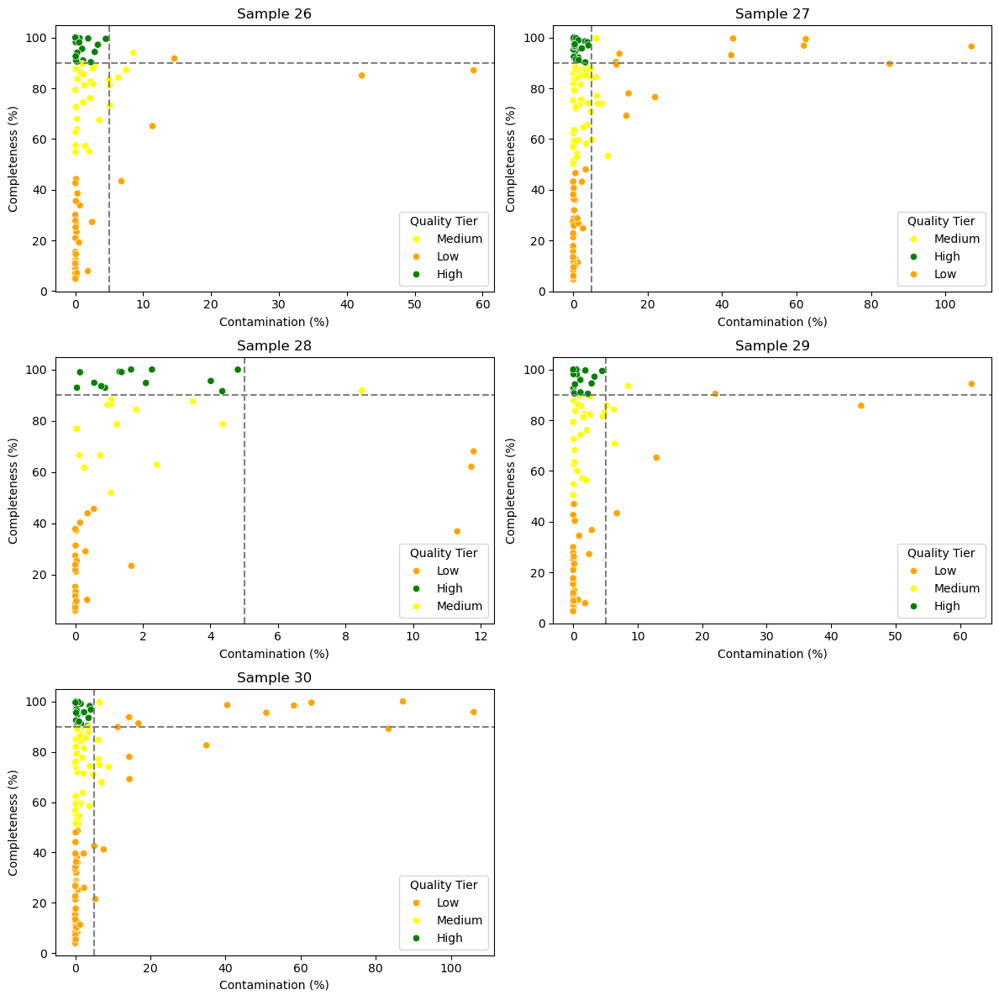

In [64]:
quality_report_tables = sorted(Path('/files/Metagenomics/checkm2_reports').glob("*.tabular"))
category_palette = {'High': 'green', 'Medium': 'yellow', 'Low': 'orange'}

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
axes = axes.flatten()

def tier(row):
    if row['Completeness'] >= 90 and row['Contamination'] <= 5:
        return 'High'
    elif row['Completeness'] >= 50 and row['Contamination'] <= 10:
        return 'Medium'
    else:
        return 'Low'

for idx, table in enumerate(quality_report_tables):
    df = pd.read_table(table)

    df['quality_tier'] = df.apply(tier, axis=1)
    print(f'Frequencies of quality tiers for sample {26 + idx}') 
    print(df['quality_tier'].value_counts())
    ax = axes[idx]
    sns.scatterplot(data=df, x='Contamination', y='Completeness', hue='quality_tier',
                    palette=category_palette, ax=ax)
    ax.axhline(90, ls='--', color='grey')
    ax.axvline(5, ls='--', color='grey')
    ax.set_xlabel('Contamination (%)')
    ax.set_ylabel('Completeness (%)')
    ax.set_title(f'Sample {26+idx}')
    ax.legend().set_title('Quality Tier')

for j in range(len(quality_report_tables), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


High quality MAGs were chosen as those with Completeness higher or equal to 90% and Contamination lower or equal to 5%, while Medium quality MAGs were chosen as those with Completeness higher or equal to 50% and Contamination lower or equal to 10%.
As can be seen from the above plots and frequency tables, all samples have roughly the same number of high quality MAGs except sample 28. Samples 26 and 29 had again a similar number of Low and Medium quality MAGs while samples 27 and 30 had similar numbers too but quite higher when compared to samples 26 and 29.

After investigating the quality of the MAGs, the next step that was planned was the estimation of the MAG abundances in the samples and their functional annotation. For abundance estimation, the tool CoverM genome (Galaxy Version 0.7.0+galaxy0) was used with the paired-end reads as input, providing no file with mapped reads to contigs, Assembly mode as Individual Assembly, Genome Definition as 'From FASTA files with each genome', as soure of FASTA files the bins from MetaBAT2 were selected and the aligner was chosen to be BWA instead of the default minimap, since the reads are short. All other options were set to default. However, the tool failed to provide an output, with the following error message: 'paired reads have different names: "SRR21948626.1", "SRR21948626.52784127"'. Due to the nature of the raw fastq files, where the forward reads were concatenated with the reverse reads, but with each individual header line being unique, CoverM fails to identify the corresponding pair of each read, therefore abundance calculation of the MAGs was not possible.

What is more, 

Notes:
Data are in Galaxy USA but some tools were only available on Galaxy Europe and were ran there, the data are all available on Galaxy USA for consistency. Also most parts of the analysis were performed on the raw fastq files that were available in Nuvolos and were uploaded locally to Galaxy. Since uploading took a really long time and due to having to save space in Galaxy later down in the analysis, the raw files were deleted from Galaxy and downloaded again from NCBI using the accession number. However, there seems to be a small difference in the size of the files compared to the original ones in Nuvolos, hence it is possible that the results of the tools might differ when the pipeline is re-run on the newest version of the raw data. 

References

(1) Khattab, R.H., Abo-Hammam, R.H., Salah, M. et al. Multi-omics analysis of fecal samples in colorectal cancer Egyptians patients: a pilot study. BMC Microbiol 23, 238 (2023). https://doi-org.ezproxy.library.wur.nl/10.1186/s12866-023-02991-x

(2) Philip Ewels, Måns Magnusson, Sverker Lundin, Max Käller, MultiQC: summarize analysis results for multiple tools and samples in a single report, Bioinformatics, Volume 32, Issue 19, October 2016, Pages 3047-3048,https://doi.org/10.1093/bioinformatics/btw354

(3) Blanco-Míguez, A., Beghini, F., Cumbo, F. et al. Extending and improving metagenomic taxonomic profiling with uncharacterized species using MetaPhlAn 4. Nat Biotechnol 41, 1633–1644 (2023). https://doi.org/10.1038/s41587-023-01688-w

(4) Dinghua Li, Chi-Man Liu, Ruibang Luo, Kunihiko Sadakane, Tak-Wah Lam, MEGAHIT: an ultra-fast single-node solution for large and complex metagenomics assembly via succinct de Bruijn graph, Bioinformatics, Volume 31, Issue 10, May 2015, Pages 1674–1676, https://doi.org/10.1093/bioinformatics/btv033

(5) Alla Mikheenko, Vladislav Saveliev, Alexey Gurevich, MetaQUAST: evaluation of metagenome assemblies, Bioinformatics, Volume 32, Issue 7, April 2016, Pages 1088–1090, https://doi.org/10.1093/bioinformatics/btv697

(6) Langmead, Ben, and Steven L. Salzberg. "Fast gapped-read alignment with Bowtie 2." Nature methods 9.4 (2012): 357-359.

(7) Heng Li, Bob Handsaker, Alec Wysoker, Tim Fennell, Jue Ruan, Nils Homer, Gabor Marth, Goncalo Abecasis, Richard Durbin, 1000 Genome Project Data Processing Subgroup, The Sequence Alignment/Map format and SAMtools, Bioinformatics, Volume 25, Issue 16, August 2009, Pages 2078–2079, https://doi.org/10.1093/bioinformatics/btp352

(8) Kang, D. D., Li, F., Kirton, E., Thomas, A., Egan, R., An, H., & Wang, Z. (2019). MetaBAT 2: an adaptive binning algorithm for robust and efficient genome reconstruction from metagenome assemblies. PeerJ, 7, e7359

(9) Chklovski, A., Parks, D.H., Woodcroft, B.J. et al. CheckM2: a rapid, scalable and accurate tool for assessing microbial genome quality using machine learning. Nat Methods 20, 1203–1212 (2023). https://doi.org/10.1038/s41592-023-01940-w

(10) Da Silva Morais, E., Grimaud, G.M., Warda, A. et al. Genome plasticity shapes the ecology and evolution of Phocaeicola dorei and Phocaeicola vulgatus. Sci Rep 14, 10109 (2024). https://doi.org/10.1038/s41598-024-59148-7

(11) Zafar, Hassan, and Milton H. Saier Jr. 2021. “Gut Bacteroides Species in Health and Disease.” Gut Microbes 13 (1). doi:10.1080/19490976.2020.1848158.

(12) Parker, B. J., Wearsch, P. A., Veloo, A. C., & Rodriguez-Palacios, A. (2020). The genus Alistipes: gut bacteria with emerging implications to inflammation, cancer, and mental health. Frontiers in immunology, 11, 906.

(13) He, T., Cheng, X., & Xing, C. (2021). The gut microbial diversity of colon cancer patients and the clinical significance. Bioengineered, 12(1), 7046–7060. https://doi.org/10.1080/21655979.2021.1972077

# 2) Metaproteomics Analysis of Khattab et al. (2023)


###### Analyzed by _Angeliki Vosdogali_
###### Partly edited by _Elias Mert Mayadag_

### Overview

In this section, the LC-MS/MS results for peptide analysis of Khattab _et al._ (2023) are analyzed in terms of their metaproteomic relevance for different CRC patient groups. This data is accessible in the PRIDE database with Project ID: PXD037271.

Additionally, the proteomics data from Tanca _et al._ (2022) is used (1) for reasons explained later. This data set can be found in the PRIDE database with project ID: PXD017467.

    1. Tanca et al. (2022). Metaproteomic Profile of the Colonic Luminal Microbiota From Patients With Colon Cancer. https://doi.org/10.3389/fmicb.2022.869523

### The analysis is divided into 4 parts:

##### 2.1) Creating a protein database
##### 2.2) Metaproteomics Analysis in Galaxy
##### 2.3) Taxonomical annotation
##### 2.4) Functional annotation 


## 2.1  Creating a protein database

To enable accureate peptide identification, a comprehensive protein database is required, against which the measured MS/Ms spectra can be matched. The two key metrics of experimental performance -sensitivity and specificity- are directly influenced by the database content and therefore, this content has a direct effect on producing reliable and reproducible results.

In our research, the computational power was a limiting factor and we opted for subsampling the database, which retains the most relevant proteins in the database, while reducing the computational load. Due to the limited nature of currently available resources, the ideal approach of tailoring the database arounf false discovery rate (FDR) thresholds, applying decoy strategies and iterative refinement to minimize fals positives were not performed.  

#### 2.1.1) Protein Sequences from Khattab et al.(2023) 

First, using the the code (Project ID: PXD037271) submitted by Khattab et al., the protein sequences were obtained and saved as "all-proteinSummary.xls" file.

In [11]:
!wget https://ftp.pride.ebi.ac.uk/pride/data/archive/2023/08/PXD037271/all-proteinSummary.xls -P data -qq

--2025-06-30 07:59:45--  https://ftp.pride.ebi.ac.uk/pride/data/archive/2023/08/PXD037271/all-proteinSummary.xls
Resolving ftp.pride.ebi.ac.uk (ftp.pride.ebi.ac.uk)... 193.62.193.165
Connecting to ftp.pride.ebi.ac.uk (ftp.pride.ebi.ac.uk)|193.62.193.165|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 174436 (170K) [application/vnd.ms-excel]
Saving to: ‘data/all-proteinSummary.xls’

all-proteinSummary. 100%[===================>] 170.35K  --.-KB/s    in 0.04s   

2025-06-30 07:59:45 (4.41 MB/s) - ‘data/all-proteinSummary.xls’ saved [174436/174436]



This data was then registered as a data fram "df" and investigated briefly.

In [14]:
import pandas as pd

# Read the “.xls” as a tab-delimited file
df = pd.read_csv("data/all-proteinSummary.xls",
                 sep="\t",
                 engine="python",
                 dtype=str)

df.head()

Total rows:     515
Rows with HUMAN: 515


As many primary protein IDs  had the "Human" annotations, the amount of human proteins were counted.

In [ ]:
# Filter out rows containing “HUMAN” anywhere
mask = df.apply(lambda col: col.str.contains("HUMAN", na=False)).any(axis=1)
filtered = df[~mask]

print("Total rows:    ", len(df))
print("Rows with HUMAN:", mask.sum())

As all the proteins seem to be of human origin, we double-checked this using Feces.fa database to confirm these annotations. (STEP NOT SHOWN HERE)

However, the main focus of or study is microbial meta-omics, we aimed for a database creation using either
- Data from metagenomics part of this study, or
- Data from a better annotated research.

Due to time limitations, we proceeded with the data from a better annotated research as an interim database until the metagenomics data from the Metagenomics part opf our research was completed. We opted for the article of  Tanca et al. (2022), because

- The data was derived from shotgun metagenomic sequencing
- It focused on CRC metagenomic profiling
- The data size did not exceed the limits of Nuvolos environment that we are employing in this research.

Even though their sampling protocol differed from Khattab et al., we decided to accept this variance for lack of a better option.

#### 2.1.2) Protein Sequences from Tanca et al. (2022)

The following steps describe:
1) Downloading the data from Tanca et al.(2022), (PRIDE project ID: PXD017467)
2) Full taxonomic profiling for quantification of relative abundances of each organism.
3) Random subsampling of 20% of each taxonomic unit for a representive yet computationally manageable reduced database.

In [3]:
!wget https://ftp.pride.ebi.ac.uk/pride/data/archive/2022/05/PXD017467/MG-DB_in_house.fasta -P data -qq

In [16]:
!head -n 5 data/MG-DB_in_house.fasta

>M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+
ILNVTPDSFYAGSRTQTEVEIARRVKQIVSEGAAIIDIGAYSSRPNADNVSAREEMERLRMGLKILFEIQPDAVVSVDTFRADVARMCVEEYGVAIINDIAAGEMDANMFHTVAALNVPYIMMHMQGTPQ
>M04067:32:000000000-C6TVP:1:1102:13195:11952_3_68_+
YEPLLKEIREDTNKWETIPSL
>M04067:32:000000000-C6TVP:1:1102:14329:22174_1_273_-


##### 2.1.2.1) Annotating Protein Sequences from Tanca et al. with BLASTP using DIAMOND

As this database lacked annotation, the annotations were obtained by performing a BLASTP (Camacho et al. 2009) search of the peptides, with DIAMOND tool (Buchfink et al. 2021), by means of mapping the peptides to the UniProt database (UniProt Consortium 2023). As larger databases was used such as NCBI, Nuvolos did not support the data size and crashed (NOT SHOWN). 

In fact, DIAMOND’s BLASTP mode replicates NCBI BLASTP semantics but runs 20–2,500× faster on large datasets, making it ideal for metagenomic scale (Buchfink et al. 2021).

Downloading Uniprot Database to run BLASTP and Unzip the file:

In [4]:
!wget ftp://ftp.uniprot.org/pub/databases/uniprot/current_release/knowledgebase/complete/uniprot_sprot.fasta.gz -P data -qq
!gunzip data/uniprot_sprot.fasta.gz -qq

gzip: data/uniprot_sprot.fasta already exists; do you wish to overwrite (y or n)? ^C


In [5]:
!pip install diamond -qq

Build a binary DIAMON database, as DIAMOND relies on a pre-indexed, optimized “.dmnd” file to perform ultra-fast sequence search instead of scanning raw FASTA every time (Buchfink et al. 2021).

In [6]:
!diamond makedb --in data/uniprot_sprot.fasta -d data/uniprot_sprot -qq

  File "/opt/conda/bin/diamond", line 113
    print "Diamond version %s" % (get_diamond_version())
    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
SyntaxError: Missing parentheses in call to 'print'. Did you mean print(...)?


In the code below, we run the BLASTP using DIAMOND with the parameters:

-q data/MG-DB_in_house.fasta specifies the exact FASTA of assembled metagenomic proteins to be annotated

-d data/uniprot_sprot points at the manually curated UniProt/Swiss-Prot database for high-confidence matches

-o results/hits.tsv writes the results into a dedicated “results” directory in tab-separated form for reproducible project structure

-f 6 qseqid sseqid limits the output to only the query identifier and its top subject hit, producing a minimal two-column table that streamlines downstream parsing.This was again chosen due to the minimum computational power it requires  

In [7]:
!diamond blastp -q data/MG-DB_in_house.fasta -d data/uniprot_sprot -o results/hits.tsv -f 6 qseqid sseqid -qq

  File "/opt/conda/bin/diamond", line 113
    print "Diamond version %s" % (get_diamond_version())
    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
SyntaxError: Missing parentheses in call to 'print'. Did you mean print(...)?


In the code below, the DIAMOND output file (results/hits.tsv) was first imported into a pandas DataFrame with the columns qseqid (query identifier) and sseqid (subject identifier). A regular expression was then applied to sseqid to extract the UniProt accession codes (the “P-series” identifiers), and any null or duplicate values were removed. The resulting set of unique accession numbers was written to results/accession_list.txt. This curated accession list can be submitted directly to the UniProt ID mapping service (UniProt Consortium. 2023) to retrieve organism names, avoiding the need to process the full alignment output.


In [22]:
import pandas as pd

hits = pd.read_csv("results/hits.tsv", sep="\t", header=None, names=["qseqid", "sseqid"])
hits["accession"] = hits["sseqid"].str.extract(r"\|(P\w+)\|")
hits["accession"].dropna().drop_duplicates().to_csv("results/accession_list.txt", index=False, header=False)

#### 2.1.2.2) Taxanomic Annotation of Proteins using UniPept

Using the UniProt ID‐mapping web tool (https://www.uniprot.org/id-mapping)(UniProt Consortium. 2023), we carried out the following workflow:

1) Accession upload
– Pasted or uploaded our list of accession numbers (one per line) generated in results/accession_list.txt in the search box.



2) Mapping setup
– Source database: “UniProtKB AC/ID”
– Target database: “UniProtKB”


3) Execution 
– Clicked “Start mapping,” waited for the job to complete.
The resulting table lists, for each input accession, its reviewed UniProt entry, standardized entry name, full protein name(s), source organism, gene name and length.


4) Field selection
– In the “ Customize Columns” panel we selected the following output fields:
• From (original accession)
• Reviewed (Swiss-Prot vs. TrEMBL status)
• Entry Name (UniProt mnemonic)
• Protein names (recommended and alternative names)
• Organism
(Basically gene name and length were filtered out because they were not needed at the moment.)

5) Download
 -Use .tsv output format and make sure the features you selected are present before downloading.

6) Upload the resulting tsv file in the results directory to continue with the analysis.


##### Removing Hits from Animal Kingdom

Upon reviewing the UniProt output, we identified several unexpected hits likely representing contaminants or non-native proteins.  In the code below, we therefore filter out these entries to retain only biologically relevant sequences.  The resulting data frame is then written to a file for downstream analysis

In [4]:
import pandas as pd
df = pd.read_csv("results/idmapping_2025_06_17.tsv", sep="\t")

exclude_list = [
    "Homo sapiens (Human)",
    "Mus musculus (Mouse)",
    "Rattus norvegicus (Rat)",
    "Bos taurus (Bovine)",
    "Canis lupus familiaris (Dog) (Canis familiaris)",
    "Oryctolagus cuniculus (Rabbit)",
    "Gallus gallus (Chicken)",
    "Nycticebus coucang (Slow loris)"
]

# Keep only rows where organism is NOT in the exclusion list
df_filtered = df[~df["Organism"].isin(exclude_list)]

num_removed = len(df) - len(df_filtered)
print(f"{num_removed} entries were excluded from the dataset.")

# Save cleaned table
df_filtered.to_csv("results/filtered_query_to_organism.tsv", sep="\t", index=False)

1623 entries were excluded from the dataset.


In [5]:
print(f"Filtered peptides: {len(df_filtered)}")
print(f"Uniltered peptides: {len(df)}")

Filtered peptides: 16650
Uniltered peptides: 18273


##### Combining BLASTP and UniPept Annotations

In this step, we load the raw DIAMOND alignment results and pull out the UniProt accession codes embedded in the subject identifiers so that we can tie each hit back to a known protein entry. We then read in a separate UniProt mapping file that pairs each accession with its organism of origin, and merge these two dataframes on the accession field. By doing so, every query sequence (qseqid) becomes annotated with the correct organism name. Writing out the final qseqid to Organism TSV gives us a clean, easy-to-use table for downstream tasks.


In [6]:

# Load DIAMOND hits
hits = pd.read_csv("results/hits.tsv", sep="\t", header=None, names=["qseqid", "sseqid"])

# Extract UniProt accession from the subject ID (e.g., sp|P29251|...)
hits["accession"] = hits["sseqid"].str.extract(r"\|([A-Z0-9]+)\|")

# Load UniProt mapping with 'Entry' and 'Organism' columns
mapping = pd.read_csv("results/filtered_query_to_organism.tsv", sep="\t")  

# Merge to map each query to organism
merged = pd.merge(hits, mapping[["Entry", "Organism"]], left_on="accession", right_on="Entry", how="left")

# Clean result
result = merged[["qseqid", "Organism"]]
result.to_csv("results/query_to_organism.tsv", sep="\t", index=False)

In [7]:
!head results/query_to_organism.tsv

qseqid	Organism
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Pneumocystis carinii
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Synechocystis sp. (strain ATCC 27184 / PCC 6803 / Kazusa)
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Bacillus subtilis (strain 168)
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Mycobacterium leprae (strain TN)
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Mycobacterium bovis (strain ATCC BAA-935 / AF2122/97)
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Mycobacterium tuberculosis (strain CDC 1551 / Oshkosh)
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Mycobacterium tuberculosis (strain ATCC 25618 / H37Rv)
M04067:32:000000000-C6TVP:1:1102:13195:11952_3_68_+	


##### Cleaning the Taxonomic Annotations
As seen from the output above, several entries lack any organism assignment and many bacterial hits differ only at the strain level. To address this, we will first drop all rows with blank Organism fields, removing uninformative noise. Next, we’ll collapse bacterial names by truncating each organism label to its first two words (genus and species), thereby merging all strain-level variants under a single species-level designation. These steps yield a, species-focused dataset that’s both informative and will help us with the subsampling.

In [11]:
import pandas as pd

df = pd.read_csv("results/query_to_organism.tsv", sep="\t")

# Drop rows where Organism is NaN or an empty string
df_clean = df[
    df["Organism"].notnull() &
    (df["Organism"].str.strip() != "")
]

# Count the number of occurrences for each qseqid
qseqid_counts = df_clean["qseqid"].value_counts()

# Number of unique qseqids
unique_qseqid_count = qseqid_counts.shape[0]

# Number of qseqids that appear more than once (duplicates)
duplicated_qseqid_count = (qseqid_counts > 1).sum()

# Total duplicate entries (all entries minus unique ones)
total_duplicate_entries = df_clean.shape[0] - unique_qseqid_count

print("Total unique qseqids:", unique_qseqid_count)
print("Number of qseqids that are duplicated (appear more than once):", duplicated_qseqid_count)
print("Total number of duplicate entries:", total_duplicate_entries)

Total unique qseqids: 22653
Number of qseqids that are duplicated (appear more than once): 15078
Total number of duplicate entries: 61615


The code below truncates each organism name to its first two words (genus and species), and saves the result as a new TSV

In [12]:
import pandas as pd

# Load TSV file
df = pd.read_csv("results/query_to_organism.tsv", sep="\t")

# Modify the "Organism" column: retain only the first two words (genus and species)
df["Organism"] = df["Organism"].apply(
    lambda x: " ".join(x.split()[:2]) if pd.notnull(x) else x
)

# Drop rows where Organism is null or an empty string
df_clean = df[
    df["Organism"].notnull() &
    (df["Organism"].str.strip() != "")
]

# Save the cleaned, modified DataFrame to a new file
df_clean.to_csv("results/query_to_organism_modified.tsv", sep="\t", index=False)

In [1]:
!head "results/query_to_organism_modified.tsv"

qseqid	Organism
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Pneumocystis carinii
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Synechocystis sp.
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Bacillus subtilis
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Mycobacterium leprae
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Mycobacterium bovis
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Mycobacterium tuberculosis
M04067:32:000000000-C6TVP:1:1101:16337:1334_1_390_+	Mycobacterium tuberculosis
M04067:32:000000000-C6TVP:1:1105:17046:19322_2_391_+	Streptococcus pyogenes
M04067:32:000000000-C6TVP:1:1105:17046:19322_2_391_+	Streptococcus pyogenes


After collapsing strain‐level labels to just genus and species, multiple entries that once differed only by strain now share the same organism name. This means a single qseqid can appear several times mapped to the identical species as seen above. Dropping duplicates on the (qseqid, Organism) pair ensures each sequence‐species mapping is recorded only once.


This step removes redundant mappings so that each query sequence (qseqid) is paired with any given species only once.

In [13]:
import pandas as pd

# Load modified mapping file (with organism names trimmed to the first two words)
df = pd.read_csv("results/query_to_organism_modified.tsv", sep="\t")

# Drop duplicate rows considering both qseqid and Organism.
collapsed = df.drop_duplicates(subset=["qseqid", "Organism"])

print(collapsed.head())

# Save the result to a new file.
collapsed.to_csv("results/query_to_organism_collapsed.tsv", sep="\t", index=False)

                                              qseqid              Organism
0  M04067:32:000000000-C6TVP:1:1101:16337:1334_1_...  Pneumocystis carinii
1  M04067:32:000000000-C6TVP:1:1101:16337:1334_1_...     Synechocystis sp.
2  M04067:32:000000000-C6TVP:1:1101:16337:1334_1_...     Bacillus subtilis
3  M04067:32:000000000-C6TVP:1:1101:16337:1334_1_...  Mycobacterium leprae
4  M04067:32:000000000-C6TVP:1:1101:16337:1334_1_...   Mycobacterium bovis


From the code above we can see that the duplicates (qseqid, Organism) pairs are removed

The code below takes the qseqid→Organism mapping and computes each species’ occurrence count, then selects the top twelve taxa and pools all remaining counts into an “Other” category. Finally, it renders a pie chart at-a-glance view of the relative abundances across the dataset.


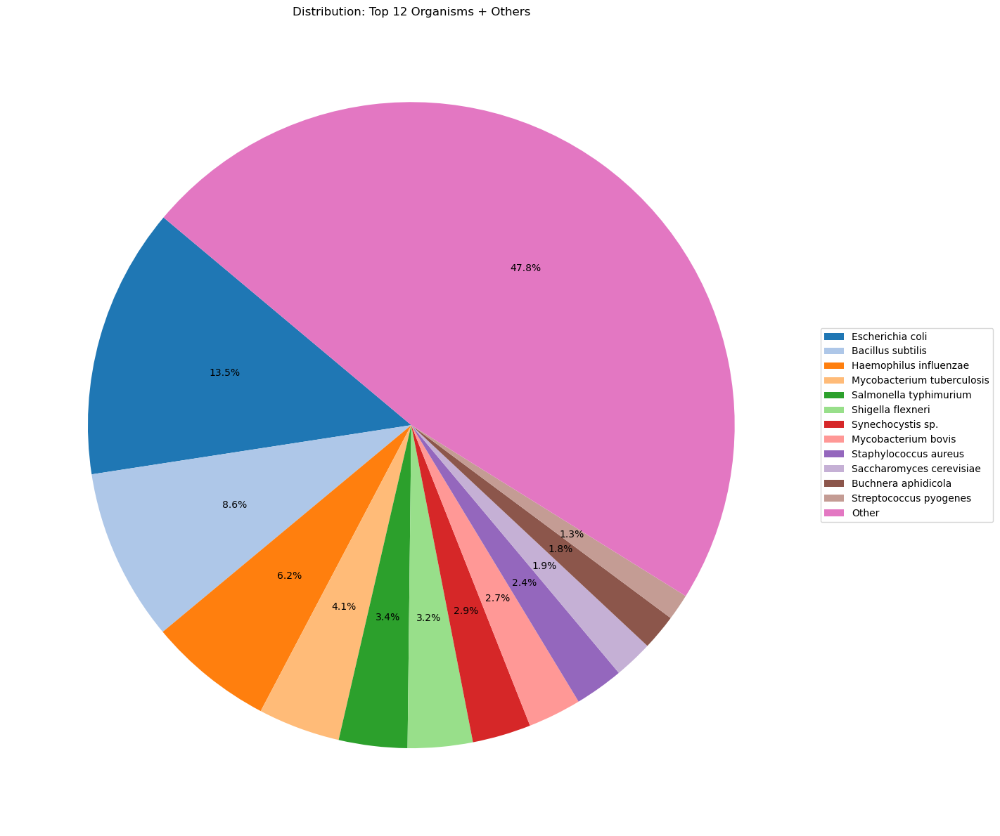

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Load  collapsed mapping file
df = pd.read_csv("results/query_to_organism_collapsed.tsv", sep="\t")

# Count the occurrences of each organism
org_counts = df["Organism"].value_counts()

# Extract the top 12 most abundant organisms
top12 = org_counts.iloc[:12]

# Sum the counts of the remaining organisms and label them as "Other"
other_sum = org_counts.iloc[12:].sum()

# Combine the top organisms with the "Other" category
final_counts = pd.concat([top12, pd.Series({"Other": other_sum})])

# Choose a qualitative colormap with enough distinct colors
cmap = plt.get_cmap("tab20")                  # tab20 has 20 distinct colors
colors = [cmap(i) for i in range(len(final_counts))]

# Plot
fig, ax = plt.subplots(figsize=(7, 6)) 
final_counts.plot(
    kind='pie',
    autopct='%1.1f%%',
    startangle=140,
    labels=[''] * len(final_counts),
    colors=colors,
    ax=ax
)

plt.title("Distribution: Top 12 Organisms + Others")
plt.ylabel("")  # Remove the default ylabel for a cleaner look

# Add legend
plt.legend(
    labels=final_counts.index,
    loc='center left',
    bbox_to_anchor=(1, 0.5)
)

plt.tight_layout()
plt.show()

In the context of a gut microbiome experiment involving colorectal cancer (CRC) patients, only a subset of the top 12 organisms listed in the image are clearly relevant.
Several organisms such Mycobacterium tuberculosis, Mycobacterium bovis, Haemophilus influenzae, Synechocystis sp., Streptococcus pyogenes, and Buchnera aphidicola are not typical gut residents and are unlikely to be biologically relevant in this context. Their presence may reflect sample contamination, sequencing artifacts, or environmental noise rather than true microbiome members. (The Human Microbiome project Consortium,2012)

To prepare a smaller yet taxonomically faithful dataset for pipeline testing, we load the strain-collapsed, deduplicated qseqid to Organism table and define a sampling function that drops groups with only a single hit (to eliminate potential mapping errors) and otherwise randomly selects 20 % of each species’ sequences, always retaining at least one record. By grouping the DataFrame by organism and applying this function, we maintain the relative taxonomic composition established in our earlier cleaning steps while substantially reducing the overall size, making the downstream analysis less computationaly intensive. 


In [17]:
import pandas as pd

# Load the collapsed mapping file
df = pd.read_csv("results/query_to_organism_collapsed.tsv", sep="\t")

# Define a function to sample a fraction of rows per group.
# If filter_singleton is True, groups with only one entry will be skipped.
def sample_group(x, frac=0.2, filter_singleton=True):
    if filter_singleton and len(x) == 1:
        # If there's only one record in this organism's group, we suspect it might be a mapping error.
        # Return an empty DataFrame to effectively discard it.
        return pd.DataFrame()
    else:
        # Otherwise, sample at least one entry (or a fraction of group size)
        n = max(1, int(len(x) * frac))
        return x.sample(n=n, random_state=42)

# Group by organism and apply the sampling with filtering for singletons
subsampled = df.groupby("Organism", group_keys=False).apply(lambda x: sample_group(x, frac=0.2, filter_singleton=True))

# Print out the number of rows in the resulting subsampled DataFrame
print("Total rows in subsampled file:", len(subsampled))

# Save the subsampled mapping to a TSV file for further processing.
subsampled.to_csv("results/query_to_organism_collapsed_subsampled.tsv", sep="\t", index=False)

Total rows in subsampled file: 12987


/tmp/ipykernel_222/1047295395.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  subsampled = df.groupby("Organism", group_keys=False).apply(lambda x: sample_group(x, frac=0.2, filter_singleton=True))


In [ ]:
!pip install biopython -qq

In this final step, we extract the subsampled sequences from our full FASTA database to create a focused dataset for pipeline testing. The script loads the set of selected qseqids from the TSV file, then iterates through the original FASTA with Biopython’s SeqIO, writing only those records whose IDs match our subsampled list.


In [18]:
import pandas as pd
from Bio import SeqIO

# Step 1: Load the subsampled TSV file to get the set of query IDs
subsampled_df = pd.read_csv("results/query_to_organism_collapsed_subsampled.tsv", sep="\t")
subsampled_ids = set(subsampled_df["qseqid"])

# Step 2: Define input (original) FASTA file and the output FASTA file
input_fasta = "data/MG-DB_in_house.fasta"  # your original database file
output_fasta = "data/subsampled_sequences.fasta"

# Step 3: Open the original FASTA file and write out only matching sequences
with open(input_fasta, "r") as in_handle, open(output_fasta, "w") as out_handle:
    for record in SeqIO.parse(in_handle, "fasta"):
        if record.id in subsampled_ids:
            SeqIO.write(record, out_handle, "fasta")

print(f"Extraction complete. Subsampled FASTA saved as '{output_fasta}'.")

Extraction complete. Subsampled FASTA saved as 'data/subsampled_sequences.fasta'.


In the code below, we will remame the headers of the subsampled_sequences.fasta. This is done because when I was running the main Pipeline on Galaxy ( described below) I was getting an error regarding the headers.

In [7]:
def rename_fasta_headers(input_file, output_file):
    with open(input_file, 'r') as infile, open(output_file, 'w') as outfile:
        protein_count = 1
        for line in infile:
            if line.startswith('>'):
                outfile.write(f'>protein{protein_count}\n')
                protein_count += 1
            else:
                outfile.write(line.strip() + '\n')

# Example usage:
input_path = "data/subsampled_sequences.fasta"   # Replace with file path
output_path = 'results/renamed_sequences.fasta'    # This file will contain the renamed headers

rename_fasta_headers(input_path, output_path)
print("FASTA headers renamed and saved successfully.")

FASTA headers renamed and saved successfully.


This concludes the first part of the analysis, until here:
- Peptide sequences are mapped to UniProt to retrieve taxonomic annotations.
- The qseqid Organism table was constructed
- The table was cleaned by removing blanks, combining strains to a species level
- Eliminating the duplicates
- For each organism, a subsample of 20% was formed,
- Singletons are filtered out (species with a single entry)
- The corresponding sequences are extracted from the original FASTA file to generate a compact, representative dataset for downstream analysis.


## 2.2) Metaproteomics Analysis in Nuvolos

The work initiated in Nuvolos using Jupyter Notebook has a limited capacity to handle large datasets. For the following downstream analysis of metaproteomics, the web-based Galaxy platform will be used, which we can analyze the complex structure of microbial communities by matching the MS/MS spectra against our custom database and obtain meaningful biological insights (Timothy J et al. 2025) (Hiltemann et al. 2023).

The following pipeline was chosen due to its accessibility, reproducibility and integration of robust tools for peptide identification, taxonomic classification, and functional annotation.
- https://usegalaxy.eu/training-material/topics/proteomics/tutorials/metaproteomics/tutorial.html

This metaproteomics pipeline requires the following key inputs:

- MGF files (Mass spectrometry data) as the primary input: The raw MS/MS spectra from our experimental samples in Khattab et al. (2023)
- Protein FASTA file as database, which is created in the previous steps by subsampling
- Gene Ontology (GO) terms: A selected set of GO terms can be included for downstream functional annotation of identified proteins.

#### 2.2.1) Generation of Gene Ontology Terms

In order to get the Go terms tabular file, we used the eggNOG Mapper(Version 2.1.8) (Huerta et al.2015) functional sequence annotation by orthology tool in Galaxy (Jalili et al.2022). Default parameters were used. Particularly,. After logging on the Galaxy Europe platform, we uploaded our subsampled FASTA file containing protein sequences and selected eggNOG-mapper from the tool panel. We configured the tool to recognize protein input and used DIAMOND as the search mode for efficient orthology assignment. Default parameters were retained, and the tool was executed to generate annotations including Gene Ontology (GO) terms, KEGG pathways, and enzyme classifications. While DIAMOND also generates seed-ortholog assignments, we do not require those for our downstream analyses, so we focus solely on the functional outputs Gene Ontology terms, KEGG pathways, and enzyme classifications. 

After running eggNOG-mapper, with the code below we parse its tabular annotations output to isolate and reformat the Gene Ontology annotations for downstream use in order to have the format that the metaproteomics pipeline in Galaxy demands .

In [9]:
input_file = "data/Galaxy68-[eggNOG Mapper on data 58_ annotations].tabular"
output_file = "results/go_terms_converted.tabular"

with open(input_file, "r") as infile, open(output_file, "w") as outfile:
    outfile.write("aspect\tgo_id\tdescription\n")

    for line in infile:
        parts = line.strip().split("\t")
        if len(parts) < 10:
            continue  # skip incomplete lines

        go_field = parts[9]  # assuming column 10 = GOs
        description = parts[7]  # assuming column 8 = Description

        if go_field != "-" and "GO:" in go_field:
            for go in go_field.split(","):
                go = go.strip()
                if go.startswith("GO:"):
                    outfile.write(f"biological_process\t{go}\t{description}\n")

#### 2.2.2) Conversion of Raw Spectra Data

In the second step, we converted the vendor-specific .raw mass spectrometry files into the Mascot Generic Format (MGF) peak lists using ProteoWizard’s MSConvert tool (Kessner et al.2008).Producing these .mgf peak lists was essential because they serve as the standardized input for our Galaxy metaproteomics workflow, enabling accurate peptide‐spectrum matching against the custom protein database we constructed. 

To run MSConvert on Galaxy Europe, first log into https://usegalaxy.eu and upload your vendor-specific .raw files via the “Upload Data” button in your history (data obained by PRIDE ,project ID on top of the page). Then locate the “msconvert” tool (version 3.0.20287.6) in the Proteomics tool panel or by searching for “msconvert” and launch it. In the tool form, select your raw dataset as the input, choose “MGF” as the output format, and enable any desired filters such as centroiding or intensity thresholding. You’ll be prompted to accept the ProteoWizard vendor license before execution. After the job finishes, use the generated MGF peak in your downstream metaproteomics workflow.

**Note!** Initialy I started working with the mzML files to conver them in mgf (since no other form worked with the particular pipeline). Sample four and five were not able to be converted from mzML to mgf and the MSConverted would fail.

#### 2.2.3) Application of the Pipeline

To run our metaproteomics workflow on Galaxy Europe, start by logging in at usegalaxy.eu and creating a new history for our colorectal‐cancer project. Add our MGF peak‐list files (generated via MSConvert from the vendor .raw data) alongside our custom, subsampled protein FASTA database alonside the Gene Ontology annotations file that we created in Nuvolos from the EggNOG mapper tool. Run the pipeline with difaut parameters. The pipeline will Launch SearchGUI to perform peptide‐spectrum matching against your database, then feed the SearchGUI results into PeptideShaker for protein inference and confidence scoring. Export the finalized peptide and protein identifications, and submit the peptide list to Unipept’s LCA and pept2prot2GO tools to obtain taxonomic assignments and functional annotations (GO terms, EC numbers, pathways). The entire process—from raw spectra to annotated proteins—runs in a single, reproducible Galaxy workflow, giving us comprehensive metaproteomic profiling of your colorectal cancer microbiome samples

Key output files are:
- **Galaxy190-[Unipept pept2prot on data 189 tsv].tabular**: Has information about peptides identified, the uniprot_id,	taxon_id, thetaxon_name, ec_references and go_references.
- **Galaxy186-[Peptide Shaker on data 183_ PSM Report].tabular**:Has information about the proteins identified and the sample file that they come from, also includes more data not used in this analysis.
- **Galaxy196-[GO Terms_ Biological Processes].tabular**: Contains the GO terms identified for the functional annotation.



We will continue our analysis by evaluating the taxonomic and functional annotation results produced by our pipeline. The output files were downloaded from Galaxy and uploaded to the Nuvolos data directory. We’ve also shared the Galaxy history via email to ensure full reproducibility, and imported the corresponding workflow into the Nuvolos environment.

# 2.3 Taxonomical annotation

In this first step of our taxonomic annotation, we import the full Unipept pept2prot output (Galaxy190-[Unipept pept2prot on data 189 tsv].tabular) into pandas and extract just the taxon_name and ec_references columns, saving them as organisms_and_ec.tsv. This creates a two two‐column table that directly links each microbial taxon to its predicted enzyme commission numbers.

In [15]:
import pandas as pd

output_file="results/organisms_and_ec.tsv"
# Load TSV
df = pd.read_csv("data/Galaxy190-[Unipept pept2prot on data 189 tsv].tabular", sep="\t")

# Extract relevant columns
result = df[["taxon_name", "ec_references"]]

# Optional: Save to new file
result.to_csv(output_file, sep="\t", index=False)

print(f"Results were written to {output_file}")

Results were written to results/organisms_and_ec.tsv


In this initial taxonomic‐annotation step, we load our two-column table of organisms and EC numbers into pandas and count how many times each taxon_name appears. We then isolate the twelve most abundant taxa and collapse all remaining entries into a single “Other” category so that minor contributors don’t clutter the visualization.


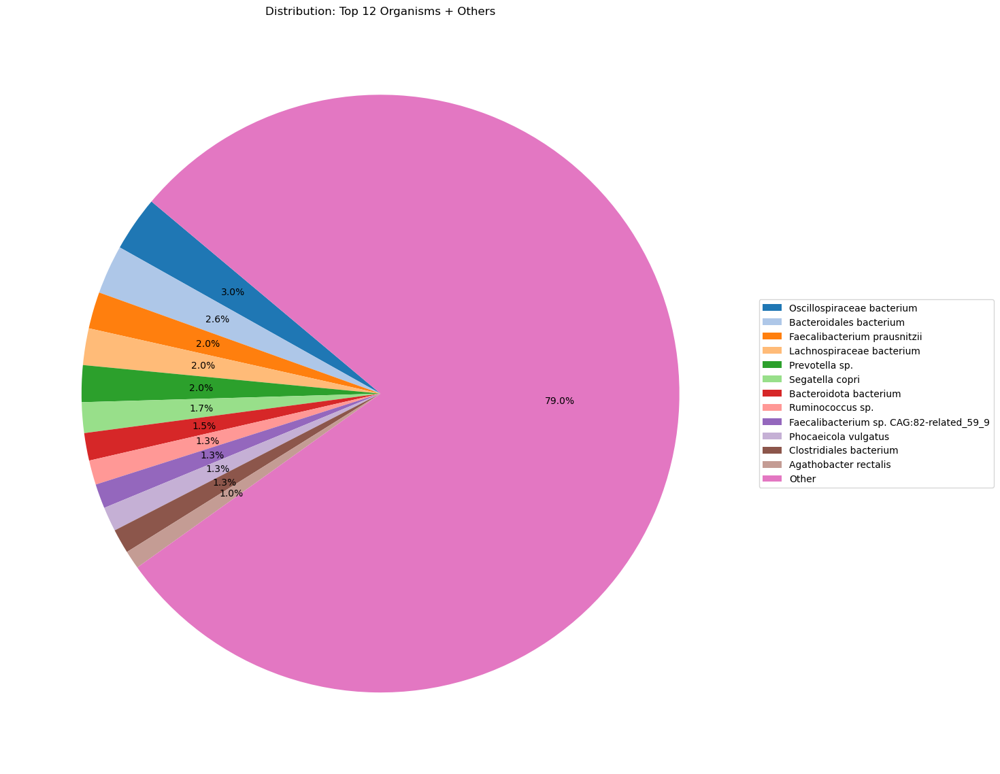

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("results/organisms_and_ec.tsv", sep="\t")

# Count organisms & build final series
org_counts = df["taxon_name"].value_counts()
top12     = org_counts.iloc[:12]
other_sum = org_counts.iloc[12:].sum()
final_counts = pd.concat([top12, pd.Series({"Other": other_sum})])

# Generate a unique list of colours:
# Option A: Use a built-in colormap (e.g. tab20 has 20 distinct colours)
cmap  = plt.get_cmap("tab20")          # you can swap in "tab20", "tab10", "tab20b", "tab20c", "viridis", etc.
colors = cmap.colors[:len(final_counts)]  # take as many as you need

# Option B (with seaborn):
# import seaborn as sns
# colors = sns.color_palette("hls", n_colors=len(final_counts))

# Plot
fig, ax = plt.subplots(figsize=(7, 6)) 
final_counts.plot(
    kind      = 'pie',
    autopct   = '%1.1f%%',
    startangle= 140,
    labels    = [''] * len(final_counts),
    colors    = colors,
    ax        = ax
)

# Style
plt.title("Distribution: Top 12 Organisms + Others")
plt.ylabel("")  # hide y-axis label
plt.legend(
    labels          = final_counts.index,
    loc             = 'center left',
    bbox_to_anchor  = (1, 0.5)
)
plt.tight_layout()
plt.show()


Our microbial community mirrors what’s seen in colorectal cancer studies: a blend of helpful and potentially harmful bacteria, highlighting the complex balance of the gut environment in this disease.(Kadhim et al.2025)

## 2.3.1 Taxonomical annotation per sample
Next, we will examine the taxonomic composition on a per-sample basis to uncover how microbial communities vary between our colorectal cancer samples. This sample-level comparison will highlight both consistent and divergent microbial signatures, guiding our interpretation of how specific taxa contribute to the different kind of cancers present in our samples.

The code below takes our combined PeptideShaker report (produced by the metaproteomics pipeline in Galaxy) and break it into one file per sample. The script reads the report, picks out all proteins for each spectrum file,drop the duplicates and then writes each sample’s unique list of proteins into its own text file under results/per_sample_proteins. 

In [1]:
import pandas as pd
from pathlib import Path

# 1) Load your peptide‐to‐protein table
fn = "data/Galaxy186-[Peptide Shaker on data 183_ PSM Report].tabular"  
df = pd.read_csv(fn, sep="\t")


protein_col = "Sequence"
sample_col  = "Spectrum File"

# 3) Group by sample and dump out unique proteins
out_dir = Path("results") / "per_sample_proteins"
out_dir.mkdir(exist_ok=True)

for sample, grp in df.groupby(sample_col):
    # split comma‐separated protein lists, collect uniques
    proteins = set()
    for cell in grp[protein_col].dropna():
        # e.g. "protein1348, protein5071"
        for p in str(cell).split(","):
            proteins.add(p.strip())
    
    # write to file named after the sample
    out_fn = out_dir / f"{Path(sample).stem}_proteins.txt"
    with open(out_fn, "w") as fh:
        for p in sorted(proteins):
            fh.write(p + "\n")
    print(f"Wrote {len(proteins)} proteins → {out_fn}")

Wrote 26 proteins → results/per_sample_proteins/21P04220001_proteins.txt
Wrote 356 proteins → results/per_sample_proteins/21P04220002_proteins.txt
Wrote 224 proteins → results/per_sample_proteins/21P04220004_proteins.txt
Wrote 440 proteins → results/per_sample_proteins/21P04220005_proteins.txt


In this step, we take the Unipept output file (data/Galaxy190-[Unipept pept2prot on data 189 tsv].tabular), and keep only the peptide sequence and its matched taxon name. Then, for each sample file in per_sample_proteins, we read the list of peptides and look up each one in that mapping. The script merges them so every peptide carries its organism label, and writes the result to peptide_taxonomy_by_sample. This gives us a simple two-column table of peptide and taxon for each sample, which we’ll use to count and compare which microbes appear in each dataset.


In [2]:
import pandas as pd
from pathlib import Path

# 1) Load peptide→taxonomy mapping (keep original headers)
taxmap = pd.read_csv(
    "data/Galaxy190-[Unipept pept2prot on data 189 tsv].tabular",
    sep="\t"
)
# Ensure we only keep the two columns we need
taxmap = taxmap[["#peptide", "taxon_name"]]

# 2) Prepare output directory
out_dir = Path("results") / "peptide_taxonomy_by_sample"
out_dir.mkdir(exist_ok=True)

# 3) Iterate over every sample file in per_sample_proteins/
for txt in Path("per_sample_proteins").glob("*.txt"):
    sample = txt.stem  # e.g. “21P04220001”

    # 4) Read the peptide list (no header, one peptide sequence per line)
    df_psm = pd.read_csv(txt, sep="\t", header=None, names=["#peptide"])

    # 5) Merge with taxonomy map on the exact "#peptide" column
    df_merged = pd.merge(
        df_psm,
        taxmap,
        on="#peptide",
        how="left"
    )

    # 6) Write out PEPTIDE <TAB> TAXON_NAME (no header, no index)
    out_fn = out_dir / f"{sample}_peptide_taxonomy.txt"
    df_merged.to_csv(
        out_fn,
        sep="\t",
        index=False,
        header=False
    )
    print(f"Wrote {len(df_merged)} entries → {out_fn}")

Wrote 671 entries → results/peptide_taxonomy_by_sample/21P04220002_proteins_peptide_taxonomy.txt
Wrote 424 entries → results/peptide_taxonomy_by_sample/21P04220004_proteins_peptide_taxonomy.txt
Wrote 838 entries → results/peptide_taxonomy_by_sample/21P04220005_proteins_peptide_taxonomy.txt
Wrote 47 entries → results/peptide_taxonomy_by_sample/21P04220001_proteins_peptide_taxonomy.txt


As we can see there is imbalance between the proteins identified in each sample. This will be further discussed in the individual report

In the code below, we import our peptide-to-taxon mapping files and count how many peptides map to each taxon. Next, for each sample we select the twelve most abundant taxa by peptide count and plot them as horizontal bar charts.

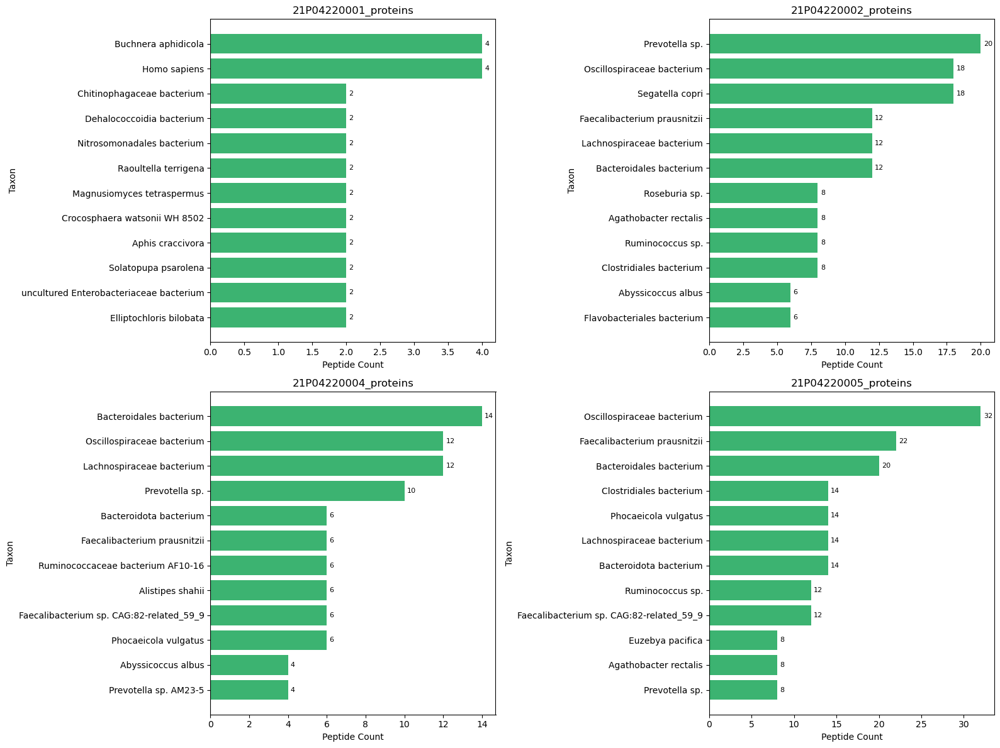

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# render inline in Jupyter (only works in Jupyter environments)
%matplotlib inline

# 1) Point to folder of peptide↔taxon files
in_dir = Path("results") / "peptide_taxonomy_by_sample"
fns = sorted(in_dir.glob("*_peptide_taxonomy.txt"))

# 2) Prepare a 2×2 grid for the four samples
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

# 3) Loop over the first four sample files
for ax, fn in zip(axes, fns[:4]):
    # derive sample name from filename
    sample = fn.stem.replace("_peptide_taxonomy", "")
    
    # load peptide↔taxon file (no header, two columns)
    df = pd.read_csv(fn, sep="\t", header=None, names=["peptide", "taxon_name"])
    
    # count how many peptides map to each taxon
    counts = df["taxon_name"].value_counts()
    
    # just take top 12 (no "Other")
    top12 = counts.iloc[:12]
    
    # horizontal bar plot
    bars = ax.barh(top12.index[::-1], top12.values[::-1], color='mediumseagreen')
    
    # add value labels beside bars
    for bar in bars:
        width = bar.get_width()
        ax.text(width + max(top12.values)*0.01, bar.get_y() + bar.get_height()/2,
                f"{int(width)}", va='center', fontsize=8)
    
    # formatting
    ax.set_title(sample)
    ax.set_xlabel("Peptide Count")
    ax.set_ylabel("Taxon")

# layout
plt.tight_layout()
plt.show()


The plots above, summarize the taxonomix profiling of each sample. Sample one, has the least identified proteins and contains entries as human, not present in the other three samples. In general sample one seems the most different comparing to samples two,four and five that have a lot of organisms in common

We’ll now look for the microbes that appear in more than sample. By comparing each sample’s list of organisms and finding the overlap, we’ll define the “core” microbiome. This core set shows the bacteria most consistently linked to colorectal cancer

In [4]:
import pandas as pd
from pathlib import Path
from collections import Counter

# Point to  folder of peptide↔taxon files
in_dir = Path("results") / "peptide_taxonomy_by_sample"
fns = sorted(in_dir.glob("*_peptide_taxonomy.txt"))

# Store top 12 taxa per sample
top_taxa_lists = []
sample_names = []

for fn in fns[:4]:
    sample = fn.stem.replace("_peptide_taxonomy", "")
    sample_names.append(sample)
    df = pd.read_csv(fn, sep="\t", header=None, names=["peptide", "taxon_name"])
    counts = df["taxon_name"].value_counts()
    top12 = counts.iloc[:12].index.tolist()
    top_taxa_lists.append(top12)

# Flatten list of all top-12 taxa from all samples
all_top_taxa = [taxon for sublist in top_taxa_lists for taxon in sublist]

# Count how many times each taxon appears
taxon_counts = Counter(all_top_taxa)

# Filter to show taxa that appear in 2 or more samples
shared_taxa = {taxon: count for taxon, count in taxon_counts.items() if count >= 2}

# Output
print("Taxa appearing in 2 or more of the top-12 lists:")
for taxon, count in sorted(shared_taxa.items(), key=lambda x: -x[1]):
    print(f"- {taxon}: {count} samples")


Taxa appearing in 2 or more of the top-12 lists:
- Prevotella sp.: 3 samples
- Oscillospiraceae bacterium: 3 samples
- Faecalibacterium prausnitzii: 3 samples
- Lachnospiraceae bacterium: 3 samples
- Bacteroidales bacterium: 3 samples
- Agathobacter rectalis: 2 samples
- Ruminococcus sp.: 2 samples
- Clostridiales bacterium: 2 samples
- Abyssicoccus albus: 2 samples
- Bacteroidota bacterium: 2 samples
- Faecalibacterium sp. CAG:82-related_59_9: 2 samples
- Phocaeicola vulgatus: 2 samples


In colorectal cancer samples, several common gut microbes were identified, including beneficial SCFA producers like Faecalibacterium prausnitzii, Ruminococcus, and Agathobacter rectalis. These support gut health but are often reduced in CRC. Their coexistence with potential pro-inflammatory taxa like Prevotella and Phocaeicola vulgatus points to an imbalanced microbiota with signs of both disruption and resilience. (He et al. 2021) (Tett et al.2021)

**Note!** I tried to do a Venn diagram here but it unfortunately did not work

## 2.3.2 PCA with taxonomic annotation of each sample

Next, we will apply principal component analysis (PCA) to each sample’s taxonomic abundance table to explore how our colorectal cancer specimens separate based on their microbial communities. We will also examine the PCA loadings, which tell us exactly which organisms drive the greatest differences along each component, so we can pinpoint the key taxa responsible for the observed sample separation.

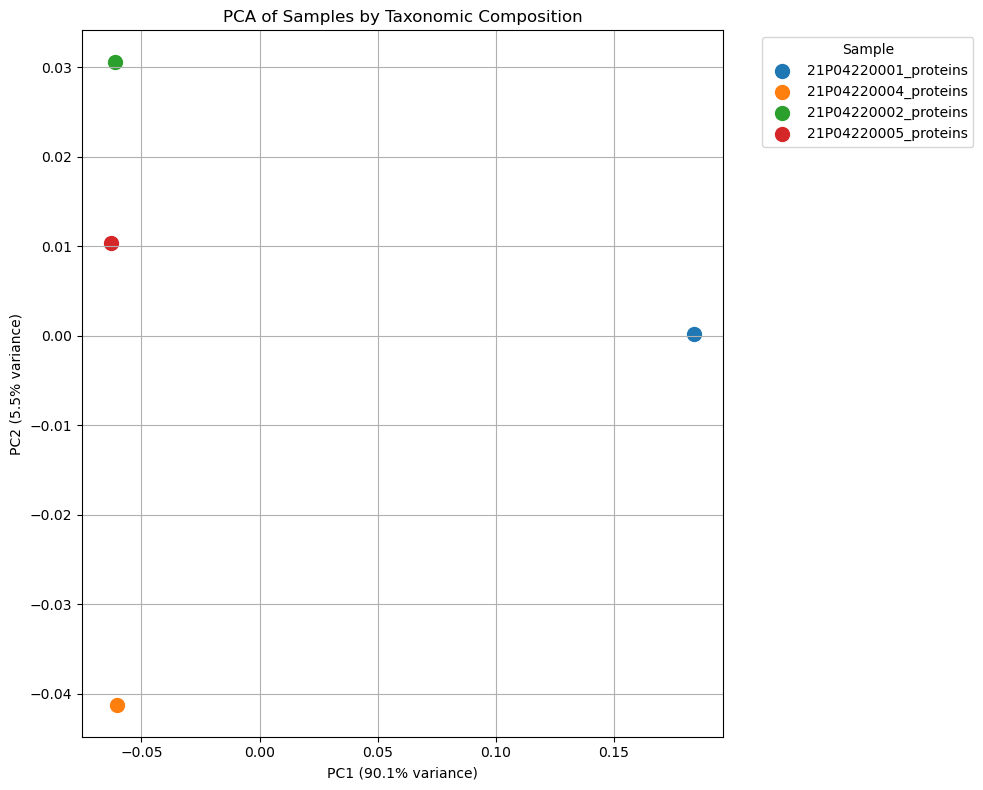


Top 10 positive contributors to PC1_loading:
Buchnera aphidicola              0.388227
Homo sapiens                     0.381563
Raoultella terrigena             0.194114
Solatopupa psarolena             0.194114
Crocosphaera watsonii WH 8502    0.194114
Elliptochloris bilobata          0.194114
Winogradskyella ouciana          0.194114
Mandrillus leucophaeus           0.194114
Apophysomyces ossiformis         0.194114
Edwardsiella tarda               0.194114
Name: PC1_loading, dtype: float64

Top 10 negative contributors to PC1_loading:
Oscillospiraceae bacterium                 -0.134564
Bacteroidales bacterium                    -0.107369
Prevotella sp.                             -0.090211
Lachnospiraceae bacterium                  -0.090211
Faecalibacterium prausnitzii               -0.084211
Bacteroidota bacterium                     -0.057349
Faecalibacterium sp. CAG:82-related_59_9   -0.053851
Ruminococcus sp.                           -0.051477
Phocaeicola vulgatus          

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# 1) Load and build the taxon count matrix
in_dir = Path("results") / "peptide_taxonomy_by_sample"
fns = sorted(in_dir.glob("*_peptide_taxonomy.txt"))

sample_taxon_counts = {}
for fn in fns:
    sample = fn.stem.replace("_peptide_taxonomy", "")
    df = pd.read_csv(fn, sep="\t", header=None, names=["peptide", "taxon_name"])
    counts = df["taxon_name"].value_counts()
    sample_taxon_counts[sample] = counts

# Convert to a DataFrame: rows = samples, columns = taxa
df_matrix = pd.DataFrame.from_dict(sample_taxon_counts, orient="index").fillna(0)

# Normalize to relative abundances
df_rel = df_matrix.div(df_matrix.sum(axis=1), axis=0)

# 2) PCA
pca = PCA(n_components=2)
coords = pca.fit_transform(df_rel)
df_pca = pd.DataFrame(coords, columns=["PC1", "PC2"], index=df_rel.index)
df_pca["sample"] = df_pca.index

# 3) Plot PCA (samples)
palette = sns.color_palette("tab10", len(df_pca))
sample_colors = dict(zip(df_pca["sample"], palette))

plt.figure(figsize=(5, 4))
for sample in df_pca["sample"]:
    x, y = df_pca.loc[sample, ["PC1", "PC2"]]
    plt.scatter(x, y, s=100, color=sample_colors[sample], label=sample)

plt.legend(title="Sample", bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
plt.title("PCA of Samples by Taxonomic Composition")
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)")
plt.grid(True)
plt.tight_layout()
plt.show()

# 4) PCA Loadings — which taxa drive PC1 and PC2
loadings = pd.DataFrame(pca.components_.T, 
                        columns=["PC1_loading", "PC2_loading"], 
                        index=df_rel.columns)

# 5) Show top contributors to PC1 and PC2 (positive & negative)
top_n = 10
for pc in ["PC1_loading", "PC2_loading"]:
    print(f"\nTop {top_n} positive contributors to {pc}:")
    print(loadings[pc].sort_values(ascending=False).head(top_n))

    print(f"\nTop {top_n} negative contributors to {pc}:")
    print(loadings[pc].sort_values(ascending=True).head(top_n))



The PCA plot shows one sample pulled to the right on PC1 (sample 1) , while the other three cluster on the left. The rightmost sample is driven by strong loadings of Homo sapiens and Buchnera aphidicola signals that might indicate contamination rather than true microbial content. PC2 distributes the samples  along a continuum of taxonomic variation two samples trending toward positive loadings and one toward negative rather than forming strictly separate clusters.

This section concludes the taxonomic annotation, in which we explored the dominant taxa across all four samples as well as within each individual sample. We also assessed sample similarity by performing a PCA and plotting the loadings to identify which organisms drive the observed differences.

# 2.4 Functional annotation

Next, we shift our attention from who’s present to what they’re capable of by integrating functional annotations.

The code below loads the GO “Biological Processes” table from Galaxy196-[GO Terms_ Biological Processes].tabular into a pandas DataFrame, then grabs the first 20 rows (presumably the top terms by peptide count). It builds a horizontal bar chart of #description versus the bering_peptides count.


/tmp/ipykernel_1261/2551468843.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top20['short_description'] = top20['#description'].str.slice(0, 30)


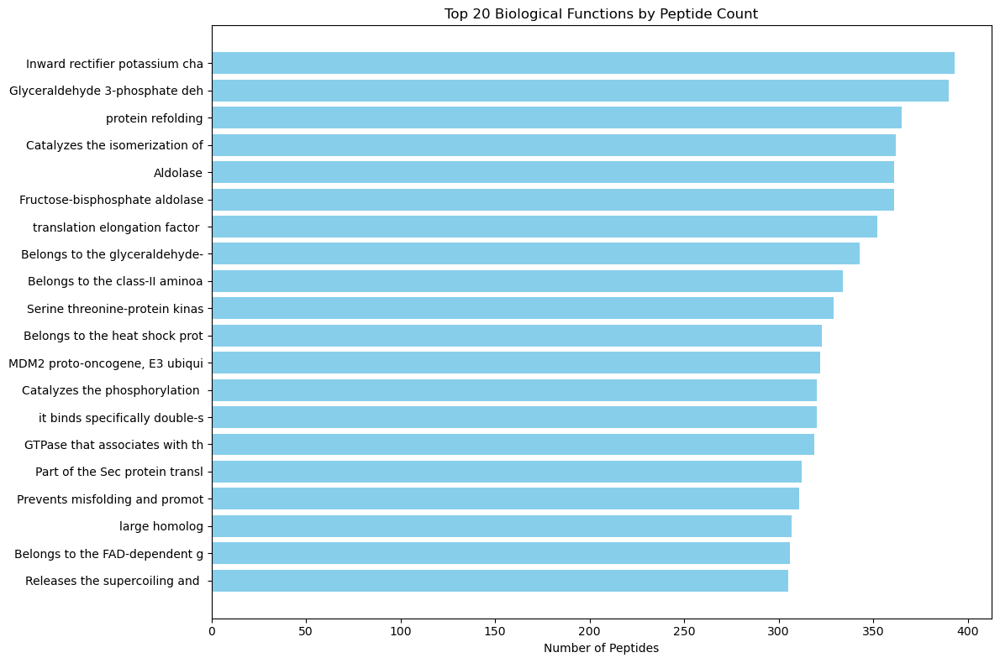

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("data/Galaxy196-[GO Terms_ Biological Processes].tabular", sep="\t")

# Select the top 20 rows
top20 = df.head(20)

# Truncate long names to 30 characters
top20['short_description'] = top20['#description'].str.slice(0, 30)

# Plot
plt.figure(figsize=(9, 6))
plt.barh(top20['short_description'], top20['bering_peptides'], color='skyblue')
plt.xlabel("Number of Peptides")
plt.title("Top 20 Biological Functions by Peptide Count")
plt.gca().invert_yaxis()  # Highest bar on top
plt.tight_layout()
plt.show()


Inspection of the top 20 GO Biological Process categories by peptide count reveals some core housekeeping functions such us central carbon metabolism (e.g., glyceraldehyde-3-phosphate dehydrogenase, aldolase), protein synthesis and folding (translation elongation factors, aminoacyl-tRNA synthetases), DNA replication initiation (DnaA binding), and general ATP-driven molecular machines (kinases).

Following that we will move in doing GO enrichment which lets us spot which biological processes show up more often in our colorectal cancer samples than you’d expect by chance. This moves us beyond just counting the most abundant proteins (which often belong to everyday “housekeeping” jobs) and zeroes in on pathways truly linked to the disease. Because it uses statistical tests, we can trust that the results aren’t driven by random noise.

Enrichment analysis requires four key inputs: a study set of UniProt accession numbers (e.g., top 15 proteins), a background set of all identified proteins, a GO annotation mapping file, and the Gene Ontology hierarchy (go-basic.obo)

**Note!** I tried to do it using several tools like Gorilla but due to the model organism limitation all failed. I generated all the required files but deleted them from this notebook.

In this part of the code we start collecting data for the enrichment analysis, we first load Galaxy196-[GO Terms_ Biological Processes].tabular to extract and clean the top 15 GO process descriptions (they dont include the GO IDs just the description), then we use go_terms_converted.tabular to map those descriptions to their GO IDs. Next, we read Galaxy190-[Unipept pept2prot on data 189 tsv].tabular, explode its GO references so each GO ID maps to individual UniProt IDs, and filter those mappings to retain only our selected top-15 GO IDs. Finally, we group by GO ID to assemble each process’s UniProt contributors, collect all unique UniProt IDs, and write them to top15_uniprot_ids.txt. This procedure isolates the specific proteins underlying the most prevalent biological functions, setting the stage for focused downstream validation and enrichment analyses.

## 2.4.1 GO enrichment analysis 

In [17]:
import pandas as pd

# -------------------------------------------
# Step 1: Load File 1 and extract the top 50 GO descriptions
df_summary = pd.read_csv("data/Galaxy196-[GO Terms_ Biological Processes].tabular", sep="\t")
#GO term descriptions is labeled "#description"
top15_summary = df_summary.head(15).copy()

# Clean the descriptions so we can match them later:
top15_summary["desc_clean"] = top15_summary["#description"].str.lower().str.strip()

# # For debug, you might want to see the top 15 descriptions:
# print("Top 15 GO descriptions from File 1:")
# print(top15_summary[["desc_clean"]])

# -------------------------------------------
# Step 2: Load File 2 which maps GO IDs to descriptions.
df_go_map = pd.read_csv("results/go_terms_converted.tabular", sep="\t")
# Columns are: "aspect", "go_id", "description"
# Create a clean version of the description to match File 1
df_go_map["desc_clean"] = df_go_map["description"].str.lower().str.strip()

# Filter File 2 to only those rows where the cleaned description is in the top15 list:
top15_go_map = df_go_map[df_go_map["desc_clean"].isin(top15_summary["desc_clean"])].copy()

# # For verification, print the mapping (GO ID + description)
# print("\nMapping (File 2) for top 15 GO descriptions:")
# print(top15_go_map[["go_id", "desc_clean"]])

# Capture the list of GO IDs we are interested in:
top15_go_ids = top15_go_map["go_id"].unique().tolist()
# print("\nTop 15 GO IDs:", top15_go_ids)

# -------------------------------------------
# Step 3: Load File 3, which has protein-to-GO mappings.
# In this file, the 2nd column is the UniProt ID and the 5th is go_references.
df_prot = pd.read_csv("data/Galaxy190-[Unipept pept2prot on data 189 tsv].tabular", sep="\t")

# Now, split the 'go_references' column so that each cell becomes a list of GO IDs.
df_prot["go_list"] = df_prot["go_references"].str.split()

# Explode the list so each GO ID gets its own row.
df_prot_exploded = df_prot.explode("go_list").reset_index(drop=True)
# Optionally, clean up the GO IDs by stripping extra spaces:
df_prot_exploded["go_list"] = df_prot_exploded["go_list"].str.strip()

# Filter the protein rows to keep only those that have one of the top 15 GO IDs:
df_prot_filtered = df_prot_exploded[df_prot_exploded["go_list"].isin(top15_go_ids)].copy()

# -------------------------------------------
# Step 4: Group by the GO ID from the protein mapping file to get the contributing UniProt IDs.
go_to_proteins = (
    df_prot_filtered.groupby("go_list")["uniprot_id"]
    .unique()
    .reset_index()
    .rename(columns={"go_list": "GO_ID", "uniprot_id": "Associated_UniProt_IDs"})
)

# # Print the mapping of Top 15 GO IDs to Protein UniProt IDs:
# print("\nMapping of Top 15 GO IDs to Protein UniProt IDs:")
# print(go_to_proteins)

# Extract the unique UniProt IDs
all_uniprot_ids = go_to_proteins["Associated_UniProt_IDs"].explode().unique()

# Write these unique UniProt IDs to a text file (one per line)
output_filename = "top15_uniprot_ids.txt"
with open(output_filename, "w") as f:
    for uid in all_uniprot_ids:
        f.write(str(uid) + "\n")

print(f"\nFile '{output_filename}' has been written with {len(all_uniprot_ids)} unique UniProt IDs.")

Top 15 GO descriptions from File 1:
                                           desc_clean
0                  inward rectifier potassium channel
1   glyceraldehyde 3-phosphate dehydrogenase, nad ...
2                                   protein refolding
3   catalyzes the isomerization of citrate to isoc...
4                                            aldolase
5             fructose-bisphosphate aldolase class-ii
6              translation elongation factor activity
7   belongs to the glyceraldehyde-3-phosphate dehy...
8   belongs to the class-ii aminoacyl-trna synthet...
9                     serine threonine-protein kinase
10        belongs to the heat shock protein 70 family
11   mdm2 proto-oncogene, e3 ubiquitin protein ligase
12  catalyzes the phosphorylation of pyruvate to p...
13  it binds specifically double-stranded dna at a...
14  gtpase that associates with the 50s ribosomal ...

Mapping (File 2) for top 15 GO descriptions:
            go_id                                     

With the code below, we take the (Galaxy190-[Unipept pept2prot on data 189 tsv].tabular) UniPept peptide-to-protein mapping file into a pandas DataFrame, pull out every non-missing UniProt accession in the uniprot_id column, deduplicate them, and write the resulting list one ID per line to all_background_proteins.txt. 

In [12]:
import pandas as pd

# Load the file with headers.
df = pd.read_csv("data/Galaxy190-[Unipept pept2prot on data 189 tsv].tabular", sep="\t")

# Extract unique UniProt IDs from the 'uniprot_id' column.
protein_ids = df["uniprot_id"].dropna().unique()

# Write these unique IDs to a text file (one ID per line).
with open("results/all_background_proteins.txt", "w") as f:
    for pid in protein_ids:
        f.write(str(pid) + "\n")

print(f"Extracted {len(protein_ids)} unique UniProt IDs and saved them in 'all_background_proteins.txt'.")

Extracted 545 unique UniProt IDs and saved them in 'all_background_proteins.txt'.


The analysis pipeline begins by loading the complete list of detected UniProt accessions from all_background_proteins.txt and the subset of interest from top15_uniprot_ids.txt into Python sets. Next, the peptide‐to‐protein mapping file Galaxy190-[Unipept pept2prot on data 189 tsv].tabular is parsed to build a dictionary (geneid2gos) linking each UniProt ID to its associated GO terms. This mapping is then filtered to include only accessions present in the background set, and the resulting keys are intersected with the target set to produce annotated protein lists for both populations. By ensuring that every protein in the study and background groups carries valid GO annotations, this step establishes the inputs required for subsequent GO enrichment analysis.


In [14]:
import pandas as pd
from collections import defaultdict

# -----------------------------------
# Step 1: Read the Background and Target UniProt IDs from your text files.
with open("results/all_background_proteins.txt", "r") as f:
    background_proteins = {line.strip() for line in f if line.strip()}

with open("results/top15_uniprot_ids.txt", "r") as f:
    target_proteins = {line.strip() for line in f if line.strip()}


# -----------------------------------
# Step 2: Build the gene-to-GO mapping dictionary from your original protein file.
df = pd.read_csv("data/Galaxy190-[Unipept pept2prot on data 189 tsv].tabular", sep="\t")

# Create the mapping: UniProt ID -> set of GO IDs.
geneid2gos = defaultdict(set)
for idx, row in df.iterrows():
    uid = row["uniprot_id"]
    # Only process if there are GO references
    if pd.notnull(row["go_references"]):
        # Split the space‐separated GO IDs into a set.
        go_list = row["go_references"].split()
        for go in go_list:
            geneid2gos[uid].add(go)

# -----------------------------------
# (Optional) Filter the geneid2gos dictionary to only include proteins in your background.
filtered_geneid2gos = {gene: gos for gene, gos in geneid2gos.items() if gene in background_proteins}
background_filtered = set(filtered_geneid2gos.keys())
# Target: Only keep target proteins that are in the filtered mapping.
target_filtered = target_proteins.intersection(background_filtered)
print("====================================")
print("Summary of Protein Counts:")
print(f"Total background proteins (from file): {len(background_proteins)}")
print(f"Proteins with GO annotations (background): {len(background_filtered)}")
print(f"Total target proteins (from top 15 file): {len(target_proteins)}")
print(f"Target proteins with GO annotations: {len(target_filtered)}")
print("====================================")

Summary of Protein Counts:
Total background proteins (from file): 545
Proteins with GO annotations (background): 540
Total target proteins (from top 15 file): 486
Target proteins with GO annotations: 486


Unfortunately, Because your “study” set (486 proteins) nearly exhausts the “background” (540 annotated proteins), a GO enrichment test will have very little statistical power to detect over-representation most terms occur in both sets simply by virtue of their size. This happens because one peptide matches to multiple GO terms as seen below.

**Note!** Values of five and ten top GO enriched processes were used but it did not make a big difference on the number of proteins on the study set.

In [22]:
!head "data/Galaxy190-[Unipept pept2prot on data 189 tsv].tabular"

#peptide	uniprot_id	taxon_id	taxon_name	ec_references	go_references
AAAGNIIPSSTGAAK	A0A7J5W076	1898104	Bacteroidota bacterium	EC:1.2.1.-	GO:0051287 GO:0050661 GO:0016620 GO:0006006
AAANYLDLPLYR	H3NBS1	883103	Dolosigranulum pigrum ATCC 51524	EC:4.2.1.11	GO:0009986 GO:0005576 GO:0000015 GO:0000287 GO:0004634 GO:0006096
AAASESFGYNEDPIVSSDVIGMR	A0A3D5TL32	2485925	Oscillospiraceae bacterium	EC:1.2.1.-	GO:0051287 GO:0050661 GO:0016620 GO:0006006
AAAVNIVPNSTGAAK	A0AAU0NRS2	3064705	Clostridium sp. JS66	EC:1.2.1.-	GO:0051287 GO:0050661 GO:0016620 GO:0006006
AADDAAGLSISEK	A0A7C1JVU3	500	Thermomicrobium roseum		GO:0009288 GO:0005576 GO:0005198
AAGIALTDTFVK	A0A3N4VY89	1443036	Vespertiliibacter pulmonis	EC:1.2.1.-	GO:0004365 GO:0051287 GO:0050661 GO:0006006
AANAGGVAVSGLEMSQNSER	A0A3R6KS41	2292054	Prevotella sp. AM23-5		GO:0005829 GO:0004354 GO:0000166 GO:0006537
AASGNIIPSSTGAAK	A0A7S0FKT9	265543	Minutocellus polymorphus		GO:0005829 GO:0004365 GO:0051287 GO:0006096
AATDGPMPQTR	A0A5Y6Z5R5	90371	Salmo

We will continue on with the analysis but keeping in mind we will likely not obtain very biological insightful results.

We will use GOATOOLS version 1.4.12 for GO enrichment analysis since it does not require a model organism. GOATOOLS enables parsing of the Gene Ontology hierarchy (via OBO files), ingestion of annotation mappings, and execution of Fisher’s exact tests with multiple-testing correction to identify overrepresented biological processes. (Klopfenstein et al.2018)


In [12]:
pip install goatools -qq

Note: you may need to restart the kernel to use updated packages.


In this stage of the analysis, we first ensure that the Gene Ontology hierarchy file (data/go-basic.obo) is present locally and automatically download it from the OBO Library if necessary. We then parse the ontology using GOATOOLS’ GODag parser and instantiate a GOEnrichmentStudy object with our filtered background protein set and the corresponding UniProt‐to‐GO mapping. The enrichment is performed on the target protein list with Benjamini–Hochberg correction for multiple testing, and we extract only those biological process terms with FDR‐adjusted p-values below 0.05. Finally, the significant GO IDs—along with their uncorrected and corrected p-values and study versus population counts—are written to results/enriched_biological_processes.csv.

In [24]:
import os
import urllib.request
import csv

obo_file = "data/go-basic.obo"
if not os.path.exists(obo_file):
    print(f"{obo_file} not found. Downloading...")
    url = "http://purl.obolibrary.org/obo/go/go-basic.obo"
    urllib.request.urlretrieve(url, obo_file)
    print(f"Downloaded {obo_file}")

from goatools.obo_parser import GODag
godag = GODag(obo_file)

# Now set up the GO enrichment analysis using GOATOOLS:
from goatools.go_enrichment import GOEnrichmentStudy

goea_obj = GOEnrichmentStudy(
    background_filtered,  # Background set: proteins with GO annotations
    filtered_geneid2gos,    # Gene-to-GO mapping dictionary for these proteins
    godag,                # GO DAG (ontology)
    methods=["fdr_bh"]    # Multiple-testing correction method
)

# Run the enrichment analysis on the filtered target set:
goea_results = goea_obj.run_study(target_filtered)

output_csv = "results/enriched_biological_processes.csv"
with open(output_csv, mode="w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    # Write header
    writer.writerow(["GO_ID", "p_uncorrected", "p_fdr_bh", "Study_Count", "Population_Count"])
    # Write filtered enrichment results
    for r in goea_results:
        if r.p_fdr_bh < 0.05 and r.GO in godag and godag[r.GO].namespace == "biological_process":
            writer.writerow([
                r.GO,
                f"{r.p_uncorrected:.3g}",
                f"{r.p_fdr_bh:.3g}",
                r.study_count,
                r.pop_count
            ])

print(f"\nResults written to '{output_csv}'")



data/go-basic.obo: fmt(1.2) rel(2025-06-01) 43,448 Terms

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100%    540 of    540 population items found in association

Runing  Ontology Analysis: current study set of 486 IDs.
100%    486 of    486 study items found in association
100%    486 of    486 study items found in population(540)
Calculating 1,043 uncorrected p-values using fisher_scipy_stats


8 GO IDs NOT FOUND IN ASSOCIATION: GO:0001055 GO:0001058 GO:0001066 GO:0001054 GO:0001056 GO:0045261 GO:0001057 GO:0061077


   1,043 terms are associated with    540 of    540 population items
     996 terms are associated with    486 of    486 study items
  METHOD fdr_bh:
      67 GO terms found significant (< 0.05=alpha) ( 26 enriched +  41 purified): statsmodels fdr_bh
     481 study items associated with significant GO IDs (enriched)
     102 study items associated with significant GO IDs (purified)

Results written to 'results/enriched_biological_processes.csv'


In this final step, we load the significant enrichment results from resuts/enriched_biological_processes.csv and the GO ID–description mapping from results/go_terms_converted.tabular into pandas DataFrames, then perform a left-merge on the GO_ID column to annotate each enriched term with its description. After eliminating duplicate entries and dropping the redundant go_id column, we iterate through the merged table to output one line per unique GO term, pairing each GO identifier with its corresponding description. During annotation, we found that many proteins mapped to multiple GO terms, generating an big number of entries. To keep the results concise and manageable, we therefore retained only the first matching description for each enriched GO identifier. This is not advisable and we did this due to the limited time and resourses.

To make the results easier to understand and more meaningful, we could group similar GO terms using tools like REVIGO (Supek et al. 2011), which helps reduce repetition by combining overlapping terms into broader categories.

In [13]:
import pandas as pd

# Load enrichment results and GO descriptions
enriched = pd.read_csv("results/enriched_biological_processes.csv")
go_desc = pd.read_csv("results/go_terms_converted.tabular", sep="\t")

# Merge only on GO IDs that were enriched
merged = pd.merge(
    enriched[["GO_ID"]], go_desc,
    how="left", left_on="GO_ID", right_on="go_id"
)

# Drop duplicates so each GO_ID appears once
merged = merged.drop_duplicates(subset="GO_ID")

# Drop unnecessary column and rename for clarity
merged = merged.drop(columns=["go_id"])

# Print one line per unique GO ID
print("\nDescriptions for Enriched GO Biological Processes:\n")
for _, row in merged.iterrows():
    go_id = row["GO_ID"]
    desc = row["description"] if pd.notnull(row["description"]) else "(no description found)"
    # print(f"{go_id} — {desc}")


Descriptions for Enriched GO Biological Processes:



In this step, we make the list of enriched GO terms easier to read by combining repeated entries that have the same biological process description. First, we remove any rows that don’t have a description. Then, we group the data by description and collect all the GO IDs linked to each one into a single line. This way, each biological process appears only once, along with the list of GO terms related to it.

In [14]:
# 1) Drop any rows with missing descriptions (optional)
merged = merged.dropna(subset=["description"])

# 2) Group by description and collect all GO_IDs into a comma-separated string
grp = (
    merged
      .groupby("description")["GO_ID"]
      .agg(lambda ids: ", ".join(ids))
      .reset_index()
)

# 3) Print one block per unique description, listing all GO terms behind it
# print("\nCollapsed Enriched GO Biological Processes:\n")
# for _, row in grp.iterrows():
#     print(f"{row['description']}\n  ↳ GO IDs: {row['GO_ID']}\n")


Collapsed Enriched GO Biological Processes:



This collection of enriched biological processes highlights a diverse range of metabolic and enzymatic functions associated with the proteins in our four samples.

## 2.4.2 Explore enzymatic activity using KEGG

Next, we will explore the enzymatic activities (using EC numbers) represented in our enriched protein set.
By mapping each EC identifier to KEGG pathways, we can connect individual enzyme functions to metabolites.

In this step, we load the file results/organisms_and_ec.tsv into a pandas DataFrame and extract the second column, which contains the EC (enzyme commission) numbers, dropping any blank entries since not all organisms map to an EC number. We then convert these non-empty EC values into a Python list for downstream analysis.


In [15]:
import pandas as pd

# Load  file 
df = pd.read_csv("results/organisms_and_ec.tsv", sep="\t")

# Extract the second column and drop NA
ec_series = df.iloc[:, 1].dropna().astype(str)

# (Optional) convert to a list
ec_list = ec_series.tolist()

# Display result
# print("Extracted EC numbers (non-empty):")
# print(ec_list[:5])
# print(f"There were {len(ec_list)} E.C numbers extracted")

In this block, we translate our list of enzyme commission (EC) numbers into the small molecules they act upon using the KEGG database via the bioservices API. After cleaning out partial EC entries (those containing “–”), we use k.link("reaction", ec) to retrieve all reaction IDs associated with each complete EC number. For each reaction, we download its entry and parse the “EQUATION” line to extract every compound identifier (e.g., C00022). Finally, we fetch each compound’s record to grab its primary name. Because many enzymes catalyze multiple reactions, a single EC number can map to multiple distinct compounds, so our table may list several names per EC. Collecting these EC→reaction→compound mappings into a pandas DataFrame and exporting them to results/ec_to_compounds_via_reactions.tsv allows us to directly link our enzymes to their substrates and products.


In [34]:
from bioservices import KEGG
import re, pandas as pd
k = KEGG()
unique_ecs = sorted(set(ec_list))
clean_ecs = [ec.replace("EC:", "") for ec in unique_ecs]

records=[]
for ec in clean_ecs:
    # skip “incomplete” ECs
    if "-" in ec:
        continue

    # 1) EC → Reaction links
    txt = k.link("reaction", f"ec:{ec}")
    if not txt or not isinstance(txt, str):
        print(f"No reactions for EC:{ec}")
        continue

    # collect all reaction IDs for this EC
    rids = [line.split("\t")[1].replace("rn:", "")
            for line in txt.strip().splitlines() if "\t" in line]
    if not rids:
        print(f"No reaction IDs for EC:{ec}")
        continue

    # 2) for each reaction, fetch and parse its EQUATION
    compounds = set()
    for rid in rids:
        entry = k.get(f"rn:{rid}")
        if not isinstance(entry, str):
            continue
        m = re.search(r"^EQUATION\s+(.+)", entry, flags=re.MULTILINE)
        if not m:
            continue
        cids = re.findall(r"C\d{5}", m.group(1))
        compounds.update(cids)

    if not compounds:
        print(f"No compounds found for EC:{ec}")
        continue

    # 3) Lookup each compound’s name
    for cid in sorted(compounds):
        cmpd = k.get(f"cpd:{cid}")
        n = ""
        if isinstance(cmpd, str):
            m2 = re.search(r"^NAME\s+(.+)", cmpd, flags=re.MULTILINE)
            n = m2.group(1).split(";")[0].strip() if m2 else "Unknown"
        records.append({"EC": ec, "Compound ID": cid, "Name": n})

df = pd.DataFrame(records)
# print(df)
df.to_csv("results/ec_to_compounds_via_reactions.tsv", sep="\t", index=False)

No reaction IDs for EC:1.3.99.2
No reaction IDs for EC:2.3.2.27
No reaction IDs for EC:2.7.13.3
No reaction IDs for EC:3.2.1.135
No reaction IDs for EC:3.4.21.4
No reaction IDs for EC:3.6.3.31
No reaction IDs for EC:5.6.1.7
No reaction IDs for EC:7.6.2.11
            EC Compound ID                                       Name
0    1.1.1.100      C00005                                      NADPH
1    1.1.1.100      C00006                                      NADP+
2    1.1.1.100      C00080                                         H+
3    1.1.1.100      C00685           3-Oxoacyl-[acyl-carrier protein]
4    1.1.1.100      C01271  (3R)-3-Hydroxyacyl-[acyl-carrier protein]
..         ...         ...                                        ...
594    6.5.1.1      C02128                             5'-Phospho-DNA
595    7.1.2.2      C00001                                        H2O
596    7.1.2.2      C00002                                        ATP
597    7.1.2.2      C00008                  

Sometimes no reactions show up for an EC number simply because KEGG doesn’t yet have that enzyme linked to any documented biochemical reaction. In many cases the EC entry itself has been marked obsolete or transferred so the original number exists only in historical records and never accumulated reaction mappings, like the one below.

In [16]:
# print(k.get("ec:1.3.99.2"))

In this step, we extract unique compound entries from our full EC‐to‐compound mapping file. We open results/ec_to_compounds_via_reactions.tsv, copy its header into a new file (unique_compounds.tsv), and then iterate through each data row. Only the first occurrence of each compound ID is written to the output, while duplicate lines are skipped. The resulting results/unique_compounds.tsv lists each compound exactly once.

In [36]:
input_file = "results/ec_to_compounds_via_reactions.tsv"
output_file = "results/unique_compounds.tsv"

seen_ids = set()

with open(input_file, "r") as infile, open(output_file, "w") as outfile:
    header = infile.readline()
    outfile.write(header)  # Keep the header

    for line in infile:
        parts = line.strip().split('\t')
        if len(parts) < 3:
            continue  # Skip malformed lines
        compound_id = parts[1]
        if compound_id not in seen_ids:
            seen_ids.add(compound_id)
            outfile.write(line)
print(f"Results were written to {output_file}")


Results were written to results/unique_compounds.tsv


Now we will prepare a file including only the Compound ID to use in Metaboanalyst. First, we load the filtered compound list from results/unique_compounds.tsv into a pandas DataFrame.Then, we extract the “Compound ID” column and export it to compound_ids.txt without headers or index entries.

In [37]:
import pandas as pd

# 1) Read the TSV
df = pd.read_csv("results/unique_compounds.tsv", sep="\t")

# 2) Export only the Compound ID column, no header, no index
df["Compound ID"].to_csv("results/compound_ids.txt", index=False, header=False)

For pathway enrichment, we visited MetaboAnalyst.ca 5.0 (Chong et al.2018)  and navigated to Click here to start → Pathway Analysis. We uploaded our list of unique compound KEGG IDs created earlier as a single‐compound input, left all options at their defaults except organism ( pathway library = KEGG, enrichment test = hypergeometric, topology analysis = relative‐betweenness centrality, p-value cutoff = 0.05 with Holm–Bonferroni correction), and submitted the job. For the organism type we selected Clostridium tetani E88 as the model organism because it belongs to the Firmicutes phylum, which includes many of the dominant taxa in my sample, such as Faecalibacterium, Ruminococcus, and Clostridiales.(Sayers et al.2023)

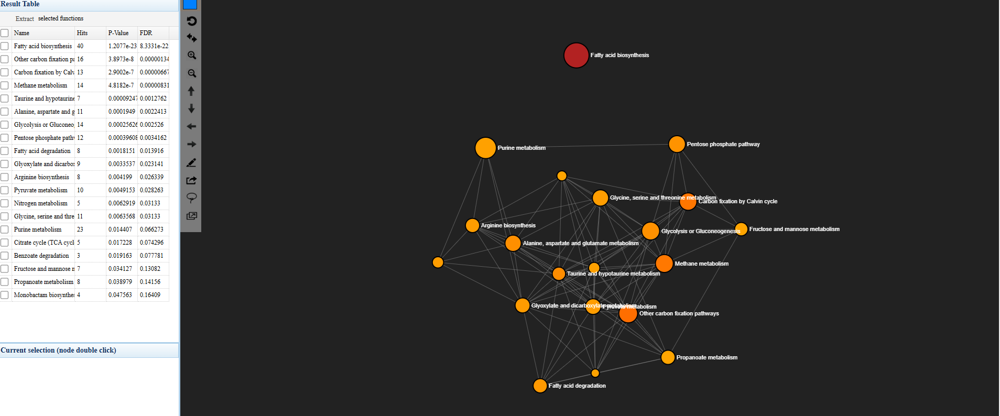

In [38]:
from IPython.display import Image, display

# 1) Load and display by filename
img = Image(filename="results/Screenshot 2025-06-26 102450.png")
display(img)

The network visualization and enrichment results highlight several metabolic pathways that are significantly enriched and interconnected, many of which have known relevance to cancer biology. The most enriched pathway is Fatty acid biosynthesis. Additionally, pathways such as Glycolysis or Gluconeogenesis, Methane metabolism, Carbon fixation, and Amino acid metabolism (e.g., Alanine, aspartate, and glutamate metabolism) are tightly clustered, suggesting co-regulation or shared metabolic intermediates.

## 2.4.3 Explore common compounds between the metabolomics and metaproteomics analysis

In this part of the code, we extract the common compound IDs between the metaproteomic and metabolomics part.

In [17]:
import pandas as pd

# 1) Load metabolomics Excel file
metab_df = pd.read_excel(
    'results/Metabolite Dataframe - KEGG.Corrected.xlsx'
)

# 2) Extract and clean all KEGG IDs into a flat, unique list
kegg_ids = (
    metab_df['KEGG.ID']
    .dropna()
    .astype(str)
    .str.split(',')
    .explode()
    .str.strip()
    .unique()
)

# 3) Load the master list of unique compound IDs
df_unique   = pd.read_csv("results/unique_compounds.tsv", sep="\t")
unique_ids  = df_unique['Compound ID'].astype(str).unique()

# 4) Compute the intersection between the two sets
common_ids = sorted(set(kegg_ids).intersection(unique_ids))

# 5) Print and save the common KEGG IDs
print(f"Found {len(common_ids)} common KEGG IDs:")
for cid in common_ids:
    print(cid)

pd.DataFrame(common_ids, columns=['Compound ID']) \
  .to_csv("results/common_compound_ids.txt", sep="\t", index=False)

Found 18 common KEGG IDs:
C00009
C00022
C00037
C00049
C00064
C00065
C00073
C00079
C00106
C00130
C00135
C00149
C00152
C00245
C00263
C00299
C00334
C00884


To understand what metabolites we had, we used the Compound ID Conversion utility in MetaboAnalyst 5.0.(Chong et al.2018) We navigated to MetaboAnalyst.ca, pressed "Click here to start" launched the “Compound ID conversion” tool, and specified “KEGG IDs” as the input format. The list of common KEGG compound identifiers previously intersected between our metabolomics dataset and the EC-derived compound was pasted into the input box. We clicked on "ÿou can download the data here" and the resulting csv file was uploaded into the results folder (name_map.csv).

With the code below we can inspect our common compounds.

In [1]:
import csv
with open("results/name_map.csv", newline="") as f:
    reader = csv.reader(f)
    for row in reader:
        # row[0] is Query, row[1] is Match
        print(row[0], row[1])

Query Match
C00009 Phosphate
C00022 Pyruvic acid
C00037 Glycine
C00049 L-Aspartic acid
C00064 Glutamine
C00065 Serine
C00073 Methionine
C00079 Phenylalanine
C00106 Uracil
C00130 Inosinic acid
C00135 Histidine
C00149 Malic acid
C00152 L-Asparagine
C00245 Taurine
C00263 L-Homoserine
C00299 Uridine
C00334 gamma-Aminobutyric acid
C00884 Homocarnosine


While some common compounds are quite general, others warrant further investigation. This will be addressed in the individual report.

## 2.4.3 Explore taxa related functions

We start by loading our organism–EC mapping from results/organisms_and_ec.tsv into a pandas DataFrame and immediately drop any rows where the ec_references field is empty, ensuring only records with at least one EC code remain. Next, we remove the literal “EC:” prefix from each entry and split the space-delimited string into a Python list so that each cell contains one or more discrete EC numbers. Since placeholder ECs (those containing a hyphen) cannot be reliably linked to actual reactions, we filter out any row whose EC list includes a “–”. Finally, we apply pandas’ explode to expand each list element into its own row.

In [2]:
import pandas as pd

# Load file and process the EC column as before
df_taxon_ec = pd.read_csv("results/organisms_and_ec.tsv", sep="\t")
df_taxon_ec = df_taxon_ec.dropna(subset=["ec_references"])
df_taxon_ec["ec_references"] = df_taxon_ec["ec_references"].str.replace("EC:", "")
df_taxon_ec["ec_references"] = df_taxon_ec["ec_references"].str.split()

# Filter out rows where any EC in the list contains a hyphen
df_taxon_ec = df_taxon_ec[df_taxon_ec["ec_references"].apply(lambda ec_list: all("-" not in ec for ec in ec_list))]

# Now explode the list into separate rows
df_taxon_ec = df_taxon_ec.explode("ec_references").reset_index(drop=True) # put multiple EC numbers in different rows

print(df_taxon_ec.head())

                         taxon_name ec_references
0  Dolosigranulum pigrum ATCC 51524      4.2.1.11
1                    Prevotella sp.      4.1.1.49
2           Clostridiales bacterium       5.2.1.8
3      Faecalibacterium prausnitzii     1.1.1.157
4               Porphyromonas levii      2.3.1.29


Following that, we load the EC‐to‐compound lookup table from results/ec_to_compounds_via_reactions.tsv into df_ec_map. Then we  join between our cleaned organism–EC DataFrame (df_taxon_ec for above) and df_ec_map. By doing the merge, we ensure every organism–EC record is preserved, while compound identifiers and reaction names are appended wherever an EC match exists.

In [4]:
import pandas as pd

# 1) Load EC → compound map
df_ec_map = pd.read_csv("results/ec_to_compounds_via_reactions.tsv", sep="\t")

# 2) Merge organism–EC with EC→compound
df_func = pd.merge(
    df_taxon_ec,
    df_ec_map,
    left_on="ec_references",
    right_on="EC",
    how="left"
)

# 3) Remove the now-redundant EC column
df_func = df_func.drop(columns=["EC"])

# 4) Inspect and save
print(df_func.head())
output_filename = "results/merged_ec_compounds.tsv"
df_func.to_csv(output_filename, sep="\t", index=False)
print(f"\nMerged file saved as {output_filename}")

                         taxon_name ec_references Compound ID  \
0  Dolosigranulum pigrum ATCC 51524      4.2.1.11      C00001   
1  Dolosigranulum pigrum ATCC 51524      4.2.1.11      C00074   
2  Dolosigranulum pigrum ATCC 51524      4.2.1.11      C00631   
3  Dolosigranulum pigrum ATCC 51524      4.2.1.11      C03356   
4  Dolosigranulum pigrum ATCC 51524      4.2.1.11      C04309   

                                  Name  
0                                  H2O  
1                  Phosphoenolpyruvate  
2                2-Phospho-D-glycerate  
3              3-Phospho-D-erythronate  
4  Phosphoenol-4-deoxy-3-tetrulosonate  

Merged file saved as results/merged_ec_compounds.tsv


In this step, we load our full organism–enzyme–compound mapping from results/merged_ec_compounds.tsv and then focus only on the dozen taxa identified as most abundant in our microbiome survey. By filtering the DataFrame to those organism names, we isolate the subset of compound associations tied to the community’s dominant members. Next, we group by taxon_name and extract the unique set of compound names for each species, producing a concise table that links each abundant microbe to its potential metabolic outputs. 

In [6]:
import pandas as pd

# Load the merged file
df_merged = pd.read_csv("results/merged_ec_compounds.tsv", sep="\t")

# List of your most abundant organisms (from the image)
abundant_organisms = [
    "Oscillospiraceae bacterium",
    "Bacteroidales bacterium",
    "Faecalibacterium prausnitzii",
    "Lachnospiraceae bacterium",
    "Prevotella sp.",
    "Segatella copri",
    "Bacteroidota bacterium",
    "Ruminococcus sp.",
    "Faecalibacterium sp. CAG:82-related_59_9",
    "Phocaeicola vulgatus",
    "Clostridiales bacterium",
    "Agathobacter rectalis"
]

# Filter the merged DataFrame to include only rows from these abundant organisms.
df_abundant = df_merged[df_merged["taxon_name"].isin(abundant_organisms)]

# If you want to inspect which compounds are associated with each organism,
# you can group the data by taxon and collect the unique compound names.
compound_per_org = (
    df_abundant.groupby("taxon_name")["Name"]
              .unique()
              .reset_index()
              .rename(columns={"Name": "Compound Names"})
)


# Optionally, save this summary to a file
compound_per_org.to_csv("results/abundant_organism_compounds.tsv", sep="\t", index=False)

With the code below we will investigate the unique metabolites produced by our most abundant organisms. We start by reading results/merged_ec_compounds.tsv into a DataFrame and keep only the rows for our abundant_organisms. Then we drop any entries missing a compound name and remove duplicate organism–compound pairs so each link is unique. Next, we count how many of those organisms produce each compound and select only the compounds with a count of one. By merging this back with the filtered DataFrame, we identify exactly which abundant species makes each unique compound

/tmp/ipykernel_1261/3364618493.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_plot, x="unique_compound_count", y="taxon_name", palette="rocket")


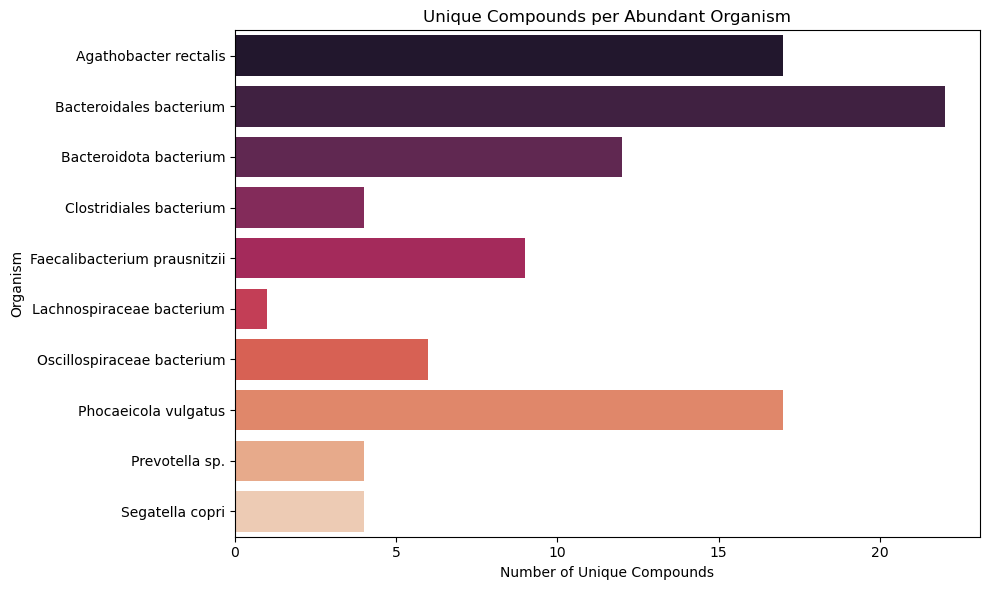

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------
# Step 1: Load the merged compound-EC-organism dataset
df_merged = pd.read_csv("results/merged_ec_compounds.tsv", sep="\t")

# ---------------------------
# Step 2: Define your abundant organisms
abundant_organisms = [
    "Oscillospiraceae bacterium",
    "Bacteroidales bacterium",
    "Faecalibacterium prausnitzii",
    "Lachnospiraceae bacterium",
    "Prevotella sp.",
    "Segatella copri",
    "Bacteroidota bacterium",
    "Ruminococcus sp.",
    "Faecalibacterium sp. CAG:82-related_59_9",
    "Phocaeicola vulgatus",
    "Clostridiales bacterium",
    "Agathobacter rectalis"
]

# Filter the dataset to only include the abundant organisms
df_abundant = df_merged[df_merged["taxon_name"].isin(abundant_organisms)]

# ---------------------------
# Step 3: Clean and isolate organism-compound pairs
df_abundant = df_abundant.dropna(subset=["Name"])  # Remove rows with missing compound names
df_unique_pairs = df_abundant.drop_duplicates(subset=["taxon_name", "Name"])  # unique organism-compound pairs

# ---------------------------
# Step 4: Identify compounds that appear in only one organism
df_counts = df_unique_pairs.groupby("Name")["taxon_name"].nunique().reset_index()
df_counts = df_counts.rename(columns={"taxon_name": "organism_count"})
df_unique_only = df_counts[df_counts["organism_count"] == 1]

# ---------------------------
# Step 5: Link each unique compound back to its producing organism
df_organism_for_unique = pd.merge(df_unique_only, df_unique_pairs, on="Name")
df_organism_for_unique = df_organism_for_unique.drop_duplicates(subset=["Name", "taxon_name"])
df_organism_for_unique = df_organism_for_unique.sort_values(by="taxon_name")

# Display the list
# print("Compounds uniquely produced by a single abundant organism:\n")
# for _, row in df_organism_for_unique.iterrows():
#     print(f"{row['taxon_name']} → {row['Name']}")

# ---------------------------
# Step 6: Optional — plot the number of unique compounds per organism
df_plot = df_organism_for_unique.groupby("taxon_name")["Name"].nunique().reset_index()
df_plot = df_plot.rename(columns={"Name": "unique_compound_count"})

plt.figure(figsize=(10, 6))
sns.barplot(data=df_plot, x="unique_compound_count", y="taxon_name", palette="rocket")
plt.xlabel("Number of Unique Compounds")
plt.ylabel("Organism")
plt.title("Unique Compounds per Abundant Organism")
plt.tight_layout()
plt.show()

As we see from the unique compounds above, some can be very general ones like amino acids, but there are hits worth investigation. More on this on the individual report part. 

**Note!** We generated a reverse plot of the common compounds produced by the most abundant organisms, but it isn’t included in this notebook because it consists mainly of general metabolites that aren’t worth exploring further.

## 2.4.3 Functional Annotation using Unipept

In the final step, we turned to Unipept’s Metaproteomics Analysis (https://unipept.ugent.be/) to annotate each sample’s protein set. For every dataset, we opened the Metaproteomics Analysis module, left all parameters at their defaults, and simply copy-pasted the plain-text list of protein sequences into the input field. After submitting, Unipept processed each sample independently and produced tables of lowest common ancestor taxonomic assignments alongside functional annotations. ( Vande et al. 2024)

For the sake of time we only include the Molecular Functions and Biological Processes obtained from Unipept, and compare them to our own findings. 

**Results from Unipept: Sample 1: Colectomy + CRC**

In [19]:
from IPython.display import Image, display
file1 =  "results/Screenshot 2025-06-26 111915.png"
file2 =  "results/Screenshot 2025-06-26 112229.png"

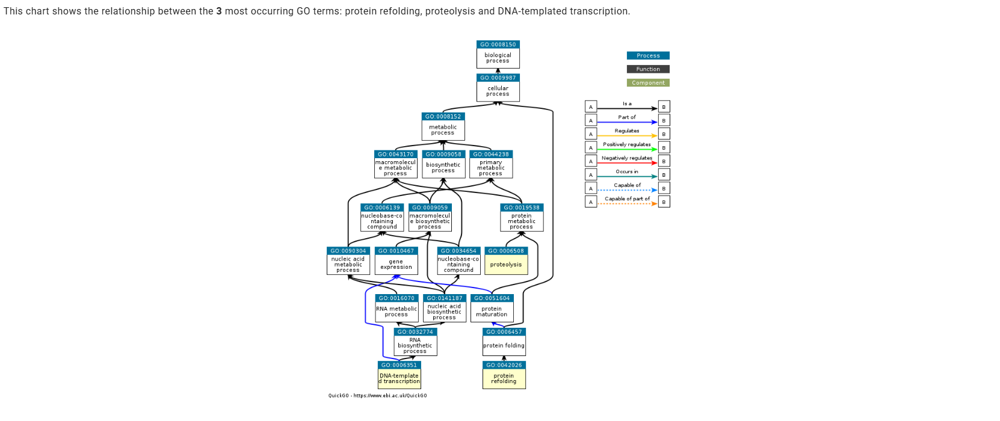

In [24]:
display(Image(file1, height = 1500, width = 2000))
    

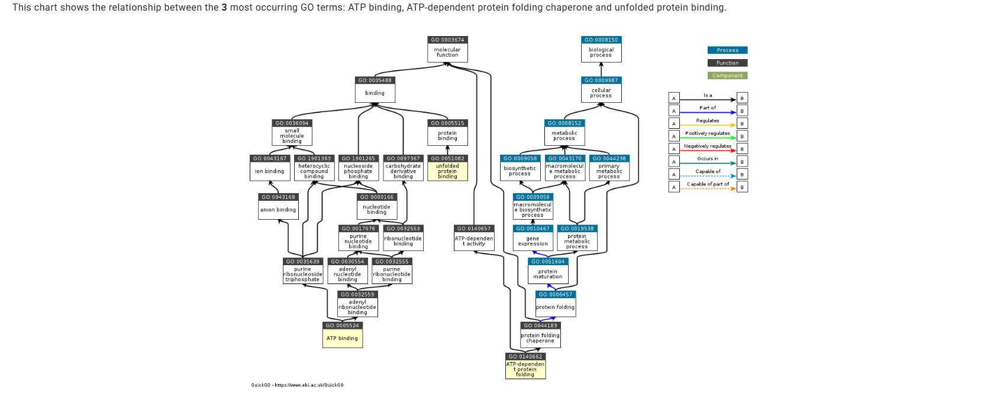

In [33]:
display(Image(file2, height = 1500, width = 2000))

**1)Biological Process**


The GO analysis of our cancer-patient data reveals enrichment in three key biological processes: protein refolding, proteolysis and DNA-templated transcription. 

**2)Molecular Function**


Prominently featured are "ATP binding," a fundamental molecular function indicating the capability of numerous proteins to bind adenosine triphosphate. 

**Results from Unipept: Sample 2:Colectomy then Follow up (stable stage)**

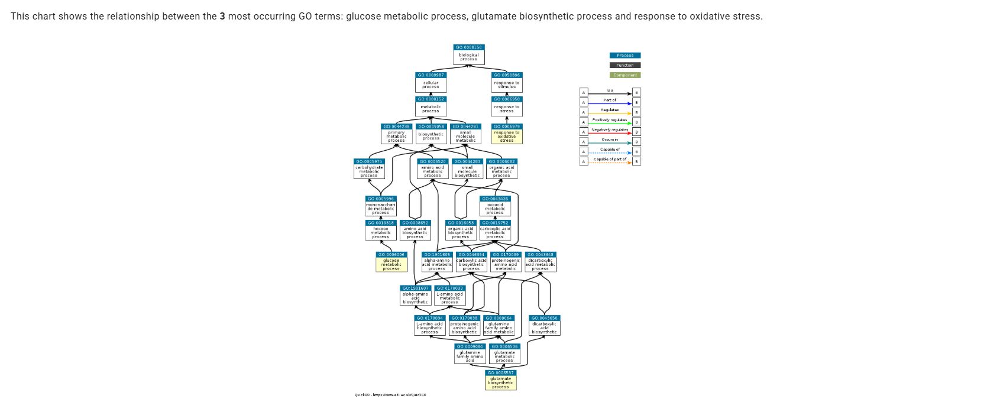

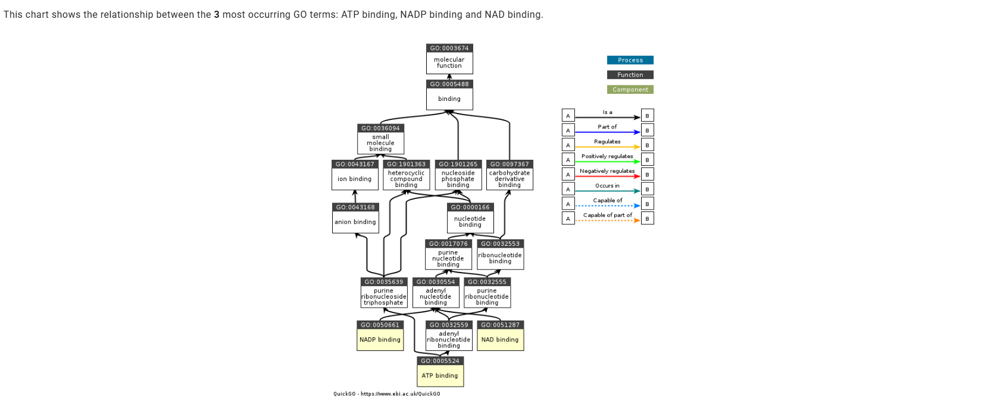

In [3]:
from IPython.display import Image, display
from IPython.display import HTML, display
filenames = [
    "results/Screenshot 2025-06-26 112430.png",
    "results/Screenshot 2025-06-26 112443.png",
]

for fn in filenames:
    display(Image(filename=fn))

**1)Biological Process**

The GO analysis of our cancer patient data reveals enrichment in three interconnected biological processes: "glucose metabolic process," "glutamate biosynthetic process," and "response to oxidative stress." 


**2)Molecular Function**

The molecular function analysis  highlights three key binding capabilities: "ATP binding," "NADP binding," and "NAD binding." 

**Results from Unipept: Sample 4:Colectomy and developed recurrence**

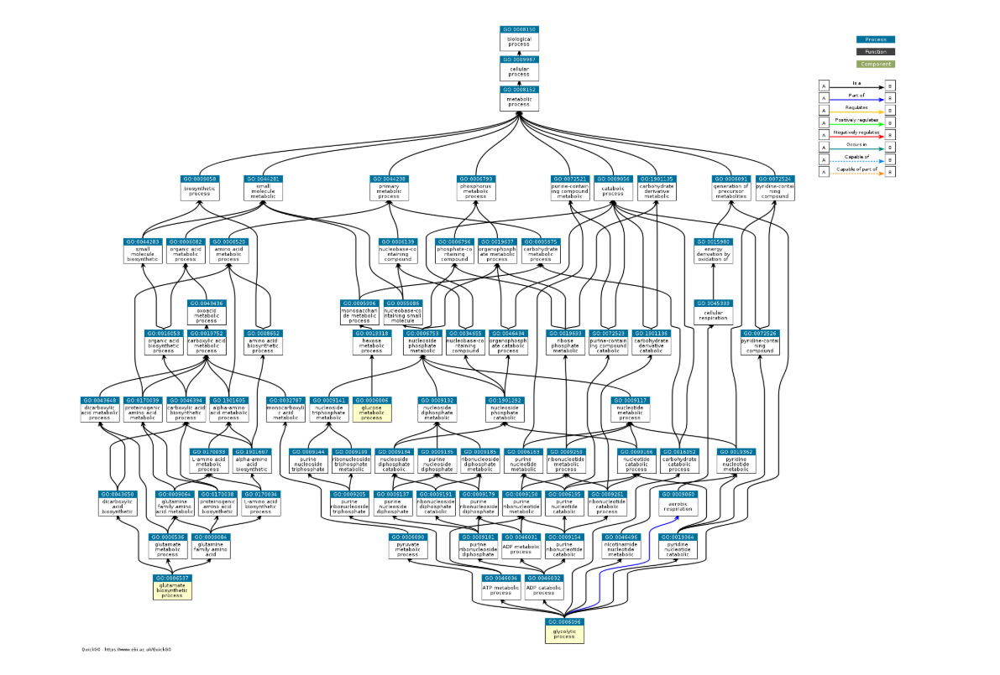

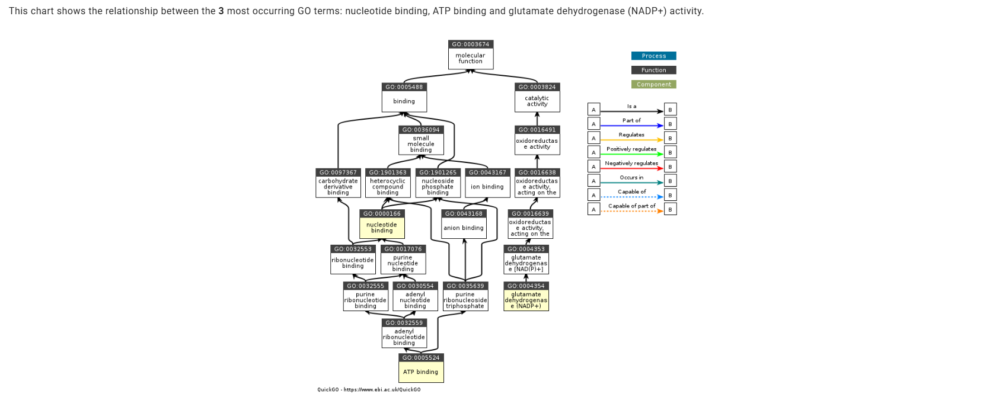

In [3]:
from IPython.display import Image, display
from IPython.display import HTML, display
filenames = [
    "results/Screenshot 2025-07-04 112051.png",
    "results/Screenshot 2025-06-26 112730.png",
]
for fn in filenames:
    display(Image(filename=fn))

**1)Biological Process**

The GO analysis of our cancer patient data reveals enrichment in three interconnected biological processes: " glutamate biosynthetic process," "glucose metabolic process," and "glycolitic process." 


**2)Molecular Function**

The molecular function analysis  highlights three key binding capabilities: "ATP binding and glutamate ehydrogenase NADP+ activity." 

**Results from Unipept: Sample 5:Healthy**

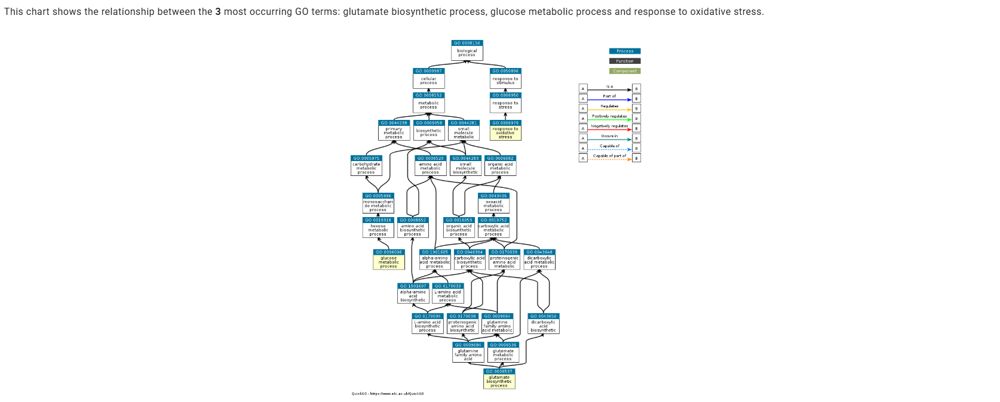

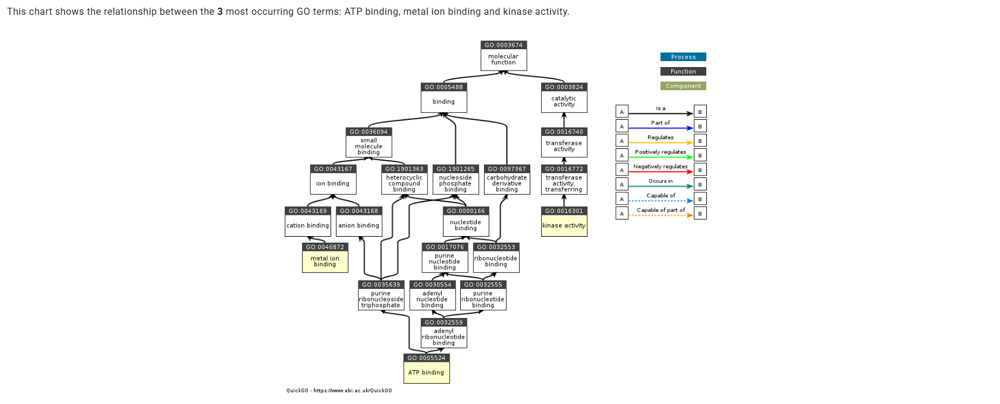

In [5]:
from IPython.display import Image, display

filenames = [
    "results/Screenshot 2025-06-27 092107.png",
    "results/Screenshot 2025-06-27 092116.png",
]

for fn in filenames:
    display(Image(filename=fn))

**1)Biological Process**

The GO analysis of our cancer patient data reveals enrichment in three interconnected biological processes: "glutamate biosynthetic process," "glucose metabolic process," and "response to oxidative stress".


**2)Molecular Function**

The molecular function analysis  highlights three key binding capabilities: "ATP binding","metal ion binding" and "kinase activity."

**Note!** An interactive display was set up so the user could zoom in the pictures and see n details the functions and processes above, but it did not work with the html file and therefore was removed

**All of the above information regarding the functional annotation in Unipept will be further discussed in the individual report**

**Bibliography**

1) Long, S., Yang, Y., Shen, C. et al. Metaproteomics characterizes human gut microbiome function in colorectal cancer. npj Biofilms Microbiomes 6, 14 (2020). https://doi.org/10.1038/s41522-020-0123-4
2) Khattab, R.H., Abo-Hammam, R.H., Salah, M. et al. Multi-omics analysis of fecal samples in colorectal cancer Egyptians patients: a pilot study. BMC Microbiol 23, 238 (2023). https://doi.org/10.1186/s12866-023-02991-x
3) Tanca, A., Abbondio, M., Fiorito, G., Pira, G., Sau, R., Manca, A., Muroni, M. R., Porcu, A., Scanu, A. M., Cossu-Rocca, P., De Miglio, M. R., & Uzzau, S. (2022). Metaproteomic Profile of the Colonic Luminal Microbiota From Patients With Colon Cancer. Frontiers in microbiology, 13, 869523. https://doi.org/10.3389/fmicb.2022.869523
4) Buchfink B, Reuter K, Drost H G. Sensitive protein alignments at tree-of-life scale using DIAMOND. Nature Methods. 2021;18(5):366–368. https://doi:10.1038/s41592-021-01101-x
5) Camacho C, Coulouris G, Avagyan V, Ma N, Papadopoulos J, Bealer K, Madden TL. 2009. BLAST+: architecture and applications. BMC Bioinformatics. 10:421. https://doi:10.1186/1471-2105-10-421
6) UniProt Consortium (2023). UniProt: the Universal Protein Knowledgebase in 2023. Nucleic acids research, 51(D1), D523–D531. https://doi.org/10.1093/nar/gkac1052
7) Elias, J. E., & Gygi, S. P. (2007). Target-decoy search strategy for increased confidence in large-scale protein identifications by mass spectrometry. Nature methods, 4(3), 207–214. https://doi.org/10.1038/nmeth1019
8) The Human Microbiome Project Consortium. Structure, function and diversity of the healthy human microbiome. Nature 486, 207–214 (2012). https://doi.org/10.1038/nature11234
9) Timothy J. Griffin, Pratik Jagtap, James Johnson, Clemens Blank, Subina Mehta, Metaproteomics tutorial (Galaxy Training Materials). https://training.galaxyproject.org/training-material/topics/proteomics/tutorials/metaproteomics/tutorial.html Online; accessed Wed Jul 02 2025
10) Hiltemann, Saskia, Rasche, Helena et al., 2023 Galaxy Training: A Powerful Framework for Teaching! PLOS Computational Biology 10.1371/journal.pcbi.1010752
11) Jalili V, Afgan E, Gu Q, Clements D, Blankenberg D, Goecks J, Taylor J, Nekrutenko A."The Galaxy platform for accessible, reproducible and collaborative biomedical analyses: 2022 update."Nucl. Acids Res. 2022 Jul 5;50(W1):W345–W351. https://doi.org/10.1093/nar/gkac247
12) Huerta-Cepas, J., Szklarczyk, D., Forslund, K., Cook, H., Heller, D., Walter, M. C., Rattei, T., Mende, D. R., Sunagawa, S., Kuhn, M., Jensen, L. J., von Mering, C., & Bork, P. (2015). eggNOG 4.5: a hierarchical orthology framework with improved functional annotations for eukaryotic, prokaryotic and viral sequences. Nucleic Acids Research, 44(D1), D286–D293. https://doi.org/10.1093/nar/gkv1248 Visit reference
13)  Kessner, D., Chambers, M., Burke, R., Agus, D., & Mallick, P. (2008). ProteoWizard: open source software for rapid proteomics tools development. Bioinformatics, 24(21), 2534–2536. https://doi.org/10.1093/bioinformatics/btn323
14)  Kadhim, F.J.; Aziz, Z.S.; Ibrahim, K.S. Gut Microbiome Profiles in Colorectal Cancer Patients in Iraq. Microbiol. Res. 2025, 16, 22. https://doi.org/10.3390/microbiolres16010022
15)  He, Xiaoya & Zhao, Shuyang & Li, Yan. (2021). Faecalibacterium prausnitzii: A Next-Generation Probiotic in Gut Disease Improvement. Canadian Journal of Infectious Diseases and Medical Microbiology. 2021. 1-10. 10.1155/2021/6666114.
16)  Tett, A., Pasolli, E., Masetti, G., Ercolini, D., & Segata, N. (2021). Prevotella diversity, niches and interactions with the human host. Nature reviews. Microbiology, 19(9), 585–599. https://doi.org/10.1038/s41579-021-00559-y
17) Klopfenstein DV, Zhang L, Pedersen BS, et al. GOATOOLS: A Python library for Gene Ontology analyses. Scientific Reports. 2018;8:4227. DOI:10.1038/s41598-018-22605-9.
18) Vande Moortele, T., Devlaminck, B., Van de Vyver, S., Van Den Bossche, T., Martens, L., Dawyndt, P., Mesuere, B., & Verschaffelt, P. (2025). Unipept in 2024: Expanding Metaproteomics Analysis with Support for Missed Cleavages and Semitryptic and Nontryptic Peptides. Journal of proteome research, 24(2), 949–954. https://doi.org/10.1021/acs.jproteome.4c00848
19) Supek F, Bošnjak M, Škunca N, Šmuc T. 2011. REVIGO summarizes and visualizes long lists of Gene Ontology terms. PLoS ONE 6(7):e21800. https://doi.org/10.1371/journal.pone.0021800






# 3) Metabolomics Analysis of Khattab et al. (2023)

###### by _Elias Mert Mayadag_  
<br>

The interpretation of metabolomics data is known to be less straigtforward then other omics, as the role of some metabolites may not be annotated or they can fulfill different functions at different concetrations or biological contexts (1). Khattab et al. (2023) identify in their research some bile acids and their metabolized versions as the main differentially present metabolites, especially taurocholic acid, taurochenodeoxycholic acid, taurine, glychoholic acid, glychochenodeoxycholic acid and 7-ketodeoxycholic acid. Additionally, they emphasize the strong presence of spermidine in all but liver metastatic patient, and indicate that short chain fatty acids were observed in very low concentrations as expected.

In the following section, we want to analyze their publicly available data (Supplementary Material 1, Table 6  and 7) and try to gain further insights into the metabolic activities separating the metabolome of these patients. 
<br>

1. Monteiro et al. (2013), Metabolomics Analysis for Biomarker Discovery: Advances and Challenges. doi: 10.2174/0929867311320020006

### The analysis is divided into 4 parts:

##### 1) Data Preparation
##### 2) Metabolite Analysis with Princple Component Analysis and Heatmaps
##### 3) Enrichment and Functional Analysis
##### 4) Comperative Literature Analysis

The word document from the paper was obtained from the file Supplementary Material 1, Table 6 of the article of Khattab et al. (2023) and manually copied to a excel file. This excel file is available with this Jupyter notebook as "Metabolites_excel_Khattab.xlsx". This data can be found in the folder named "data" using the following website:

https://1drv.ms/f/c/6e85cd1c5d60d57a/Eocs-iQrm8NLh8t4XoTAbaIBhmVz5YjPh15h1Vq4D3Ac3g?e=S2wR9H

First, import all the necessary libraries:

In [43]:
!pip install  openpyxl     -qq
!pip install  seaborn      -qq
!pip install  bioservices  -qq
!pip install  ipywidgets   -qq

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from bioservices import KEGG, ChEBI
kegg = KEGG()
chebi = ChEBI()
import time
from IPython.display import display, HTML, Image
import ipywidgets as widgets
from itertools import zip_longest
import base64

## 3.1) Data Preparation

In [3]:
# Then read the excel file with metabolite fold changes (compared to healthy individual) as a data frame and call is "metab_df:
metab_df = pd.read_excel('Metabolomics/Metabolomics Documents/Metabolites_excel_Khattab.xlsx')
metab_df.head()

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,Unnamed: 8,CRC recurrent patient
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Glycine,C00037,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",-2.12,3.10,2.21,NaN,3.10
2,l-phenylalanine,C00079,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",0.65,1.20,2.50,NaN,1.20
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,L-proline,C16435,NaN,NaN,NaN,4.36,-4.87,5.69,NaN,-4.86


In [4]:
# Removal of an empty column and rows with only NaN values
metab_df.drop(columns = ['Unnamed: 8'], inplace=True)
metab_df[metab_df['Metabolite Name'].isna()]

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,CRC recurrent patient
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
173,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
175,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
177,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
179,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
metab_df.dropna(subset = ['Metabolite Name'], inplace=True)
metab_df = metab_df.reset_index(drop=True)



In [6]:
# Some metabolites were found multiple times, so their averages will be calculated,
# the annotations will be retrieved from the first entry with the same name:

metab_df = metab_df.groupby("Metabolite Name").agg(
    {'KEGG.ID'     : 'first',
     'Super. Class':'first',
     'class'       : 'first',
     'Subclass'    :'first',

     'CRC patient treated with folfiri after colectomy': 'mean',
     'Follow up CRC patient treated with folfox' : 'mean',
     'Liver Metastatic CRC patient': 'mean',
     'CRC recurrent patient': 'mean'}
    ).reset_index()

metab_df.index = metab_df.index + 1
metab_df.head(10)

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,CRC recurrent patient
1,(2e)-hexadecenoylcarnitine,None,Lipids and lipid-like molecules,Fatty Acyls,Fatty acid esters,3.48,2.28,3.73,2.28
2,(s)-malate,C00149,Organic acids and derivatives,Hydroxy acids and derivatives,Beta hydroxy acids and derivatives,3.38,2.07,1.28,2.26
3,.alpha.-aminoadipic acid,None,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",-0.21,1.12,-1.40,1.12
4,2'-deoxyadenosine,C00559,"Nucleosides, nucleotides, and analogues",Purine nucleosides,Purine 2'-deoxyribonucleosides,-4.45,-3.10,1.93,-3.10
5,2'-deoxycytidine,C00881,"Nucleosides, nucleotides, and analogues",Pyrimidine nucleosides,Pyrimidine 2'-deoxyribonucleosides,4.78,1.28,2.85,2.05
6,2-keto-glutaramic acid,C00940,Organic acids and derivatives,Keto acids and derivatives,Short-chain keto acids and derivatives,2.35,2.85,1.22,2.85
7,"3,4-dihydroxyphenylacetic acid",C01161,Benzenoids,Phenols,Benzenediols,-0.81,5.36,-1.04,-5.36
8,3-hydroxyphenylacetic acid,C05593,Benzenoids,Phenols,1-hydroxy-4-unsubstituted benzenoids,0.66,2.17,2.68,2.17
9,3b-hydroxy-5-cholenoic acid,None,Lipids and lipid-like molecules,Steroids and steroid derivatives,"Bile acids, alcohols and derivatives",NaN,NaN,NaN,3.25
10,4-formyl-2-methoxyphenyl hydrogen sulfate,None,Organic acids and derivatives,Organic sulfuric acids and derivatives,Arylsulfates,3.47,2.85,2.76,2.85


In [7]:
# For metabolic compounds, different identification systems are available.
# In the following, we will use the KEGG IDs from Kyoto Encyclopedia of Genes and Genomes
# and the CHEBI IDs  from Chemical Entities of Biological Interest

# Some KEGG.IDs are not filled in the excel file and this is partly due to not-matching compound names 
# and partly due to non-availability of these KEGG IDs.

# In the following, we will try to retrieve the KEGG IDs from Biopython's KEGG module.
# This will not be possible for all compounds and we will need to enter KEGG IDs manually if needed.
# If no KEGG ID is available for a compound, we will introduce the CHEBI ID instead. 

In [8]:
# # For simplicity reasons, YOU CAN SKIP THIS BLOCK, and instead UPLOAD THE EXCEL VERSION WITH COMPLETE KEGG IDs
# # IN THE NEXT CODE SNIPPET.

# def get_kegg_id_interactive(name):
#     try:
#         result = kegg.find("compound", name)
#         time.sleep(0.3)
#         if result:
#             first_hit = result.strip().split('\n')[0]
#             kegg_id = first_hit.split('\t')[0].replace('cpd:', '')
#             print(f"Found KEGG ID for '{name}': {kegg_id}")
#             if not kegg_id.startswith("C"):
#                 print(f"KEGG ID '{kegg_id}' does not start with 'C'.")
#                 # Prompt until valid KEGG ID is provided
#                 while True:
#                     user_input = input(f"Please enter a valid KEGG ID for '{name}' (must start with 'C'): ").strip()
#                     if user_input and user_input.startswith("C"):
#                         return user_input
#                     print("Invalid input. KEGG ID must start with 'C' and cannot be blank.")
#             else:
#                 return kegg_id
#         else:
#             print(f"No KEGG ID found for '{name}'.")
#     except Exception as e:
#         print(f"Error searching for '{name}': {e}")

#     # Prompt until valid KEGG ID is provided
#     while True:
#         user_input = input(f"Please enter KEGG ID for '{name}' (must start with 'C'): ").strip()
#         if user_input and user_input.startswith("C"):
#             return user_input
#         print("Invalid input. KEGG ID must start with 'C' and cannot be blank.")

# # Create a boolean mask for rows where KEGG.ID does NOT start with "C"
# mask = ~metab_df['KEGG.ID'].str.startswith('C', na=False)
# # With the following code, apply the function only on those rows, and assign results back to 'KEGG.ID' column for these rows:
# metab_df.loc[mask, 'KEGG.ID'] = metab_df.loc[mask, 'Metabolite Name'].apply(get_kegg_id_interactive)

# # SAVE THE DATA FRAME AS FILE FOR LATER USE:

# metab_df.to_excel("Metabolomics/Metabolomics Documents/Metabolite Dataframe - KEGG.Corrected.xlsx", index=False)


### During this step, following entries were supplied manually:

###### (2e)-hexadecenoylcarnitine                 => CHEBI:86031

###### alpha.-aminoadipic acid                    => C00956

###### 3b-hydroxy-5-cholenoic acid                => CHEBI:89234

###### 4-formyl-2-methoxyphenyl hydrogen sulfate  => CHEBI:172318

###### 7-ketodeoxycholic acid                     => C04643

###### 8-hydroxy-deoxyguanosine                   => CHEBI:40304

###### Alanyltryptophan                           => C00806   (Introduced as L-trptophan due to lack of KEGG ID/ChEBI ID/Annotation)

###### Butenylcarnitine                           => CHEBI:88785

###### Chenodeoxycholic acid 3-sulfate            => CHEBI:89060

###### Decanoylcarnitine                          => C03299

###### D-/L-Glutamine                             => C00064

###### Glutarylcarnitine                          => CHEBI:82952

###### Leucyltryptophan                           => CHEBI:73590

###### Lysopc(18:3(9z,12z,15z))                   => CHEBI:88697

###### Lysopc(22:1(13z))                          => CHEBI:88684

###### N-acetylcytidine                           => C22293

###### D-/L-Homoserine                            => C00263

###### inosine-5'-monophosphate (imp)             => C00130

###### υ-l-glutamyl-l-glutamic acid               => CHEBI:73705






In [9]:
# The above step can be skipped by using the already prepared data:
metab_df = pd.read_excel('Metabolomics/Metabolomics Documents/Metabolite Dataframe - KEGG.Corrected.xlsx')


In [10]:
metab_df.head()

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,CRC recurrent patient
0,(2e)-hexadecenoylcarnitine,CHEBI:86031,Lipids and lipid-like molecules,Fatty Acyls,Fatty acid esters,3.48,2.28,3.73,2.28
1,(s)-malate,C00149,Organic acids and derivatives,Hydroxy acids and derivatives,Beta hydroxy acids and derivatives,3.38,2.07,1.28,2.26
2,.alpha.-aminoadipic acid,C00956,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",-0.21,1.12,-1.40,1.12
3,2'-deoxyadenosine,C00559,"Nucleosides, nucleotides, and analogues",Purine nucleosides,Purine 2'-deoxyribonucleosides,-4.45,-3.10,1.93,-3.10
4,2'-deoxycytidine,C00881,"Nucleosides, nucleotides, and analogues",Pyrimidine nucleosides,Pyrimidine 2'-deoxyribonucleosides,4.78,1.28,2.85,2.05


In [11]:
# Now we will create a function to retrieve the CHEBI IDs from the KEGG library.
# For compounds without KEGG ID, we have already manually introduced the CHEBI IDs into the KEGG ID column

def get_chebi_id(value):
    # If value already contains 'chebi', extract and return numeric ID
    if isinstance(value, str) and 'chebi' in value.lower():
        return value.split(':')[-1].strip()
    
    try:
        entry = kegg.get(value)
        if entry:
            for line in entry.splitlines():           
                if 'ChEBI:' in line:
                    # Example line: "DBLINKS     ChEBI: 4167"
                    parts = line.split('ChEBI:')
                    if len(parts) > 1:
                        chebi_id = parts[1].strip()
                        # Some lines might have multiple IDs separated by space, take first
                        chebi_id = chebi_id.split()[0]
                        return chebi_id
        return None
    except Exception as e:
        print(f"Error retrieving KEGG entry for {value}: {e}")
        return None

# Here, the function will be applied to the KEGG ID column to create a new column called CHEBI ID with the corresponding IDs.
metab_df['CHEBI.ID'] = metab_df['KEGG.ID'].apply(get_chebi_id)

In [12]:
metab_df.head()

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,CRC recurrent patient,CHEBI.ID
0,(2e)-hexadecenoylcarnitine,CHEBI:86031,Lipids and lipid-like molecules,Fatty Acyls,Fatty acid esters,3.48,2.28,3.73,2.28,86031
1,(s)-malate,C00149,Organic acids and derivatives,Hydroxy acids and derivatives,Beta hydroxy acids and derivatives,3.38,2.07,1.28,2.26,15589
2,.alpha.-aminoadipic acid,C00956,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",-0.21,1.12,-1.40,1.12,37023
3,2'-deoxyadenosine,C00559,"Nucleosides, nucleotides, and analogues",Purine nucleosides,Purine 2'-deoxyribonucleosides,-4.45,-3.10,1.93,-3.10,17256
4,2'-deoxycytidine,C00881,"Nucleosides, nucleotides, and analogues",Pyrimidine nucleosides,Pyrimidine 2'-deoxyribonucleosides,4.78,1.28,2.85,2.05,15698


In [13]:
# Check if all CHEBI IDs are found:
metab_df[metab_df["CHEBI.ID"].isnull()]

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,CRC recurrent patient,CHEBI.ID
64,N-acetylcytidine,C22293,"Nucleosides, nucleotides, and analogues",Pyrimidine nucleosides,NaN,0.12,3.96,0.11,3.96,None
68,Ophthalmic acid,C21016,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",8.44,1.32,-0.62,1.32,None


In [14]:
# Manually introduce the missing CHEBI IDs:
for idx, row in metab_df[metab_df["CHEBI.ID"].isnull()].iterrows():
    print(f"\nRow {idx}:")
    print(row)
    new_value = input(f"Enter a new CHEBI.ID for '{row['CHEBI.ID']}': ").strip()

    # Convert to integer if possible
    if new_value.isdigit():
        metab_df.at[idx, "CHEBI.ID"] = int(new_value)
    else:
        print("Invalid input (must be a number). Skipping this row.")


Row 64:
Metabolite Name                                                            N-acetylcytidine
KEGG.ID                                                                              C22293
Super. Class                                        Nucleosides, nucleotides, and analogues
class                                                                Pyrimidine nucleosides
Subclass                                                                                NaN
CRC patient treated with folfiri after colectomy                                       0.12
Follow up CRC patient treated with folfox                                              3.96
Liver Metastatic CRC patient                                                           0.11
CRC recurrent patient                                                                  3.96
CHEBI.ID                                                                               None
Name: 64, dtype: object


Enter a new CHEBI.ID for 'None':  70989



Row 68:
Metabolite Name                                                          Ophthalmic acid
KEGG.ID                                                                           C21016
Super. Class                                               Organic acids and derivatives
class                                                   Carboxylic acids and derivatives
Subclass                                            Amino acids, peptides, and analogues
CRC patient treated with folfiri after colectomy                                    8.44
Follow up CRC patient treated with folfox                                           1.32
Liver Metastatic CRC patient                                                       -0.62
CRC recurrent patient                                                               1.32
CHEBI.ID                                                                            None
Name: 68, dtype: object


Enter a new CHEBI.ID for 'None':  84058


### During this step, following entries were supplied manually:
###### 1) N-acetylcytidine in row 65  =>  70989
###### 2) Opthalmic acid in row 68:   =>  84058

In [15]:
# Confirm all CHEBI IDs are introduced:
metab_df[metab_df["CHEBI.ID"].isnull()]

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,CRC recurrent patient,CHEBI.ID


In [16]:
# Detect NaN measurements:
metab_df[metab_df.iloc[:,5:9].isna().any(axis=1)]

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,CRC recurrent patient,CHEBI.ID
8,3b-hydroxy-5-cholenoic acid,CHEBI:89234,Lipids and lipid-like molecules,Steroids and steroid derivatives,"Bile acids, alcohols and derivatives",NaN,NaN,NaN,3.25,89234


In [17]:
# Remove this measurement:
NaN_row = metab_df[metab_df.iloc[:,5:9].isna().any(axis=1)].index
metab_df.drop(NaN_row, inplace = True)

# Confirm the removal of NaN measurements:
metab_df[metab_df.iloc[:,5:9].isna().any(axis=1)]

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC patient treated with folfiri after colectomy,Follow up CRC patient treated with folfox,Liver Metastatic CRC patient,CRC recurrent patient,CHEBI.ID


In [18]:
# Shorten column names for better readibility:
metab_df = metab_df.rename(columns={
    'CRC patient treated with folfiri after colectomy': 'CRC Colectomy\nFolfiri',
    'Follow up CRC patient treated with folfox'       : 'CRC Follow-Up\nFolfox',
    'Liver Metastatic CRC patient'                    : 'CRC\nLiver Metastasis',
    'CRC recurrent patient'                           : 'CRC\nrecurrent'
})

In [19]:
# Write the new dataframe as 
metab_df.to_excel("Metabolomics/Metabolomics Documents/Metabolite Dataframe - KEGG.Corrected + CHEBI.xlsx", index=False)

## 3.2) Metabolite Analysis

##### If the upper steps are not performed, this part can be run separately by:
##### 1) Running the very first cell of this Notebook dedicated to installing required libraries and 
##### 2) Running the following command:

In [44]:
metab_df = pd.read_excel('Metabolomics/Metabolomics Documents/Metabolite Dataframe - KEGG.Corrected + CHEBI.xlsx')


In [45]:
# Sort the data frame by the subclass of metabolites
metab_df = metab_df.sort_values('Subclass')
metab_df.head(100)

,Metabolite Name,KEGG.ID,Super. Class,class,Subclass,CRC Colectomy\nFolfiri,CRC Follow-Up\nFolfox,CRC\nLiver Metastasis,CRC\nrecurrent,CHEBI.ID
7,3-hydroxyphenylacetic acid,C05593,Benzenoids,Phenols,1-hydroxy-4-unsubstituted benzenoids,0.66,2.17,2.68,2.17,17445
9,5'-methylthioadenosine,C00170,"Nucleosides, nucleotides, and analogues",5'-deoxyribonucleosides,5'-deoxy-5'-thionucleosides,4.01,1.58,-2.19,1.58,17509
76,Pyruvic acid,C00022,Organic acids and derivatives,Keto acids and derivatives,Alpha-keto acids and derivatives,5.40,2.44,2.46,3.85,15361
77,Spermidine,C00315,Organic nitrogen compounds,Organonitrogen compounds,Amines,1.91,7.23,0.17,7.23,16610
59,Leukotriene e4,C03577,Organic nitrogen compounds,Organonitrogen compounds,Amines,5.05,1.90,1.58,1.90,28700
...,...,...,...,...,...,...,...,...,...,...
91,dl-homoserine,C00263,NaN,NaN,NaN,-1.90,1.15,-2.76,1.15,15699
92,inosine-5'-monophosphate (imp),C00130,NaN,NaN,NaN,2.47,3.30,0.03,3.30,17202
93,isoleucine,C00407,NaN,NaN,NaN,0.08,4.67,0.17,4.67,17191
96,l-tyrosine,C00082,NaN,NaN,NaN,-0.13,2.13,3.25,2.13,17895


In [46]:
print(metab_df.shape)

(98, 10)


#### 2.1) PCA Analysis

In [47]:
# Transpose the data to have metabolites in columns
data_for_pca = metab_df.iloc[:,5:9].T.values
sample_names = metab_df.columns[5:9]  # e.g., ['CRC Colectomy Folfiri', 'CRC Follow-Up Folfox', ...]
feature_names = metab_df['Metabolite Name']

# Standardizing the data:
# Per metabolite foldchange, 
# First the average and standard deviation are calculated.
# Then, for each value of a metabolite,the mean is extracted and the result is divided by the standard deviation.

scaler = StandardScaler()
scaled_data_pca = scaler.fit_transform(data_for_pca)

# Check the transposed shape
print(scaled_data_pca.shape)

(4, 98)


In [48]:
# Apply the PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data_pca)

# Save the principle components as a data frame
pc_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=sample_names)

# Get the loading/eigenvextor matrix
loadings = pca.components_ 

# Create a DataFrame for easier handling
loadings_df = pd.DataFrame(loadings.T, index=feature_names, columns=['PC1', 'PC2'])

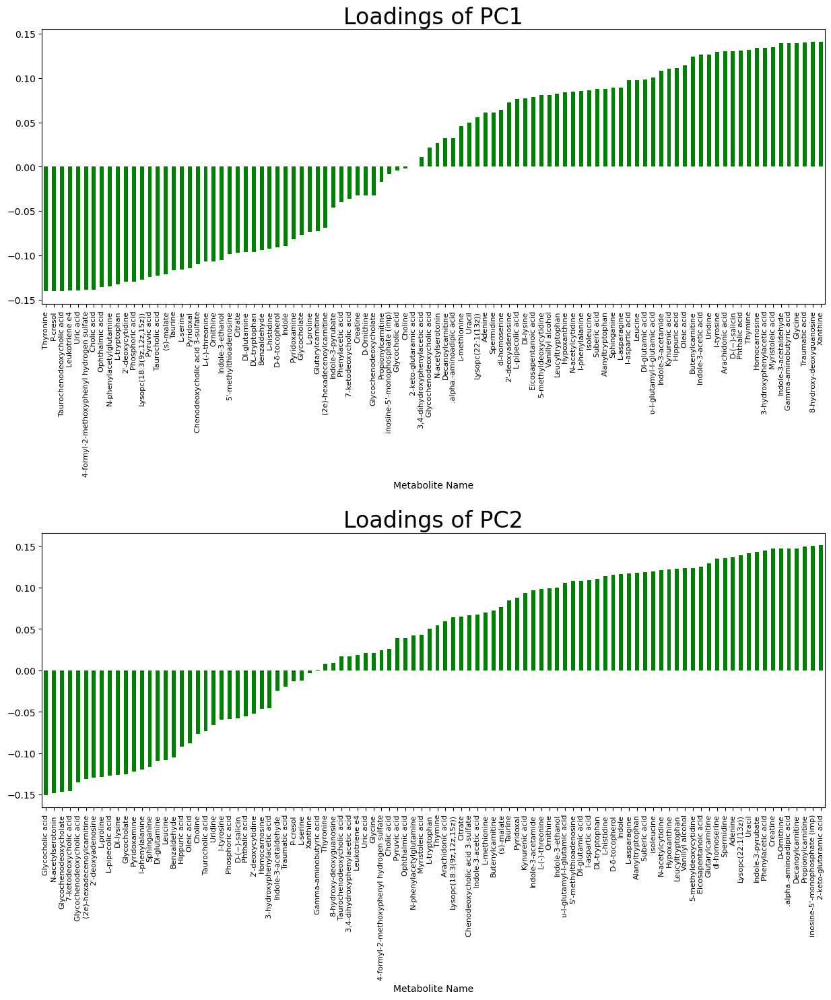

In [49]:
fig = plt.figure(figsize=(15, 15))
gs = fig.add_gridspec(3, 1, height_ratios=[2,1,2]) 

# Left plot
left_grid = fig.add_subplot(gs[0])
left_grid = loadings_df['PC1'].sort_values().plot(kind='bar', color='green')
left_grid.set_title('Loadings of PC1', fontsize=24)

# Make x-axis label font smaller
left_grid.set_xticklabels(left_grid.get_xticklabels(), fontsize=8)

# Right plot
right_grid = fig.add_subplot(gs[2])
right_grid = loadings_df['PC2'].sort_values().plot(kind='bar', color='green')
right_grid.set_title('Loadings of PC2', fontsize=24)

# Make x-axis label font smaller
right_grid.set_xticklabels(right_grid.get_xticklabels(), fontsize=8)


# plt.subplots_adjust(wspace=30) 
plt.show()


In [50]:
# For each PC, select the loadings that contribute 10% or more to that PC
# This threshold can be adjusted depending on the research question or further insights 

PC1_high_contrib = loadings_df['PC1'][loadings_df['PC1'].abs() >= 0.10]
PC2_high_contrib = loadings_df['PC2'][loadings_df['PC2'].abs() >= 0.10]

In [51]:
# Save these higly-contributing PCA loadings as an excel file with 2 separate sheets.
with pd.ExcelWriter("Metabolomics/Metabolomics Documents/Strong Contributors to PC1 and PC2.xlsx") as writer:
    PC1_high_contrib.to_excel(writer, sheet_name="PC1_High_Contrib")
    PC2_high_contrib.to_excel(writer, sheet_name="PC2_High_Contrib")

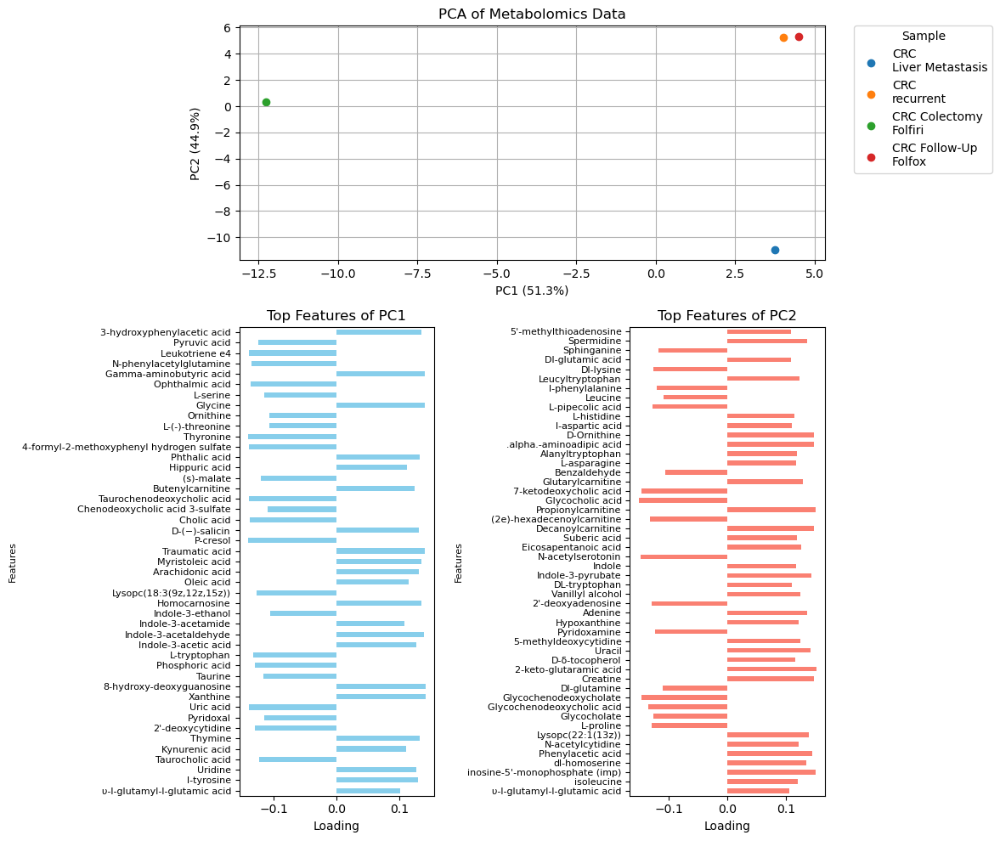

In [60]:
# Plot the PCA and most contributing loadings to PC1 and PC2:

# Divide the plot into two rows and two columns, the lower row should be twice as long.
fig = plt.figure(figsize=(12, 10))
gs = fig.add_gridspec(2, 2, height_ratios=[1, 2])

# PCA scatter plot spans top row, both columns
ax_pca = fig.add_subplot(gs[0, :])
for group, subset in pc_df.groupby(pc_df.index.astype(str)):
    ax_pca.scatter(subset['PC1'], subset['PC2'], label=group)
ax_pca.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
ax_pca.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
ax_pca.set_title('PCA of Metabolomics Data')
ax_pca.legend(title='Sample', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
ax_pca.grid()

# PC1 loadings bar plot on bottom-left
ax_pc1 = fig.add_subplot(gs[1:, 0])
loadings_df.loc[PC1_high_contrib.index, 'PC1'].plot(kind='barh', ax=ax_pc1, color='skyblue')
ax_pc1.set_title('Top Features of PC1')
ax_pc1.set_xlabel('Loading')
ax_pc1.invert_yaxis()  # highest on top
ax_pc1.set_ylabel("Features", fontsize=8)  # Lower font size for y-axis label
ax_pc1.tick_params(axis='y', labelsize=8)  # Lower font size for y-axis tick labels

# PC2 loadings bar plot on bottom-right
ax_pc2 = fig.add_subplot(gs[1:, 1])
loadings_df.loc[PC2_high_contrib.index, 'PC2'].plot(kind='barh', ax=ax_pc2, color='salmon')
ax_pc2.set_title('Top Features of PC2')
ax_pc2.set_xlabel('Loading')
ax_pc2.invert_yaxis()
ax_pc2.set_ylabel("Features", fontsize=8)  # Lower font size for y-axis label
ax_pc2.tick_params(axis='y', labelsize=8)  # Lower font size for y-axis tick labels

plt.tight_layout()

# Save the figure as an image file (PNG, JPG, PDF, etc.)
# plt.savefig('PCA_with_HighContributors.png', dpi=300, bbox_inches='tight')  

plt.show()


In the PCA, it can be observed that 
1) PC1 may explain metabolic differences of the patient with Colectomy and Folfiri treatment from others.
2) PC2 may explain metabolic differences of the patient with liver metastasis from  others.

Thus the PC1, indicating the differences of the patient with colectom and Folfiri treatment show
Increased:

1) Uric acid (7,9-dihydro-1H-purine-2,6,8(3H)-trione) is a product of the metabolic breakdown of purine nucleotides.
2) Ophthalmic acid
3) Glycine + ursunodeoxycholic acid conjugate
4) L-thyroxine is a tyrioid hormone involved in metabolic rate regulation.
5) L-ornithinine, non-proteogenic alpha-amino acid involved in urea cycle. L-ornithine dietary supplementation is linked to increasing levels of human growth hormone (HGH), muscle mass, and strength.

(Rapid tumor breakdown during treatment (especially with bulky tumors) can release purines from cancer cells).

And Depleted:

1) Salicin is a plant derived compounds used in medicine like aspirin (acetylsalicylic acid).
2) Arachidonic acid is a key inflammatory intermediate and can also act as a vasodilator.

### 3.2.2) Heatmap Visualization of Metabolic Differences

As principle component 1 seems to explain 51% of the differences in metabolite compositions and separates the profile of patient treated with coelctomy and folfiri from others, a heatmap can visualize the main metabolic differences after this treatment in a qualitative way.

Similarly, princple component 2 explains 45% of metabolic differences and separates the patient with liver metastasis from others, possibly demonstrating which metabolites can indicate liver metastasis.

#### 3.2.2.a) Heatmap for PC1

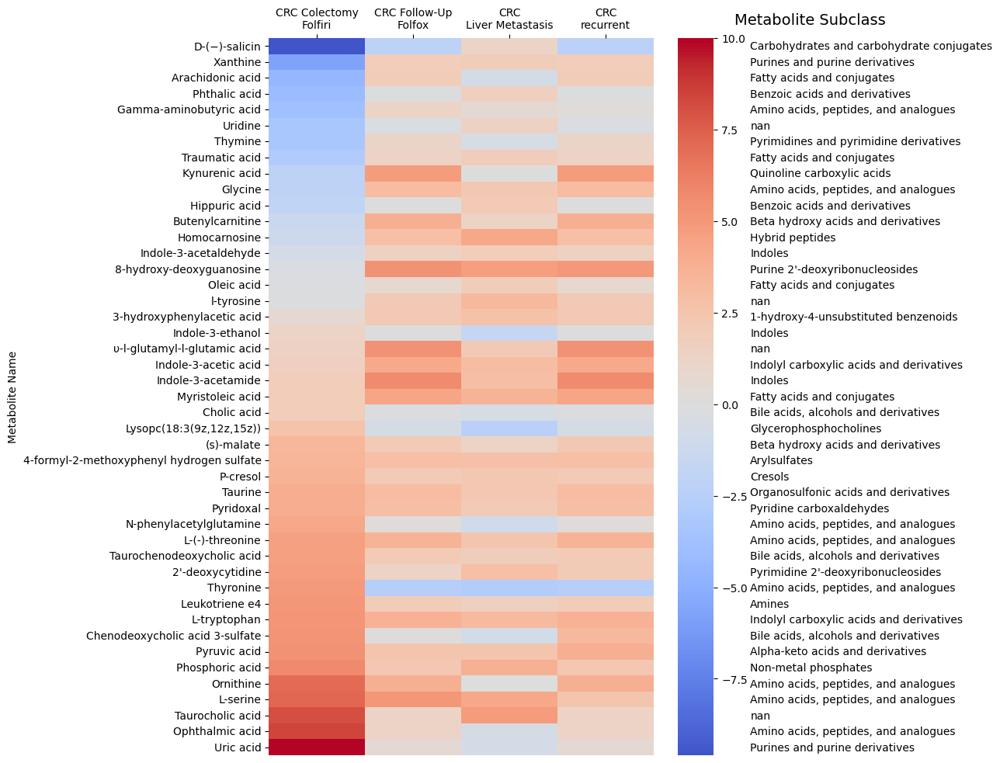

In [28]:
# With a heatmap of PC1, we will try to visualize:
# the main metabolic differences of the patient treated with colectomy and Folfiri.

PCA1_top_loadings = pd.read_excel("Metabolomics/Metabolomics Documents/Strong Contributors to PC1 and PC2.xlsx", sheet_name= "PC1_High_Contrib" )

df_heatmap_PC1 = metab_df[metab_df["Metabolite Name"].isin(PCA1_top_loadings["Metabolite Name"].tolist())]

df_heatmap_PC1 = df_heatmap_PC1.sort_values(by="CRC Colectomy\nFolfiri")
df_heatmap_PC1 = df_heatmap_PC1.set_index("Metabolite Name")

fig = plt.figure(figsize=(10, 12))
gs = fig.add_gridspec(1, 2, width_ratios=[4, 1], wspace=0)
df_annotations = df_heatmap_PC1["Subclass"]

hm = fig.add_subplot(gs[0])
hm = sns.heatmap(df_heatmap_PC1.iloc[:,4:8].clip(lower=-10, upper=10), cmap='coolwarm', center=0, ax=hm, cbar=True)
hm.xaxis.tick_top()

# Annotation panel on the right
ax_annot = fig.add_subplot(gs[1])
ax_annot.axis('off')  # Hide axes for cleaner look
ax_annot.set_title("Metabolite Subclass", fontsize=14, loc='center',  y=1.01)  

# Add annotation text aligned with heatmap rows
for y, annotation in enumerate(df_annotations):
    ax_annot.text(0, y + 0.5, str(annotation), va='center', fontsize=10)

ax_annot.set_ylim(df_heatmap_PC1.shape[0], 0)  # Invert y-axis to align with heatmap

plt.show()


Different concentrations of some metabolites <span style="color:red">in colectomy plus folfiri-treated patient </span> can be directly observed from the heatmap:

Such as 
- <span style="color:red">increased uric acid</span> , a breakdown product of purines
- <span style="color:red">increased ophthalmic acid</span> ,involved in glutathione regulation
- <span style="color:red">increased taurocholic acid</span> ,a bile acid involved in emulsification of fats

  
Or
- <span style="color:red">depleted salicin</span>, a plant compound not expected in human feces
- <span style="color:red">depleted xanthine</span>, the precursor of <span style="color:red">uric acid arachidonic acid</span>  <span style="color:red">
- <span style="color:red">depleted arachidonic acid</span>, a precursor to various signaling molecules essential for both initiating and resolving inflammation and immune cell activity.

To better understand the interactive metabolic role of these compounds, we will use enrichment and pathway analyses.


#### 3.2.2.b) Heatmap for PC2

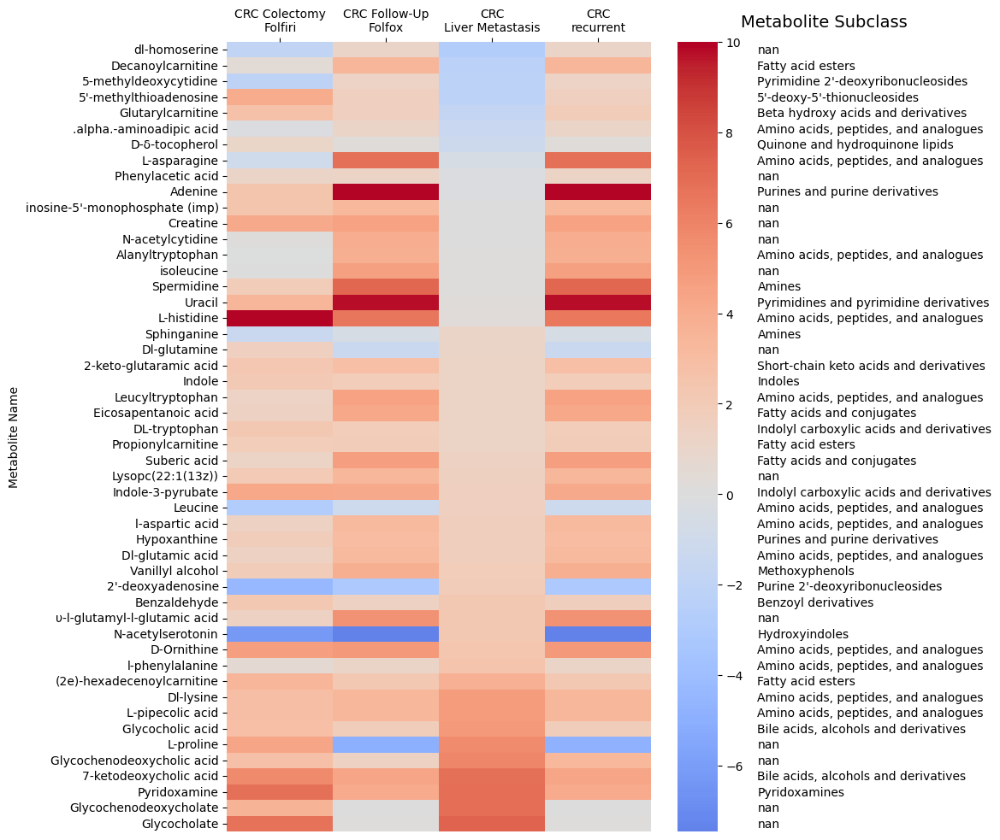

In [29]:
# With a heatmap of PC2, we will try to visualize
# the main metabolic differences of liver metastatic patient.

PCA1_top_loadings = pd.read_excel("Metabolomics/Metabolomics Documents/Strong Contributors to PC1 and PC2.xlsx", sheet_name= "PC2_High_Contrib" )

df_heatmap_PC2 = metab_df[metab_df["Metabolite Name"].isin(PCA1_top_loadings["Metabolite Name"].tolist())]

df_heatmap_PC2 = df_heatmap_PC2.sort_values(by="CRC\nLiver Metastasis")
df_heatmap_PC2 = df_heatmap_PC2.set_index("Metabolite Name")

fig = plt.figure(figsize=(10, 12))
gs = fig.add_gridspec(1, 2, width_ratios=[4, 1], wspace=0)
df_annotations = df_heatmap_PC2["Subclass"]

hm = fig.add_subplot(gs[0])
hm = sns.heatmap(df_heatmap_PC2.iloc[:,4:8].clip(lower=-10, upper=10), cmap='coolwarm', center=0, ax=hm, cbar=True)
hm.xaxis.tick_top()

# Annotation panel on the right
ax_annot = fig.add_subplot(gs[1])
ax_annot.axis('off')  # Hide axes for cleaner look
ax_annot.set_title("Metabolite Subclass", fontsize=14, loc='center',  y=1.01) 

# Add annotation text aligned with heatmap rows
for y, annotation in enumerate(df_annotations):
    ax_annot.text(0, y + 0.5, str(annotation), va='center', fontsize=10)

ax_annot.set_ylim(df_heatmap_PC2.shape[0], 0)  # Invert y-axis to align with heatmap

plt.show()


It can be observed that adenine, uracil, L-asparagine and L-histidine are depleted in the metastatic patient, yet have a high presence in other CRC patients. 

On the other hand, L-proline, N-acetylsetotonin, 2'-deoxyadenosine and L-leucine are enhanced in this patient compared to other CRC patients with depleted profiles.

In the next step, the metabolites contributing more than 10% to the PC1 and PC2 will be used in enrichment and pathway analyses to see which metabolic mechanism can be overly active in these patients.

## 3.3) Enrichment and Functional Analyses

In [30]:
# Add the KEGG and CHEBI IDs to PCA loadings data frame

# First, PC1
PC1_high_contrib = loadings_df.loc[loadings_df['PC1'].abs() >= 0.10, ['PC1']]
PC1_high_contrib['CHEBI.ID'] = None
PC1_high_contrib['KEGG.ID'] = None

# Loop through each index (assumed to be metabolite names)
for metab_name in PC1_high_contrib.index:
    # Find matching row in metab_df
    match = metab_df[metab_df["Metabolite Name"] == metab_name]
    
    # If a match is found, extract and assign the IDs
    if not match.empty:
        PC1_high_contrib.loc[metab_name, 'CHEBI.ID'] =  int(match['CHEBI.ID'].values[0])
        PC1_high_contrib.loc[metab_name, 'KEGG.ID']  =  match['KEGG.ID'].values[0]
# print(PC1_high_contrib)

In [31]:
# Then, PC2

PC2_high_contrib = loadings_df.loc[loadings_df['PC2'].abs() >= 0.10, ['PC2']]
PC2_high_contrib['CHEBI.ID'] = None
PC2_high_contrib['KEGG.ID'] = None

# Loop through each index (assumed to be metabolite names)
for metab_name in PC2_high_contrib.index:
    # Find matching row in metab_df
    match = metab_df[metab_df["Metabolite Name"] == metab_name]
    
    # If a match is found, extract and assign the IDs
    if not match.empty:
        PC2_high_contrib.loc[metab_name, 'CHEBI.ID'] = int(match['CHEBI.ID'].values[0])
        PC2_high_contrib.loc[metab_name, 'KEGG.ID']  = match['KEGG.ID'].values[0]
# print(PC2_high_contrib)

In [32]:
type(PC1_high_contrib["CHEBI.ID"].iloc[5])

int

### 3.3.1) Reactome: Enrichment Analysis

### Pathway Enrichment Analysis & Mapping to Human Pathways
##### (https://reactome.org/PathwayBrowser/#TOOL=AT)

In [33]:
# For entichment analysis of PC1 with Reactome;copy the output below without brackets 
# and enter the copied output at https://reactome.org/PathwayBrowser/#TOOL=AT, 
# click on "Continue", select "Project o Human" and "Include Interactions", then click "Analyse!"

# PC1_high_contrib["CHEBI.ID"].tolist()

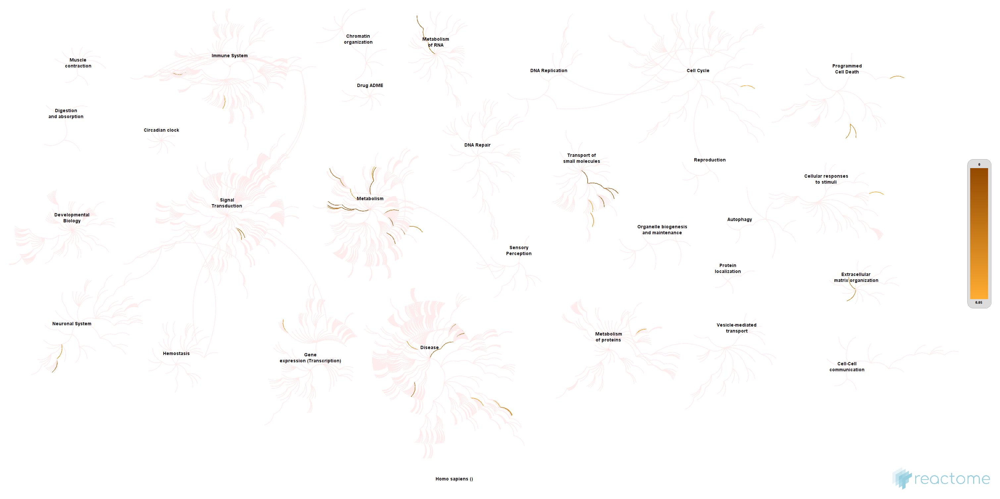

In [34]:
# Enrichment Analysis of PC1 metabolites using Reactome with  human database: 
Image("Metabolomics/Metabolomics Documents/Reactome_PC1.jpg")

The darkest visualized pathways (with highest probability) correspond to:
- Metabolism (purine and pyrimidine salvage, gluconeogenesis, tyroid activity, sulfur amino acid metabolism
- Metabolism of RNA (synthesis of wybutosine at G37 of tRNA)
- Transport of small molecules (organic anion transport)
- DNA repair (cleavage of damaged myrimidine)
- Disease (2-LTR circle formation, IRAK4 deficiency, defective ABCB11 causes PFIC2 and BRIC2, SLC transporter disorders)
- Neuronal system (Tandem of pore domain in a weak inwardly rectifying K+ channels(TWIK))
- Programmed cell death (inhibited CASP8 activity)

#### Given the relation observed in the previous steps between PC1 and separation of colorectomy+folfiri treated patient from the others,
#### There is a possible indication that these pathways are affected by folfiri treatment, however the implications are very broad.

<p style="color:red;">
Some possible insight:  <br> 
    1) 2-LTR circle formation: unintegrated viral DNA can be present in the patient OR in their microbiome<br>
    2) IRAK4 deficiency: Some patients may show increased susceptibility to invasive bacterial infections, <br>
    particularly those caused by Streptococcus pneumoniae and Staphylococcus aureus. <br>
    3) Defective ABCB11 causes PFIC2 and BRIC2: bile formation and flow might be impaired. <br>
    4) SLC transporter disorders: SLC transporters, such as glucose transporters (GLUTs) might be overexpressed.<br>
    5) Inhibited CASP8 activity: Defective cells are not eliminated automatically and likely cause tumors.<br>
<br>
Considering that these enriched metabolites are differentially present between two groups of patients (first group as colerectomy+folfiri treatment and other group all 3 patients), these findings are interesting as they might indicate one group has lesser cancerous pathways. Nevertheless, it can also indicate that these two groups have different cancerous pathways. It must be observed for each pathway, which metabolites were mapped and whether those metabolites were over- or underrepresented in two seprate groups.
</p>  


In [35]:
# For entichment analysis of PC2 with Reactome;copy the output below without brackets 
# and enter the copied output at https://reactome.org/PathwayBrowser/#TOOL=AT, 
# click on "Continue", select "Project o Human" and "Include Interactions", then click "Analyse!"

# PC2_high_contrib["CHEBI.ID"].tolist()

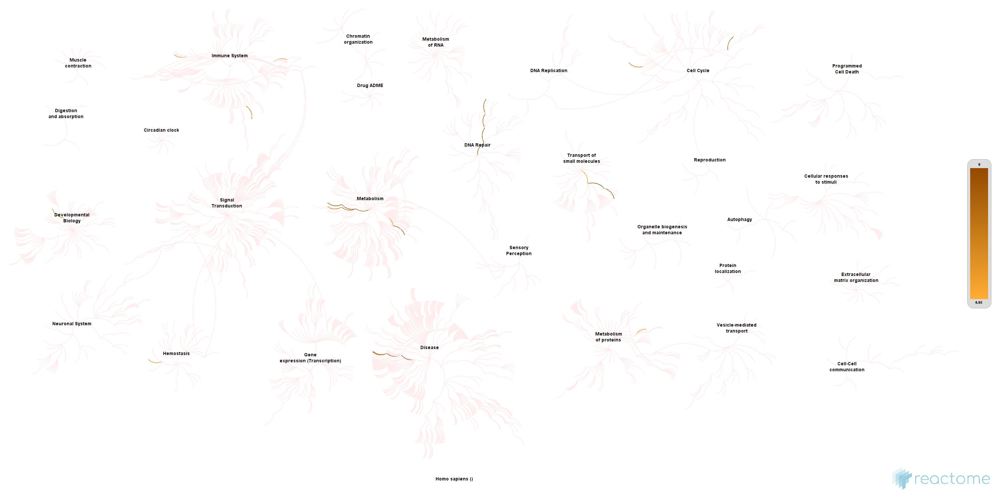

In [36]:
# Enrichment Analysis of PC1 metabolites using Reactome with  human database: 
Image("Metabolomics/Metabolomics Documents/Reactome_PC2.jpg")

The darkest visualized pathways (with highes probability) correspond to:
- Disease (Nucleotide salvage defects: defective HPRT1, defective APRT, ADA)
- Transport of small molecules (transport of purines and pyrimidines across plasma membrane)
- DNA repair(cleavage of damaged purines)
- Metabolism (Methionine salvage pathway, purine salvage, purine catabolism)

#### Given the relation observed in the previous steps between PC2 and separation of liver metastasis patient from the others,
#### There is a possible indication that these pathways are related to metastasis or liver malfunction, however the implications are very broad.

<p style="color:red;">
Some possible insight:  <br> 
     1) Deficiency in the enzyme hypoxanthine-guanine phosphoribosyltransferase:  <br> 
&emsp;     deficiency in the enzyme hypoxanthine-guanine phosphoribosyltransferase, possibly causing elevated urea and mitochondrial damage.  <br> 
    2) Defective APRT: Adenine Phosphoribosyltransferase (APRT) deficiency: causes adenine accumulation.  <br> 
    3) Defective ADA: adenosine deaminase (ADA) helps break down a toxic substance called deoxyadenosine.  <br> 
       &emsp;  ADA deficiency severely impairs the immune system, often resulting in severe combined immunodeficiency (SCID). <br> 
 <br> 
Implications of these conditions for PC2, likely related to metastasis is that ADA deficiency might supress the immune system from eliminating mobilized cancer cells. This might be related to elevated adenine and urea levels.
</p>  


# 3.2) MetaboAnalyst: Enrichment Analysis 
##### (https://dev.metaboanalyst.ca/MetaboAnalyst/upload/EnrichUploadView.xhtml)

###### 1) Go to the link: https://dev.metaboanalyst.ca/MetaboAnalyst/upload/EnrichUploadView.xhtml
###### 2) Enter the content of either PCA1_loadings_list or PCA2_loadings_list
###### 3) Selec the input type "ChEBI ID" and Feature type ""Metabolites"
###### 4) Click "Submit"
###### 5) Some ChEBI IDs are not recognized, because MetaboAnalyst works with KEGG pathway database and these metabolites are not registered there.
###### 6) Click "Proceed"
###### 7) Select a metabolite set library. 
######   Then, different options will be tested. 
######   Thus, the above steps will be repeated for each of the following.
######   7a. For PC1: 
######                   7a.1) once "Pathway based" for KEGG human metabolic pathways set and
######                   7a.2) once with "Disease signatures" using "Feces" metabolite set

######   7b. For PC2:
######                   7b.1) once "Pathway based" for KEGG human metabolic pathways set and
######                   7b.2) once with "Disease signatures" using "Feces" metabolite set

### a.1) MetaboAnalyst Enrichment Analysis for PC1 using KEGG human metabolic pathways set

###### Remember: In PCA Analysis, PC1 separated the Colorectomy + Folfiri Treatment from the other 3 patients.
###### The difference in metabolic composition may indicate an altered colon function due to colorectomy or a change due to Folfiri treatment.
###### Please mind that folfiri is a highly toxic agent and changes might have other indications related to toxicity than a successful treatment


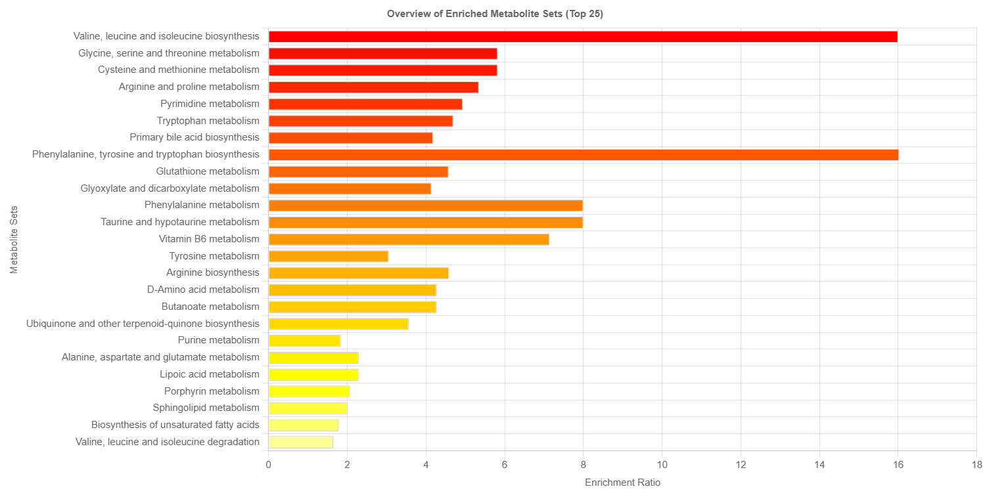
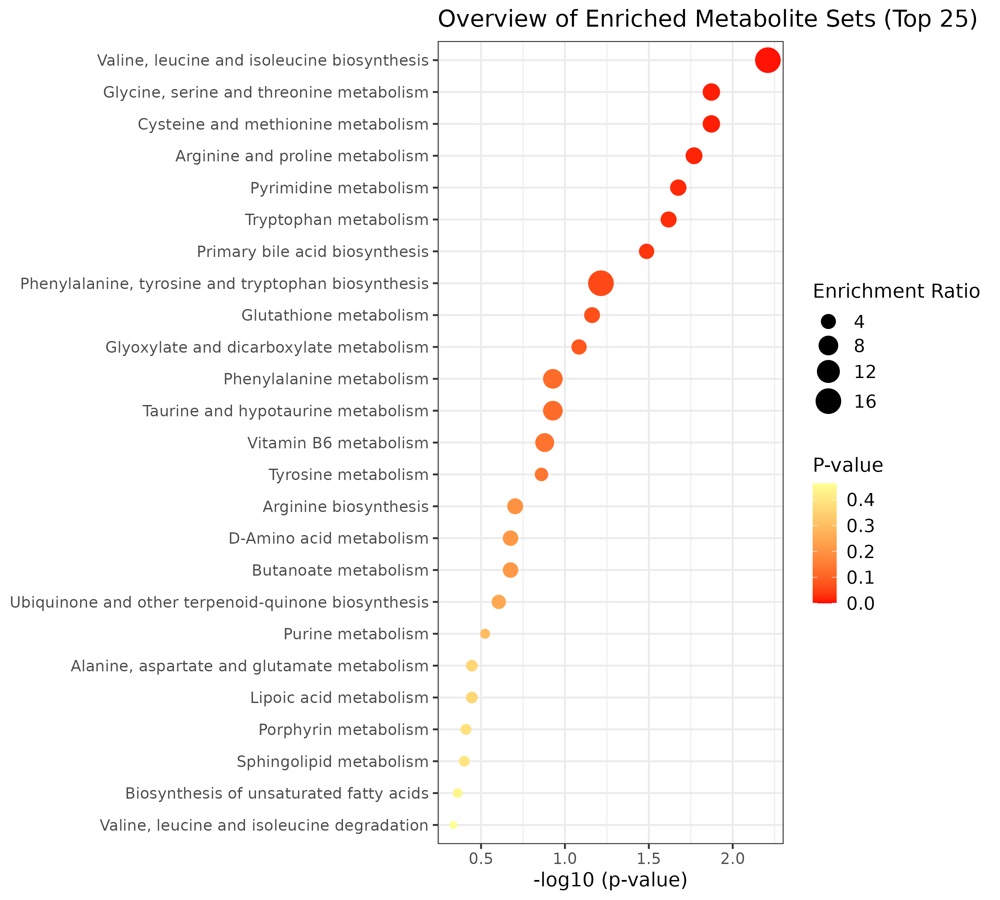

In [37]:
# # Enrichment Analysis of PC1 metabolites using MetaboAnalyst, with KEGG human database: 
img1_path = "Metabolomics/Metabolomics Documents/Enrichment Analysis of PC1 Metabolites.png"
img2_path = "Metabolomics/Metabolomics Documents/PC1_MetaboAnalyst_KEGG_human.png"

def img_to_base64(path):
    with open(path, "rb") as f:
        data = f.read()
    return base64.b64encode(data).decode()

img1_base64 = img_to_base64(img1_path)
img2_base64 = img_to_base64(img2_path)

html = f"""
<div style="display: flex; align-items: center; gap: 10px;">
  <img src="data:image/png;base64,{img1_base64}" style="height: 450px; width: auto; flex: 3;">
  <img src="data:image/png;base64,{img2_base64}" style="height: 450px; width: auto; flex: 1;">
</div>
"""

display(HTML(html))

Mapping of highest-contributing PC1 loadings to **human** metabolism demonstrate that the major differences in 
 **colerectormy+folfiri-treated patient to other patients** are:
- **amino acid**
- **bile acid**
- **nucleic acid**
metabolisms.


It must be noted that the <span style="color:red"> p values below 5% correspond to amino acid and pyrimidine metabolism.

### a.2) MetaboAnalyst Enrichment Analysis for PC1 using Disease Signatures from Feces Metabolite Set

###### Remember: In PCA Analysis, PC1 separated the Colorectomy + Folfiri Treatment from the other 3 patients.
###### The difference in metabolic composition may indicate an altered colon function due to colorectomy or a change due to Folfiri treatment.
###### Please mind that folfiri is a highly toxic agent and changes might have other indications related to toxicity than a successful treatment

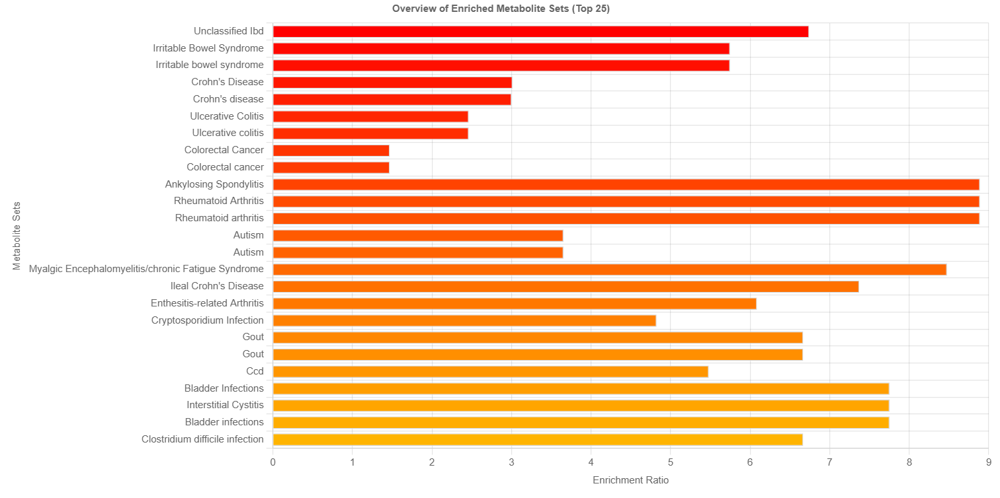

In [38]:
# Enrichment Analysis of PC1 metabolites using MetaboAnalyst, with Fecal Disease Metabolites database: 
Image("Metabolomics/Metabolomics Documents/Enrichment Analysis of PC1 Metabolites for fecal disease biomarkers.png")

### b.1) MetaboAnalyst Enrichment Analysis for PC2 using KEGG Human Metabolic Pathways Set

###### In PCA Analysis, PC2 separated the liver metastasis patient from the other 3 patients.
###### The difference in metabolic composition may indicate metabolic biomarkers of metastasis


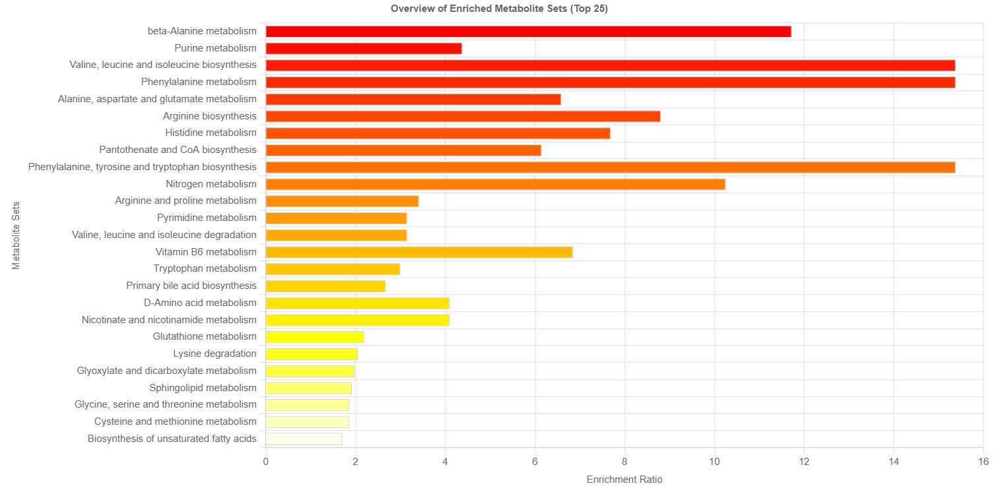
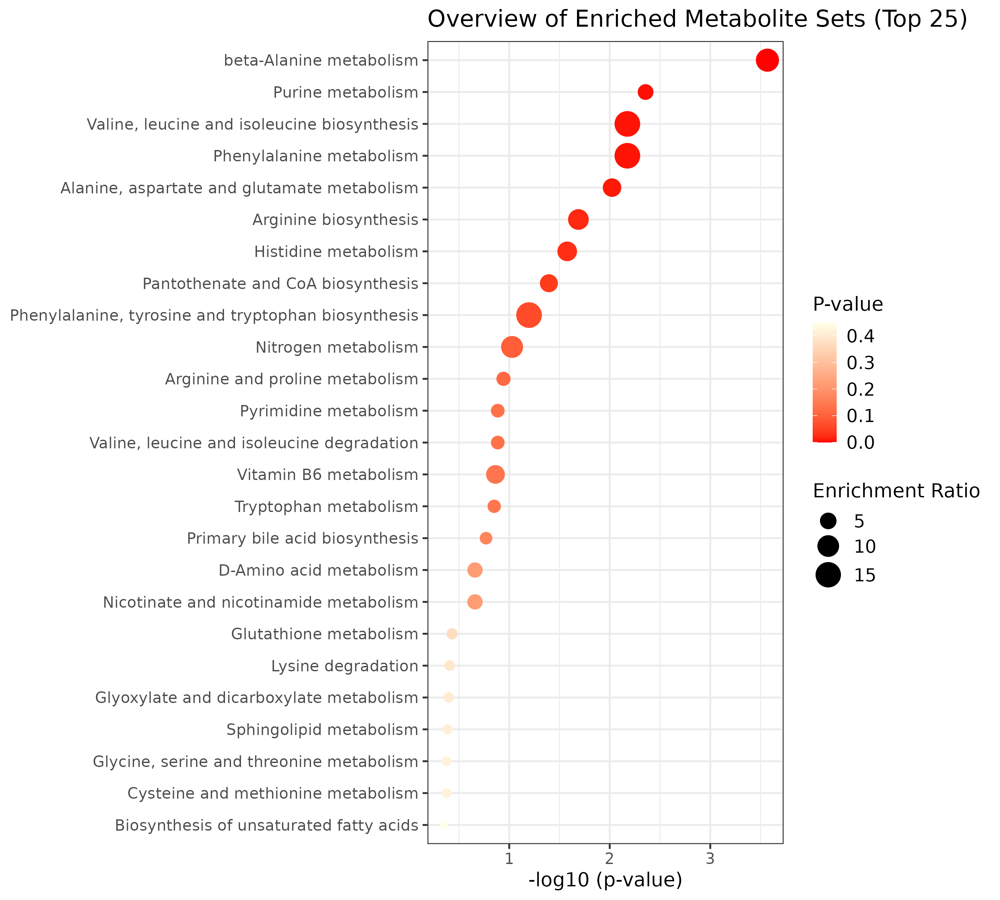

In [39]:
# # Enrichment Analysis of PC2 metabolites using MetaboAnalyst, with KEGG human database: 
# Image("Metabolomics/Metabolomics - 20.06.25/Enrichment Analysis of PC2 Metabolites.png")

# # Enrichment Analysis of PC1 metabolites using MetaboAnalyst, with KEGG human database: 
img1_path2 = "Metabolomics/Metabolomics Documents/Enrichment Analysis of PC2 Metabolites.png"
img2_path2 = "Metabolomics/Metabolomics Documents/PC2_MetaboAnalyst_KEGG_human.png"

def img_to_base64(path):
    with open(path, "rb") as f:
        data = f.read()
    return base64.b64encode(data).decode()

img1_base64 = img_to_base64(img1_path2)
img2_base64 = img_to_base64(img2_path2)

html = f"""
<div style="display: flex; align-items: center; gap: 10px;">
  <img src="data:image/png;base64,{img1_base64}" style="height: 600px; width: auto; flex: 3;">
  <img src="data:image/png;base64,{img2_base64}" style="height: 600px; width: auto; flex: 1;">
</div>
"""

display(HTML(html))

<p style="color:red;">
1) Beta-alanine is a beta-amino acid and is used in the synthesis of carnosine, anserine and vitamine B5. <br>
&emsp; Generally, beta-alanine is found in low cellular concentrations and is the rate-limiting compound in carnosine production, <br>
&emsp; even though it can be stored in high concentrations as dipeptides that dont incorporate into peptides.<br>
&emsp; Carnosine has antioxidant and antiglycant properties and acts as an anti-aging molecule, which can improve cell life<br>
<br>
2) Panthothenate (Vitamin B5) and CoA are necessary for high energy metabolism<br>
</p>

### b.2) MetaboAnalyst Enrichment Analysis for PC2 using Disease Signatures from Feces Metabolite Set

##### In PCA Analysis, PC2 separated the liver metastasis patient from the other 3 patients.
##### The difference in metabolic composition may indicate metabolic biomarkers of metastasis

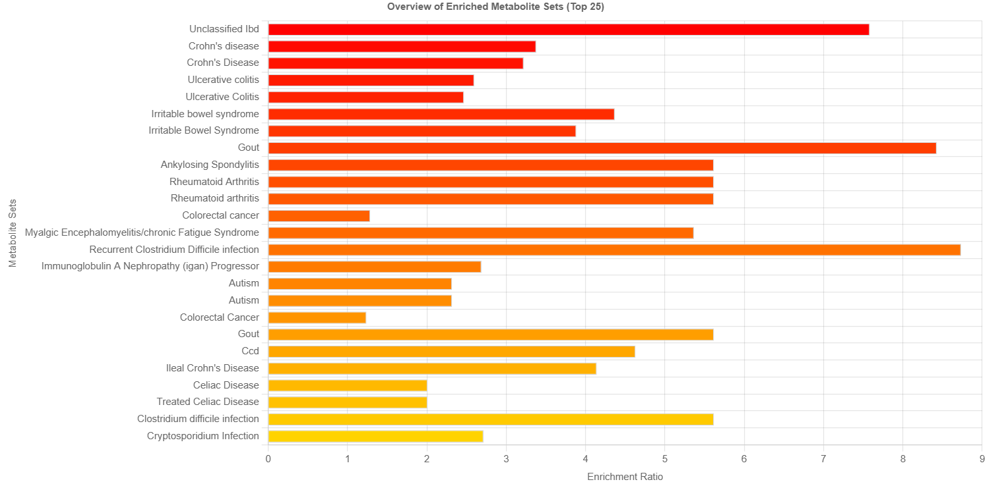

In [40]:
# Enrichment Analysis of PC2 metabolites using MetaboAnalyst, with Fecal Disease Metabolites database: 
Image("Metabolomics/Metabolomics Documents/Enrichment Analysis of PC2 Metabolites for fecal disease biomarkers.png")

###### Clostridium difficile might be present

# 3.3) MetaboAnalyst: Pathway Analysis
##### (https://dev.metaboanalyst.ca/MetaboAnalyst/upload/EnrichUploadView.xhtml)

In [41]:
PCA1_loadings_KEGG = list(PC1_high_contrib["KEGG.ID"])
PCA2_loadings_KEGG = list(PC2_high_contrib["KEGG.ID"])

#### For pathway analysis:

###### 1) Go to the link: https://www.metaboanalyst.ca/MetaboAnalyst/upload/PathUploadView.xhtml
###### 2) In the "Compund List" section, enter the output of PCA1_loadings_KEGG without brackets. (see below)
###### 3) Selec the input type "KEGG ID".
###### 4) Click "Submit"
###### 5) Some KEGG IDs are not recognized, because they were not avialable and and CHEBI IDs were filled as place holders. Ignore these.
###### 6) Click "Proceed"
###### 7) Specify Pathway analysis parameters:
######            - Visualization method: Scatter Plot
######      - Enrichment method: Hypergeometric test
######      - Topology measure: Relative-betweeness Centrality
######      - Reference metabolome: Use all compounds in the selected pathway library
###### 8) Select a pathway library: Homo sapiens (KEGG)
###### 9) Click to "Proceed:"
###### 10) Then select "Enrichment Network" below the displayed graph of Överview of Pathway Analysis"
###### 11) Change the Layout to "Force Atlas"

######
###### Repeat this later for PC2 using PCA2_loadings_KEGG

### 3.3.1) Mapping of PC1 Metabolites to **Human Metabolome** in MetaboAnalyst
#### (PC1 indicates the Separation of Colectomy + Folfiri treated patient from others) 

In [42]:
# # For PC1, select the output of the following code:
# for KEGG_ID in PCA1_loadings_KEGG:
#     print (KEGG_ID)

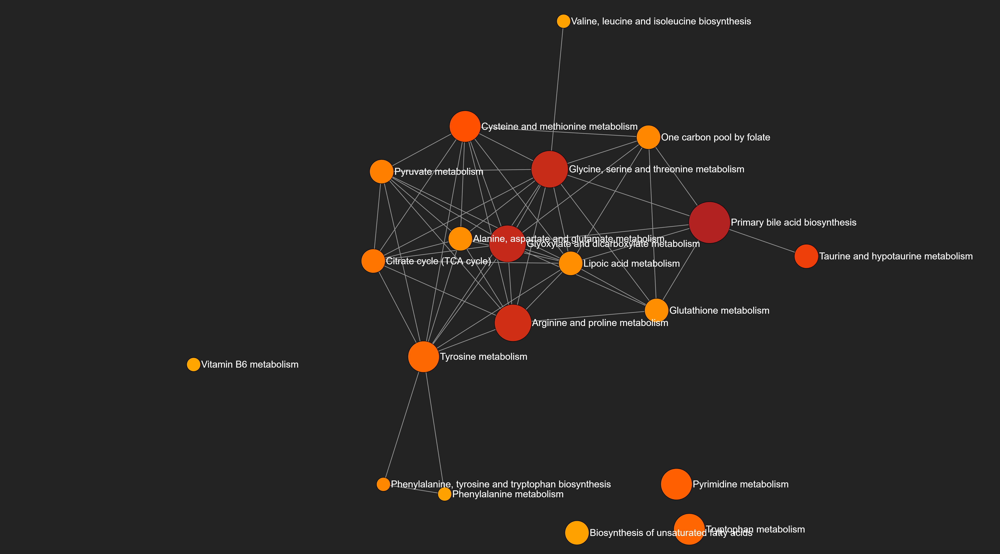

In [43]:
Image("Metabolomics/Metabolomics Documents/Pathway Mapping to Humans - PC1.png", width = 1200)

### 3.3.2) Mapping of PC2 Metabolites to **Human Metabolome** in MetaboAnalyst
#### (PC2 indicates the Separation of Liver Metastasis patient from others) 

In [44]:
# # For PC2, select the output of the following code
# for KEGG_ID in PCA2_loadings_KEGG:
#     print (KEGG_ID)

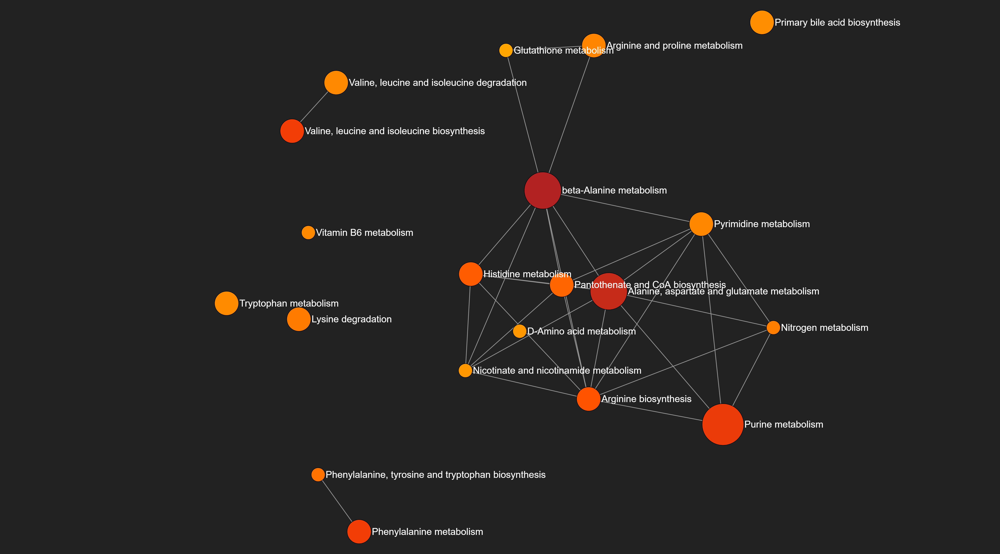

In [45]:
Image("Metabolomics/Metabolomics Documents/Pathway Mapping to Humans - PC2.png", width = 1000)

# 3.4) Comperative Literature Analysis


### 3.4.1) Amino Acids
Pathway Mapping to Humans - PC1

#### First Comparison: Yachida et al. (2019)
#### Metagenomic and metabolomic analyses reveal distinct stage-specific phenotypes of the gut microbiota in colorectal cancer

According to Yachida et al. (2019), differential intestinal metabolite presences have been associated with cancerous gut conditions. They observed that the main difference were found in amino acid availability and bacterial metabolites sich as bile acids and short-chain fatty acids. 

###### Yachida, S., Mizutani, S., Shiroma, H. et al. Metagenomic and metabolomic analyses reveal distinct stage-specific phenotypes of the gut microbiota in colorectal cancer. 
###### Nat Med 25, 968–976 (2019). https://doi.org/10.1038/s41591-019-0458-7

In their analysis, they used differetent stages:
- MP: multiple polypoid adenomas with low-grade dysplasia
- S0: intramucosal carcinoma (polypoid adenoma(s) with high-grade dysplasia), stage 0/pTis CRC
- 4 stages of CRC based on the eighth Union for International Cancer Control (UICC) TNM Classification of Malignant Tumors.

The diffenretial prevalance was displayed as follows:

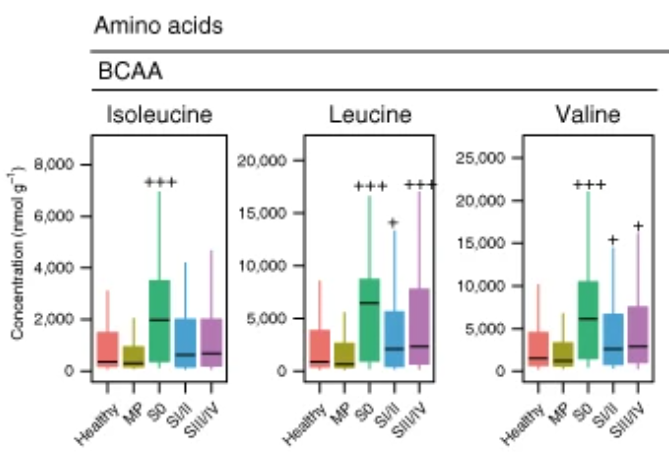

In [46]:
from IPython.display import Image, display, HTML
Image("Metabolomics/Metabolomics Documents/BCAA_in_CRC.png")


In [47]:
print(metab_df["Metabolite Name"].tolist())

['3-hydroxyphenylacetic acid', "5'-methylthioadenosine", 'Pyruvic acid', 'Spermidine', 'Leukotriene e4', 'Sphinganine', 'N-phenylacetylglutamine', 'Dl-glutamic acid', 'Dl-lysine', 'Leucyltryptophan', 'Gamma-aminobutyric acid', 'l-phenylalanine', 'Ophthalmic acid', 'Leucine', 'L-serine', 'L-pipecolic acid', 'L-methionine', 'L-histidine', 'l-aspartic acid', 'Glycine', 'D-Ornithine', 'Ornithine', 'L-(-)-threonine', '.alpha.-aminoadipic acid', 'Thyronine', 'Alanyltryptophan', 'L-asparagine', '4-formyl-2-methoxyphenyl hydrogen sulfate', '3,4-dihydroxyphenylacetic acid', 'Phthalic acid', 'Hippuric acid', 'Benzaldehyde', '(s)-malate', 'Butenylcarnitine', 'Glutarylcarnitine', 'Taurochenodeoxycholic acid', '7-ketodeoxycholic acid', 'Chenodeoxycholic acid 3-sulfate', 'Cholic acid', 'Glycocholic acid', 'D-(−)-salicin', 'P-cresol', 'Propionylcarnitine', '(2e)-hexadecenoylcarnitine', 'Decanoylcarnitine', 'Traumatic acid', 'Suberic acid', 'Eicosapentanoic acid', 'Myristoleic acid', 'Arachidonic acid

In [48]:
names_bcaa = [name for name in metab_df["Metabolite Name"] if "eucine" in name or "aline" in name]
print(names_bcaa)

['Leucine', 'isoleucine']


In [49]:
filtered_df_bcaa = metab_df[metab_df["Metabolite Name"].isin(names_bcaa)]
filtered_df_bcaa = filtered_df_bcaa.set_index('Metabolite Name')
filtered_df_bcaa.head()

,KEGG.ID,Super. Class,class,Subclass,CRC Colectomy\nFolfiri,CRC Follow-Up\nFolfox,CRC\nLiver Metastasis,CRC\nrecurrent,CHEBI.ID
Metabolite Name,,,,,,,,,
Leucine,C00123,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",-2.85,-1.15,1.57,-1.15,15603
isoleucine,C00407,NaN,NaN,NaN,0.08,4.67,0.17,4.67,17191


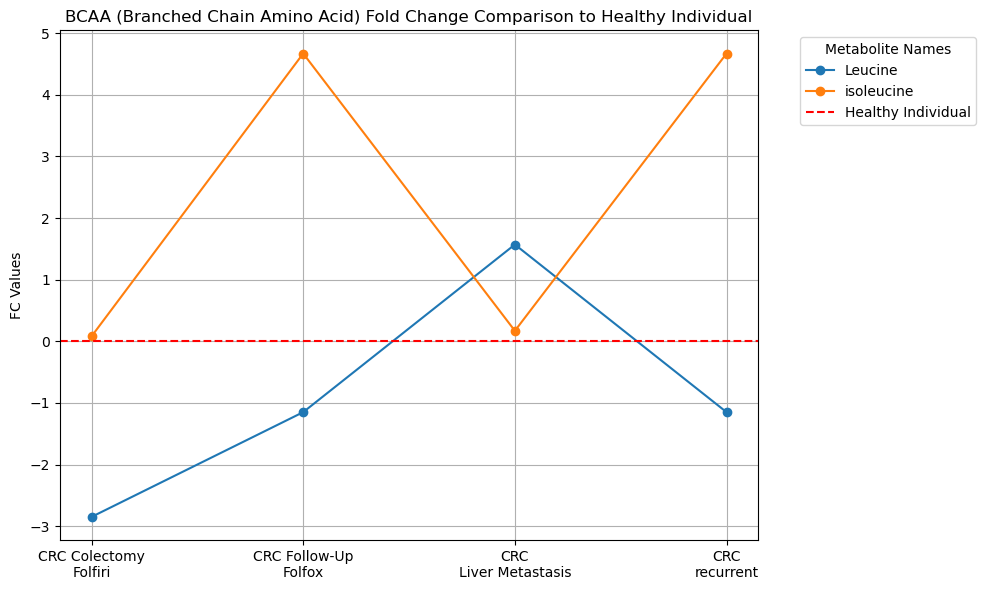

In [50]:
# Step 1: Create a figure for plotting
plt.figure(figsize=(10, 6))

# Step 2: Loop through all rows to plot each one
for i, row_data in filtered_df_bcaa.iterrows():  # Use iterrows() to loop through rows
    # Extract the data from columns 5, 6, 7, 8 
    row_values = row_data[4:8]  # Select the columns 5, 6, 7, 8 for this row
    metabolite_name = row_data.name  # Get the index (metabolite name)
    
    # Plot the data for this row
    plt.plot(row_values.index, row_values.values, marker='o', label=metabolite_name)

# Step 3: Customize the plot
# plt.xlabel('Different CRC Patients')
plt.axhline(y=0, color='red', linestyle='--', label='Healthy Individual')  # '--' creates a dashed line

plt.ylabel('FC Values')
plt.title('BCAA (Branched Chain Amino Acid) Fold Change Comparison to Healthy Individual')
plt.legend(title='Metabolite Names', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move the legend outside

# Step 4: Show grid and plot
plt.grid(True)
plt.tight_layout()  # Ensures labels and legend don't overlap
plt.show()


#### In the metabolite analysis of Khattab et al.:
##### 1) increased isoleucine concentrations was observed for recurrent and follow up patients, whereas metastatic and folfiri-treated patients had the same levels as the healthy patient.
##### 2) Leucine was depleted in all patients except metastatic patient, compared to the healthy individual.
##### 3) Valine was not among the detected metabolites and was excluded from the analysis.

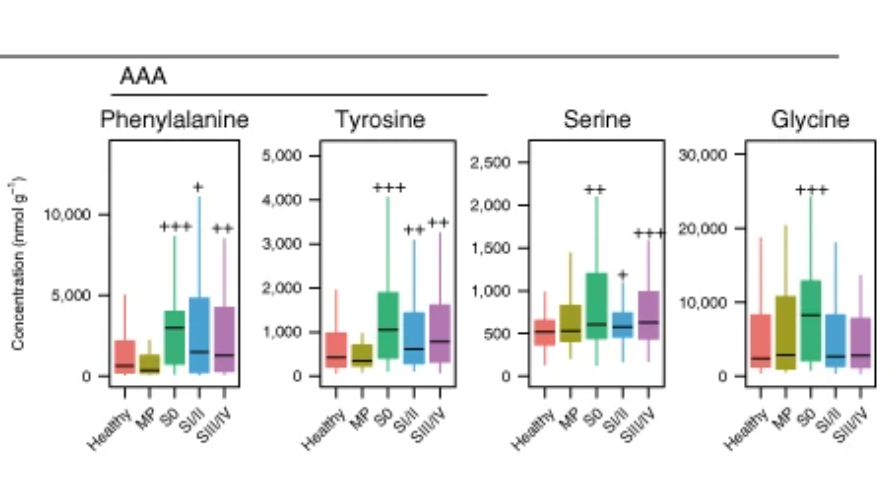

In [51]:
Image("Metabolomics/Metabolomics Documents/AAA_in_CRC.png")

In [60]:
names_aaa = [name for name in metab_df["Metabolite Name"] if "nylalanine" in name or  "yrosin" in name\
            or  "erine" in name or  "lycine" in name]
print(names_aaa)

['l-phenylalanine', 'L-serine', 'Glycine', 'dl-homoserine', 'l-tyrosine']


In [62]:
filtered_df_aaa = metab_df[metab_df["Metabolite Name"].isin(names_aaa)]
filtered_df_aaa = filtered_df_aaa.set_index('Metabolite Name')
filtered_df_aaa.head(10)


,KEGG.ID,Super. Class,class,Subclass,CRC Colectomy\nFolfiri,CRC Follow-Up\nFolfox,CRC\nLiver Metastasis,CRC\nrecurrent,CHEBI.ID
Metabolite Name,,,,,,,,,
l-phenylalanine,C00079,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",0.65,1.20,2.50,1.20,17295
L-serine,C00065,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",7.18,5.06,4.21,2.44,17115
Glycine,C00037,Organic acids and derivatives,Carboxylic acids and derivatives,"Amino acids, peptides, and analogues",-2.12,3.10,2.21,3.10,15428
dl-homoserine,C00263,NaN,NaN,NaN,-1.90,1.15,-2.76,1.15,15699
l-tyrosine,C00082,NaN,NaN,NaN,-0.13,2.13,3.25,2.13,17895


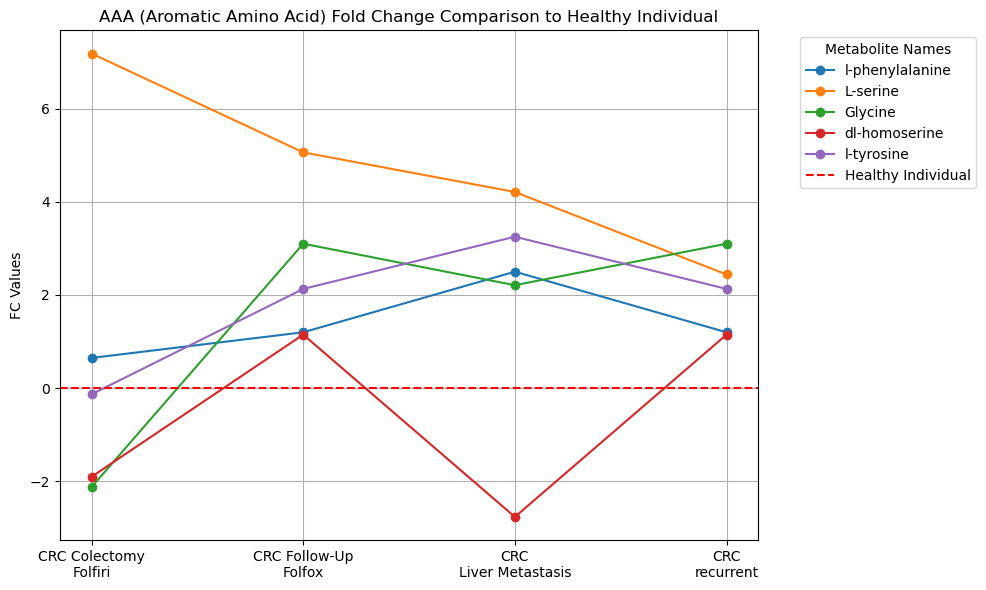

In [63]:
# Step 1: Create a figure for plotting
plt.figure(figsize=(10, 6))

# Step 2: Loop through all rows to plot each one
for i, row_data in filtered_df_aaa.iterrows():  # Use iterrows() to loop through rows
    # Extract the data from columns 5, 6, 7, 8 (indexed as 4 to 7)
    row_values = row_data[4:8]  # Select the columns 5, 6, 7, 8 for this row
    metabolite_name = row_data.name  # Get the index (metabolite name)
    
    # Plot the data for this row
    plt.plot(row_values.index, row_values.values, marker='o', label=metabolite_name)

# Step 3: Customize the plot
# plt.xlabel('Different CRC Patients')
plt.axhline(y=0, color='red', linestyle='--', label='Healthy Individual')  # '--' creates a dashed line

plt.ylabel('FC Values')
plt.title('AAA (Aromatic Amino Acid) Fold Change Comparison to Healthy Individual')
plt.legend(title='Metabolite Names', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move the legend outside

# Step 4: Show grid and plot
plt.grid(True)
plt.tight_layout()  # Ensures labels and legend don't overlap
plt.show()


#### In the metabolite analysis of Khattab et al.:
##### 1) Increased phenylalanine was the most reduced after colectomy+folfiri treatment and most strongly increased in the metastatic patient.
##### 2) Tyrosine levels were similar to the healthy individual after colectomy+folfiri treatment, increased in other patients, with metastatic patient with a strogner foldchange.
##### 3) Contrarily, serine levels were most increased in colectomy+folfiri sample and all other patients displayed between than 2.4 to 5.1 foldchange.
##### 4) In comparison to the other 3 amino acids, glycine levels were not shown to be significantly increased in the above-mentioned article of Yachida et al., yet showed a high increase in the analysis of Khattab et al., except for colectomy+folfiri treated patient.

### 3.4.2) Bile Acids 

### In the intestinals, bile acids from the liver are mixed with the nutrients and are involved in the digestion of fats and vitamins. 
###### Shulpekova et al. (2022) The Role of Bile Acids in the Human Body and in the Development of Diseases. Molecules.
Two major bile acids are cholic acid and chenodeoxycholic acid. Gut microbes convert 

    - Cholic acid to deoxycholic acid (DCA).
    - Chenodeoxycholic acid to lithocholic acid, also knows as 3b-Hydroxy-5-cholenoic acid.

These acids can also be conjugated to glysine or taurine, resulting in

    - Glycocholic acid (Glycocholate)
    - Taurocholic acid (Taurocholate)
    - Glychochenodeoxycholic acid
    - Taurochenodeoxycholic acid

### Previous reseach indicates that increased bile acid concentrations can result in colon cancer through increased DNA damage. 
###### Bernstein and Bernstein (2022). Bile acids as carcinogens in the colon and at other sites in the gastrointestinal system.
###### doi: 10.1177/15353702221131858.

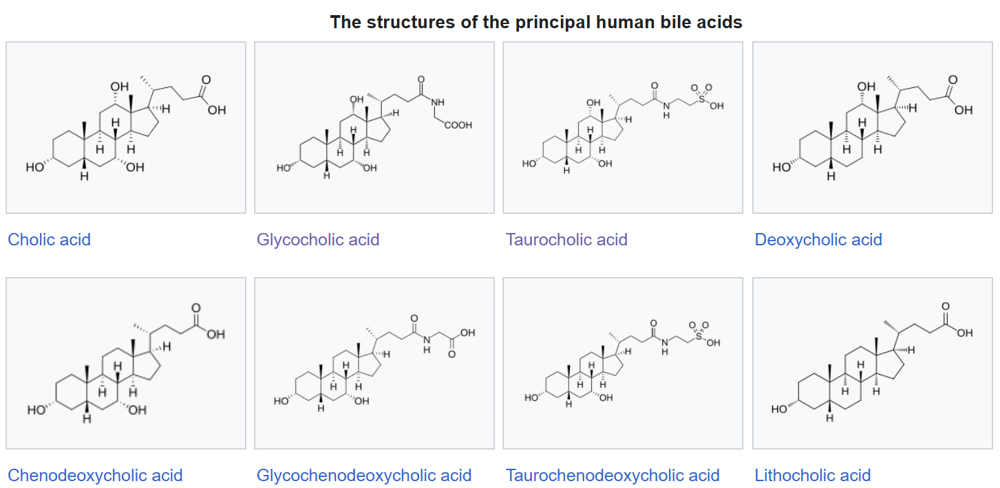

In [54]:
Image("Metabolomics/Metabolomics Documents/Bile_acids_Structure.png",  height = 1000, width = 1000)

#### In Yachida's research, MP and S0 patients were shown to have increased deoxycholate, glycocholate and taurocholate.

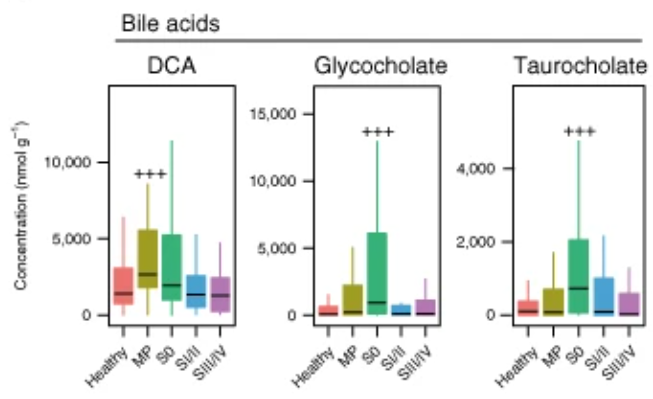

In [55]:
Image("Metabolomics/Metabolomics Documents/Bileacids_in_CRC.png")

#### In Khattab's research, the following bile acids were detected:

In [56]:
filtered_df_bile = metab_df[metab_df["Subclass"].isin(["Bile acids, alcohols and derivatives"])]
filtered_df_bile = filtered_df_bile.set_index('Metabolite Name')
filtered_df_bile.head(10)

,KEGG.ID,Super. Class,class,Subclass,CRC Colectomy\nFolfiri,CRC Follow-Up\nFolfox,CRC\nLiver Metastasis,CRC\nrecurrent,CHEBI.ID
Metabolite Name,,,,,,,,,
Taurochenodeoxycholic acid,C05465,Lipids and lipid-like molecules,Steroids and steroid derivatives,"Bile acids, alcohols and derivatives",4.62,2.01,1.78,2.01,16525
7-ketodeoxycholic acid,C04643,Lipids and lipid-like molecules,Steroids and steroid derivatives,"Bile acids, alcohols and derivatives",5.74,4.35,6.84,4.35,16390
Chenodeoxycholic acid 3-sulfate,CHEBI:89060,Lipids and lipid-like molecules,Steroids and steroid derivatives,"Bile acids, alcohols and derivatives",5.25,0.09,-0.85,3.25,89060
Cholic acid,C00695,Lipids and lipid-like molecules,Steroids and steroid derivatives,"Bile acids, alcohols and derivatives",1.85,-0.18,-0.51,-0.18,16359
Glycocholic acid,C01921,Lipids and lipid-like molecules,Steroids and steroid derivatives,"Bile acids, alcohols and derivatives",2.84,1.79,4.90,1.79,17687


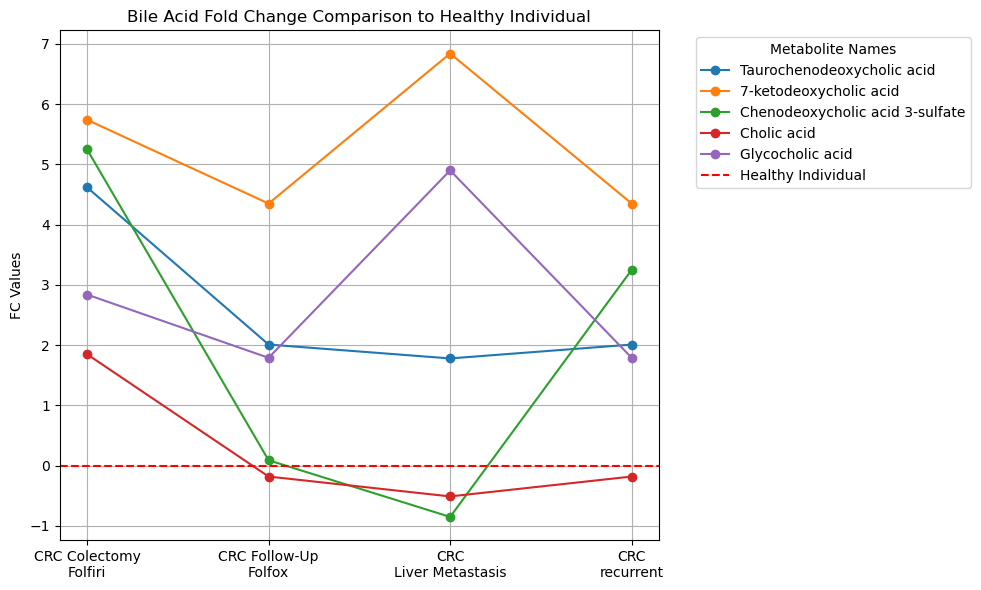

In [57]:
# Step 1: Create a figure for plotting
plt.figure(figsize=(10, 6))

# Step 2: Loop through all rows to plot each one
for i, row_data in filtered_df_bile.iterrows():  # Use iterrows() to loop through rows
    # Extract the data from columns 5, 6, 7, 8 (indexed as 4 to 7)
    row_values = row_data[4:8]  # Select the columns 5, 6, 7, 8 for this row
    metabolite_name = row_data.name  # Get the index (metabolite name)
    
    # Plot the data for this row
    plt.plot(row_values.index, row_values.values, marker='o', label=metabolite_name)

# Step 3: Customize the plot
# plt.xlabel('Different CRC Patients')
plt.axhline(y=0, color='red', linestyle='--', label='Healthy Individual')  # '--' creates a dashed line

plt.ylabel('FC Values')
plt.title('Bile Acid Fold Change Comparison to Healthy Individual')
plt.legend(title='Metabolite Names', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move the legend outside

# Step 4: Show grid and plot
plt.grid(True)
plt.tight_layout()  # Ensures labels and legend don't overlap
plt.show()


#### In the metabolite analysis of Khattab et al.:
    1) DCA (deoxycholic acid), increased in MP goup in Yachida's research, was not encountered directly among Khattab's finding.
        Instead, its former metabolite cholic acid was found in high concentrations in colerectomt+folfiri patient.
        And 3alpha,12alpha-dihydroxy-7-oxo-5beta-cholanic acid, its further metabolized form, was detected strongly in all cancer patients.

    2) Glychocholate and taurocholate were shown to be high in S0 stage patients by Yachida et al.
        Similarly, glycocholic acid was high in all patients but especially for the metastasis patient.     
        
    3) Metabolized products of chenodeoxycholic acid (the 2nd major primary bileacid) was found as 3b-Hydroxy-5-cholenoic acid (lithocholic acid) 
        in recurrent cancer patient. But it was not measured in other patients and cannot be compared.
        
    4)  Taurochenodeoxycholic acid was measured in all patients, being especially high in colerectomy+folfiri patient.
   

# 3.5) Overview of Findings from Metabolomics Analysis

In the metabolomics analysis, we first observed with principle component analysis that among the 4 CRC patients the patient with liver metastasis and the patient with combined treatment of colectomy and folfiri may display unique differences.

**For the Folfiri treated patient**, we could observe with the heatmap that arachidonic acid was depleted in comparison to other patients, which is an indicator of lesser inflamation. Similarly, xanthine was depleted compared to the healthy individual, whereas this was an increased value for other patients. On the other hand, breakdown product of xanthine called "uric acid" was only increased in this patient and did not greatly differ in other CRC patients compared to the healthy control. In this patient, arachidonic acid was depleted, which is involved in inflammation regulation and immune cell activity, whereas taurocholic acid was increased, which is a human bile acid, not metabolized by gut microbiome.

Overall comparison of bile acid concentrations in this patient revealed that it showed the highest concentrations of 
- cholic acid,
- chenodeoxycholic acid-3-sulfate in addition to the
- taurocholic acid.

An the second highest concentration of 
- 7-ketodeoxycholic acid and
- glychocholic acid,
whereas both concentrations were higher in the liver metastasis patient.

High concentrations of chenodeoxycholic acid-3-sulfate may indicate the strong presence of sulfate-reducing bacteria as well as high bile salt sulfotransferase activity of the host liver. In fact, this metabolite was found in lowest concentrations in the liver metastatic patient.

Similarly, high 7-ketodeoxycholic acid may indicate strong bacterial activity, especially Firmicutes and Clostridium strains may be involved (1).

The other three bile acids with high concentrations (cholic acid, taurocholic acid, glychocholic acid) indicate an overall lower microbial activity in gut, as otherwise these acids would get deconjugated and metabolized to forms such as deoxycholic acid.

From these finding, we can infer that there is a chance of having overall less microbial activity in the folfiri treated patient, even though the presence of some strains may be more pronounced, such as those involved in sulfotransferase activity, or oxidation of deoxycholic acid to 7-ketodeoxycholic acid, such as Clostridium scindens (1). In fact, increased bacterial conversion of cholic acid to deoxycholic acid was shown to cause increased DNA damage and colorectal cancer (2).

Using the Reactome website for fecal disease indicating metabolites, metabolites involved in the principle component separation of this patient were used for metabolite enrichment and the main findings included overespressed glucose transporters, increased nucleic acid metabolism and DNA repair, inhibited programmed cell death, impaired bile acid flow and increased susceptibility to bacterial infections.

As the majority of the loadings of PC1 were human metabolites, these metabolites were assessed with MetaboAnalyst website to both the "human metabolites" database and "disease signatures of fecal metabolites" database. In addition to mapping to primary bile acid biosynthesis and amino acid metabolism, also the glyoxylate and dicarboxylate metabolism was shown to be increased. These metabolites were shown by previous research to be correlated to diseases like obesity, where they are used as precursors of amino, fatty and organic acids (3). Interestingly, the comparison of these findings to proteomics results revelead similarities and taxonomic annotaions obtained from the proteomics might indicate which strains might be involved in these pathways.

Finally, regardin the amino acid concentrations, leucine, glycine and homoserine were depleted, whereas to one quarter of the levels of helthy individual, whereas the serine concentration was around 13 times higher, which is a source for the synthesis of other amino acids as well as a major donor of one-carbon units, which are essential for the synthesis of nucleotides, methylation reactions, and NADPH production.

**For the patient with liver metastasis**, glychocholic acid and 7-ketodeoxycholic acid were at least twice as high as the other CRC patients, and showed, compared to the healthy individual, concentration as high as 10 or 15 times, respectively. Additionally, this patient showed the most depleted chenodeoxycholic acid-3-sulfate concentrations, slightly more than the half of the healthy individual. 

The high concentration of glychocholic acid in comparison to cholic acid possibly indicates that mircobiome involved in deconjugation of glycin is less acive in this patient. Additionally, the concentration of chenodeoxycholic acid-3-sulfate might be of interest, as its depletion is likely due to compromised liver funtion in this patient, whereas the folfiri treated patient showed a 4-fold increase in the concentrations of this metabolite. However, folfiri is a toxic drug and implications can be toxicity to liver, toxicity to the gut microbiome or successful anti-tumor properties. 

Due to time limitations, different type of bacteria with annotated abilities for these pathways have not benn investigated and not yet compared to the taxa from the metagenomics and metaproteomics part of this study.

1. Marion et al. (2018), In vitro and in vivo characterization of Clostridium scindens bile acid transformations. doi: 10.1080/19490976.2018.1549420

2. Ridlon et al. (2016), Taurocholic acid metabolism by gut microbes and colon cancer. Gut Microbes, 7(3), 201–215. doi: 10.1080/19490976.2016.1150414

3. Proffitt et al. (2022), Genome-scale metabolic modelling of the human gut microbiome reveals changes in the glyoxylate and dicarboxylate metabolism in metabolic disorders, doi: 10.1016/j.isci.2022.104513



# 4) Limitations & Future Perspectives

This pilot study focuses on post-menopause female patients and the findings should be associated specifically with that group. Menopause is known to be the starting phase of significant decrease in female sexual hormone levels and was shown to increase the risk of colorectal cancers. Four different CRC conditions, represented by one patient each, were compared to a single healty individual and the sampling size of one person for each condition renders a significant conclusion impossible. However, the findings can serve as a means of comparison to literature and an indicator for further research. The authors indicate in their abstract that the goal of their study is the dentification of up- or downregulated proteins and metabolites. Nevertheless, I believe that with this size of patient groups, it might make more sense to use a targeted metabolomics approach and aim for detection of the metabolites and proteins that are already backed by the literature as indicators of CRC.  

Some additional limitations are the same geographic location of all analyzed CRC patients, thus the findings may not translate well to other regions or ethno-cultural groups. Specifically,   patients may have region-specific diets that can significantly impact the gut microbiome diversity and their response in cancer conditions. As all patients were post-menopause females, the implications of these findings for males or younger females are not known.

Overall, the majority of detected metabolite changes are in a amino, nucleic and bile acid levels, whereas the first two group may originate either from the host itself or from the gut microbiome. Using the raw spectra from LC-MS/MS measurements of Khattab et al. and mapping them to microbial protein database that we created using the raw data from Tanca et al.(2022), we were able to demonstrate that microbial community may be involved in the synthesis of amino and nucleic acids. Additionally, GO terms indicated a strong fattty acid biosynthesis by the microbiome. 

Some metabolite concentrations indicated different gut microbe diversity, such as the metabolic conversion rate of primary bile acids to oxidated form 7-ketodeoxycholic acid or to the sulfonated form chenodeoxycholic acid-3-sulfate. 

As the future steps, we would suggest investigating which microbial species may be involved in such conversions and whether high chenodeoxycholic acid-3-sulfate concentrations in Folfiri treated and recurrent CRC patients correlated with such species observed from the taxonomic analyses from metagenomics and metaproteomics data. Similarly, whether the GO terms in these patient indicated any such activity remains to be investigated.

Overall, it proved inefficient to handle loadings of each princple component together, even thoug some contributed positively and others negatively. This approach mapped both the enhanced and depleted pathways together as one group and made the interpretation and comparison of findings difficult. For enrichment and pathway analyses, positive contributors of each principle component should be analyzed separately to discover enriched pathways, whereas the encihment analysis of depleted metabolites. This approach would enable the comparison of metabolomics data with functional annotations from GO terms of proteomics.


We observed that even for the small size of the study, the overall findings were in concordance with the current literature, however the claims made by tha paper require further proof. Especially the claim of increased **bacterial** de novo nucleotide and amino acid synthesis could potentially be tested with methods like ¹³C-isotope tracing, where molecules that only specific bacteria can consume are marked with these isotopes and added to the diet of patients. Alternetively, individual microbial cells could be selected from the fecal sample through cell sorting methods and analyzed separately for their metabolic activity. 

Throughout the paper, we observed non-coherent claims, such as the abstract mentioned 158 differentially expressed metabolites, whereas the supplied data (found in Table 5 and 6 of the Supplementary Data 1) involved only 100 differentially expressed metabolites.

Ultimately, we confirm that metabolomics annotation is a complex task worthy of rigorous work and believe that with the technological advances in artificial intelligence and foundation models, data obtained from multitude of patients will be analyzed in terms of significant differences on different levels of meta-omics. Thiw will also allow automated comparison to involved metabolic pathways and possible therapeutic approaches will be estiamted more efficiently.

